# PART 1. Data Pre-processing

Fire the system

In [ ]:
# import libraries
import pandas as pd
import numpy as np
import tensorflow as tf
import seaborn as sns
from matplotlib import pyplot
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Flatten
from keras.layers import LSTM
from keras.layers import RepeatVector
from keras.layers import TimeDistributed
from numpy import array
from math import sqrt
from sklearn.metrics import mean_squared_error
from numpy import split
from numpy import mean
from numpy import std
from tensorflow.keras.callbacks import EarlyStopping
import matplotlib.pyplot as plt
from datetime import datetime
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import Dropout
from keras import Input, Model
from keras.layers import Flatten
from keras.layers import ConvLSTM2D

Read the data

In [ ]:
# download the dataset
from google.colab import drive
drive.mount("/content/drive")
# load the the file
df = pd.read_excel('/content/drive/My Drive/China.xlsx',sheet_name='China_Pri')

Mounted at /content/drive


Data pre-processing

In [ ]:
df.head(5)

,Date,Volume,Gross_Weight,Day_dif,Day,Week_Number,Months,Year,Season,Unnamed: 9,Date.1,Unnamed: 11,Unnamed: 12,Unnamed: 13,Unnamed: 14,Unnamed: 15,Unnamed: 16,Unnamed: 17,Unnamed: 18
0,2021-01-04,6.127,1096.6,0,måndag,1.000000,1,2021,winter,NaN,2021.01.04,1,4,4,0.571429,NaN,1.0,31.0,31.0
1,2021-01-05,3.733,557.0,1,tisdag,1.000000,1,2021,winter,NaN,2021.01.05,1,5,5,0.714286,NaN,2.0,28.0,59.0
2,2021-01-07,5.022,782.7,2,torsdag,1.000000,1,2021,winter,NaN,2021.01.07,1,7,7,1.000000,NaN,3.0,31.0,90.0
3,2021-01-08,5.181,1057.8,1,fredag,1.142857,1,2021,winter,NaN,2021.01.08,1,8,8,1.142857,NaN,4.0,30.0,120.0
4,2021-01-11,2.453,506.2,3,måndag,1.571429,1,2021,winter,NaN,2021.01.11,1,11,11,1.571429,NaN,5.0,31.0,151.0


In [ ]:
# Encode the 'Season' column which contains categorical data using pandas.factorize()
df['Year_encoded'] = pd.factorize(df['Year'])[0]
df['Season_encoded'] = pd.factorize(df['Season'])[0]
df['Day_encoded'] = pd.factorize(df['Day'])[0]

In [ ]:
df.head(5)

,Date,Volume,Gross_Weight,Day_dif,Day,Week_Number,Months,Year,Season,Unnamed: 9,...,Unnamed: 12,Unnamed: 13,Unnamed: 14,Unnamed: 15,Unnamed: 16,Unnamed: 17,Unnamed: 18,Year_encoded,Season_encoded,Day_encoded
0,2021-01-04,6.127,1096.6,0,måndag,1.000000,1,2021,winter,NaN,...,4,4,0.571429,NaN,1.0,31.0,31.0,0,0,0
1,2021-01-05,3.733,557.0,1,tisdag,1.000000,1,2021,winter,NaN,...,5,5,0.714286,NaN,2.0,28.0,59.0,0,0,1
2,2021-01-07,5.022,782.7,2,torsdag,1.000000,1,2021,winter,NaN,...,7,7,1.000000,NaN,3.0,31.0,90.0,0,0,2
3,2021-01-08,5.181,1057.8,1,fredag,1.142857,1,2021,winter,NaN,...,8,8,1.142857,NaN,4.0,30.0,120.0,0,0,3
4,2021-01-11,2.453,506.2,3,måndag,1.571429,1,2021,winter,NaN,...,11,11,1.571429,NaN,5.0,31.0,151.0,0,0,0


In [ ]:
# Drop the 'Year', 'Season' and 'Day' columns since we have encoded columns
df=df.drop(['Year','Season','Day'], axis=1)
df.head(5)

,Date,Volume,Gross_Weight,Day_dif,Week_Number,Months,Unnamed: 9,Date.1,Unnamed: 11,Unnamed: 12,Unnamed: 13,Unnamed: 14,Unnamed: 15,Unnamed: 16,Unnamed: 17,Unnamed: 18,Year_encoded,Season_encoded,Day_encoded
0,2021-01-04,6.127,1096.6,0,1.000000,1,NaN,2021.01.04,1,4,4,0.571429,NaN,1.0,31.0,31.0,0,0,0
1,2021-01-05,3.733,557.0,1,1.000000,1,NaN,2021.01.05,1,5,5,0.714286,NaN,2.0,28.0,59.0,0,0,1
2,2021-01-07,5.022,782.7,2,1.000000,1,NaN,2021.01.07,1,7,7,1.000000,NaN,3.0,31.0,90.0,0,0,2
3,2021-01-08,5.181,1057.8,1,1.142857,1,NaN,2021.01.08,1,8,8,1.142857,NaN,4.0,30.0,120.0,0,0,3
4,2021-01-11,2.453,506.2,3,1.571429,1,NaN,2021.01.11,1,11,11,1.571429,NaN,5.0,31.0,151.0,0,0,0


In [ ]:
# Check the data types
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 496 entries, 0 to 495
Data columns (total 19 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Date            496 non-null    object 
 1   Volume          496 non-null    float64
 2   Gross_Weight    496 non-null    float64
 3   Day_dif         496 non-null    int64  
 4   Week_Number     496 non-null    float64
 5   Months          496 non-null    int64  
 6   Unnamed: 9      0 non-null      float64
 7   Date.1          496 non-null    object 
 8   Unnamed: 11     496 non-null    int64  
 9   Unnamed: 12     496 non-null    int64  
 10  Unnamed: 13     496 non-null    int64  
 11  Unnamed: 14     496 non-null    float64
 12  Unnamed: 15     0 non-null      float64
 13  Unnamed: 16     12 non-null     float64
 14  Unnamed: 17     12 non-null     float64
 15  Unnamed: 18     12 non-null     float64
 16  Year_encoded    496 non-null    int64  
 17  Season_encoded  496 non-null    int

In [ ]:
# Check the data types
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 496 entries, 0 to 495
Data columns (total 19 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Date            496 non-null    object 
 1   Volume          496 non-null    float64
 2   Gross_Weight    496 non-null    float64
 3   Day_dif         496 non-null    int64  
 4   Week_Number     496 non-null    float64
 5   Months          496 non-null    int64  
 6   Unnamed: 9      0 non-null      float64
 7   Date.1          496 non-null    object 
 8   Unnamed: 11     496 non-null    int64  
 9   Unnamed: 12     496 non-null    int64  
 10  Unnamed: 13     496 non-null    int64  
 11  Unnamed: 14     496 non-null    float64
 12  Unnamed: 15     0 non-null      float64
 13  Unnamed: 16     12 non-null     float64
 14  Unnamed: 17     12 non-null     float64
 15  Unnamed: 18     12 non-null     float64
 16  Year_encoded    496 non-null    int64  
 17  Season_encoded  496 non-null    int

In [ ]:
print("Rows", df.shape[0])
print("Columns", df.shape[1])
print("Features", df.columns.tolist())
print("Missing values", df.isnull().any())

Rows 496
Columns 19
Features ['Date', 'Volume', 'Gross_Weight', 'Day_dif', 'Week_Number', 'Months', 'Unnamed: 9', 'Date.1', 'Unnamed: 11', 'Unnamed: 12', 'Unnamed: 13', 'Unnamed: 14', 'Unnamed: 15', 'Unnamed: 16', 'Unnamed: 17', 'Unnamed: 18', 'Year_encoded', 'Season_encoded', 'Day_encoded']
Missing values Date              False
Volume            False
Gross_Weight      False
Day_dif           False
Week_Number       False
Months            False
Unnamed: 9         True
Date.1            False
Unnamed: 11       False
Unnamed: 12       False
Unnamed: 13       False
Unnamed: 14       False
Unnamed: 15        True
Unnamed: 16        True
Unnamed: 17        True
Unnamed: 18        True
Year_encoded      False
Season_encoded    False
Day_encoded       False
dtype: bool


array([<Axes: xlabel='Date'>, <Axes: xlabel='Date'>,
       <Axes: xlabel='Date'>, <Axes: xlabel='Date'>,
       <Axes: xlabel='Date'>, <Axes: xlabel='Date'>,
       <Axes: xlabel='Date'>, <Axes: xlabel='Date'>], dtype=object)

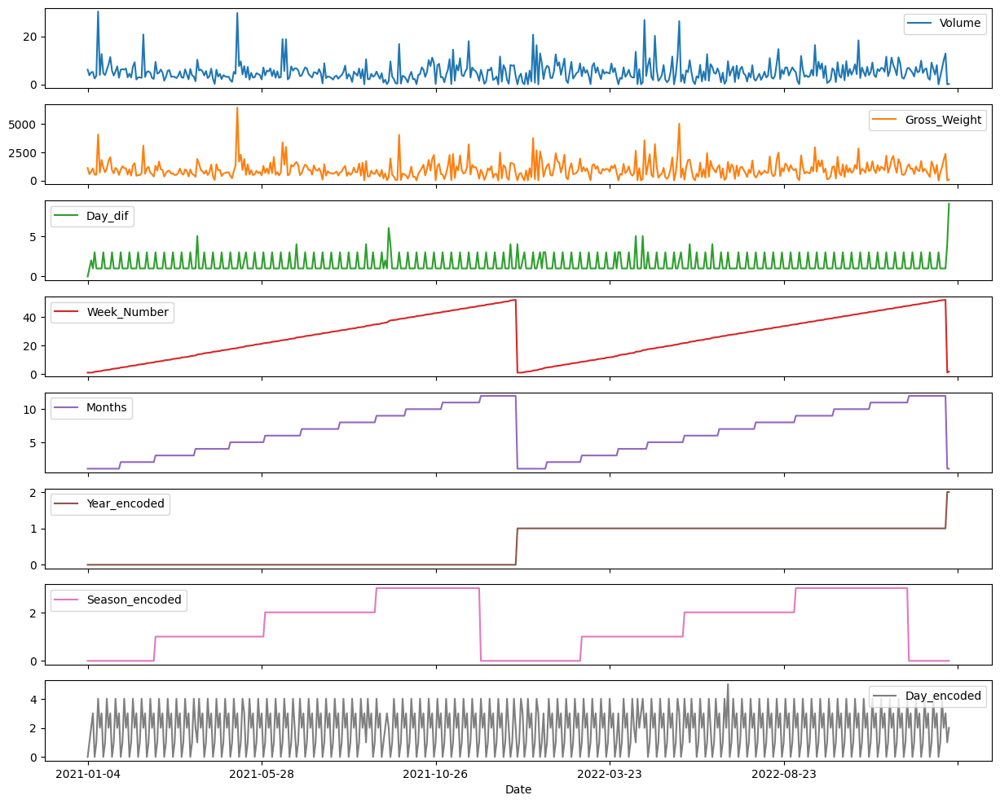

In [ ]:
# Create a plot for each of variables
df.set_index('Date')[['Volume', 'Gross_Weight', 'Day_dif', 'Week_Number', 'Months', 'Year_encoded', 'Season_encoded', 'Day_encoded']].plot(subplots=True,figsize=(15, 12))

In [ ]:
# All variables will be my input
df_input=df[['Date','Volume', 'Gross_Weight', 'Day_dif', 'Week_Number', 'Months', 'Year_encoded', 'Season_encoded', 'Day_encoded']]


In [ ]:
df_input.head(5)

,Date,Volume,Gross_Weight,Day_dif,Week_Number,Months,Year_encoded,Season_encoded,Day_encoded
0,2021-01-04,6.127,1096.6,0,1.000000,1,0,0,0
1,2021-01-05,3.733,557.0,1,1.000000,1,0,0,1
2,2021-01-07,5.022,782.7,2,1.000000,1,0,0,2
3,2021-01-08,5.181,1057.8,1,1.142857,1,0,0,3
4,2021-01-11,2.453,506.2,3,1.571429,1,0,0,0


In [ ]:
df_input[['Volume', 'Gross_Weight', 'Day_dif', 'Week_Number', 'Months', 'Year_encoded', 'Season_encoded', 'Day_encoded']].describe()

,Volume,Gross_Weight,Day_dif,Week_Number,Months,Year_encoded,Season_encoded,Day_encoded
count,496.000000,496.000000,496.000000,496.000000,496.000000,496.000000,496.000000,496.000000
mean,5.189550,963.377823,1.487903,26.438076,6.598790,0.506048,1.518145,1.995968
std,4.029462,728.159264,0.978483,15.063363,3.448659,0.508477,1.115399,1.418487
min,0.006000,0.400000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000
25%,2.823000,510.725000,1.000000,13.321429,4.000000,0.000000,1.000000,1.000000
50%,4.453500,827.899000,1.000000,26.714286,7.000000,1.000000,2.000000,2.000000
75%,6.616750,1253.815000,1.000000,39.714286,10.000000,1.000000,3.000000,3.000000
max,30.360000,6427.500000,9.000000,52.000000,12.000000,2.000000,3.000000,5.000000


In [ ]:
# Remove the outliers from the dataset
# Calculate the first and third quartiles
q1 = df_input['Volume'].quantile(0.25)
q3 = df_input['Volume'].quantile(0.75)

# Calculate the interquartile range
iqr = q3 - q1

# Determine the upper and lower limits for outliers
upper_limit = q3 + 1.5*iqr
lower_limit = q1 - 1.5*iqr

df_input = df_input[(df_input['Volume'] >= lower_limit) & (df_input['Volume'] <= upper_limit)]


In [ ]:
df_input

,Date,Volume,Gross_Weight,Day_dif,Week_Number,Months,Year_encoded,Season_encoded,Day_encoded
0,2021-01-04,6.127,1096.60,0,1.000000,1,0,0,0
1,2021-01-05,3.733,557.00,1,1.000000,1,0,0,1
2,2021-01-07,5.022,782.70,2,1.000000,1,0,0,2
3,2021-01-08,5.181,1057.80,1,1.142857,1,0,0,3
4,2021-01-11,2.453,506.20,3,1.571429,1,0,0,0
...,...,...,...,...,...,...,...,...,...
490,2022-12-27,3.199,674.58,1,51.571429,12,1,0,1
491,2022-12-28,6.539,1168.74,1,51.714286,12,1,0,4
492,2022-12-29,10.126,1834.85,1,51.857143,12,1,0,2
494,2023-01-03,0.006,1.84,4,1.000000,1,2,0,1


In [ ]:
# Outliers are eliminated
df_input.describe()

,Volume,Gross_Weight,Day_dif,Week_Number,Months,Year_encoded,Season_encoded,Day_encoded
count,474.000000,474.000000,474.000000,474.000000,474.000000,474.000000,474.000000,474.00000
mean,4.575932,860.488409,1.483122,26.650995,6.651899,0.502110,1.529536,2.00000
std,2.667801,518.656793,0.973611,14.990395,3.432084,0.508902,1.111240,1.42464
min,0.006000,0.400000,0.000000,1.000000,1.000000,0.000000,0.000000,0.00000
25%,2.751000,500.185000,1.000000,13.607143,4.000000,0.000000,1.000000,1.00000
50%,4.256500,785.950000,1.000000,27.071429,7.000000,0.000000,2.000000,2.00000
75%,6.300250,1190.390000,1.000000,39.821429,10.000000,1.000000,3.000000,3.00000
max,11.836000,2464.560000,9.000000,52.000000,12.000000,2.000000,3.000000,5.00000


In [ ]:
aq_corr=df_input[['Volume', 'Gross_Weight', 'Day_dif', 'Week_Number', 'Months', 'Year_encoded', 'Season_encoded', 'Day_encoded']].corr(method='pearson')
aq_corr

,Volume,Gross_Weight,Day_dif,Week_Number,Months,Year_encoded,Season_encoded,Day_encoded
Volume,1.000000,0.945303,-0.053943,0.089485,0.086931,0.049078,0.019275,0.042655
Gross_Weight,0.945303,1.000000,-0.042718,0.077759,0.076877,0.036435,0.036235,0.035093
Day_dif,-0.053943,-0.042718,1.000000,-0.061824,-0.062817,0.068344,-0.039597,-0.560914
Week_Number,0.089485,0.077759,-0.061824,1.000000,0.996481,0.010311,0.552815,0.018116
Months,0.086931,0.076877,-0.062817,0.996481,1.000000,0.013131,0.554543,0.018593
Year_encoded,0.049078,0.036435,0.068344,0.010311,0.013131,1.000000,0.014844,0.002916
Season_encoded,0.019275,0.036235,-0.039597,0.552815,0.554543,0.014844,1.000000,0.020032
Day_encoded,0.042655,0.035093,-0.560914,0.018116,0.018593,0.002916,0.020032,1.000000


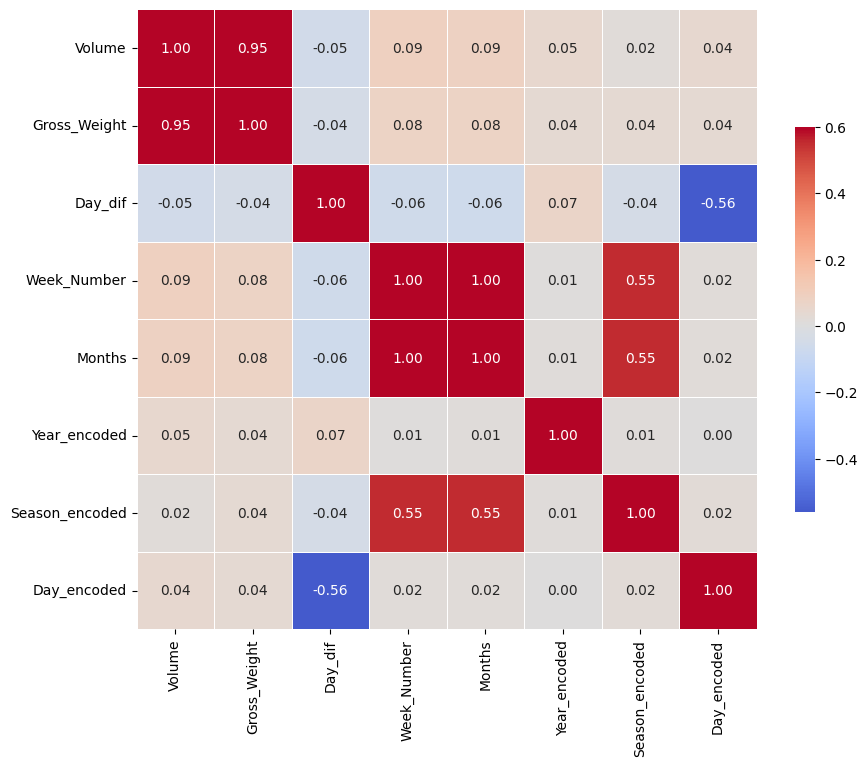

In [ ]:
g = sns.heatmap(aq_corr,  vmax=.6, center=0,square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True, fmt='.2f', cmap='coolwarm')
g.figure.set_size_inches(10,10)

pyplot.show()

In [ ]:
# standardize the dataset
#df_input=df_input[['Volume', 'Gross_Weight', 'Day_dif', 'Week_Number', 'Months', 'Year_encoded', 'Season_encoded', 'Day_encoded']]

#scaler= StandardScaler()
#scaler=scaler.fit(df_input)
#df_input=scaler.transform(df_input)

The function named 'split_dataset' which takes a pandas DataFrame object 'df_input' as an argument, and it returns two numpy arrays 'train' and 'test' containing the training and testing sets of the original dataset. Finally, the 'split' function of numpy restructures the training and testing sets into equal bulks. Each bulk contains equal rows. In that way, 'split' function splits the arrays along a given axis into multiple sub-arrays.

In [ ]:
# split a dataset into train/test sets
def split_dataset(df_input,t):
  train, test = df_input[0:t], df_input[t:-s]

  #print("trainlen",len(train))
  #print("testlen",len(test))

  # restructure bulks equally
  # by using 'split' function, dataframe is converted to numpy array from 2d to 3d
  train = array(split(train, len(train)/bulks))
  test = array(split(test, len(test)/bulks))

  #print("train",train)
  #print("test",test)
  return train, test

This function evaluates the accuracy of a set of predicted values against their corresponding actual values. It calculates the Root Mean Squared Error (RMSE) for each day, and an overall RMSE for the entire set of predicted values.

The function takes in two numpy arrays: "actual" and "predicted". "actual" is a 2D array where each row represents a day and each column represents a variable. "predicted" is also a 2D array with the same shape as "actual". Each element in "predicted" represents the predicted value for the corresponding element in "actual".

The function first calculates the RMSE for each day by calling the "mean_squared_error" function from the "sklearn.metrics" library and then taking the square root of the result. The RMSE scores for each day are stored in a list called "scores".

Next, the function calculates an overall RMSE for the entire set of predicted values. It does this by first summing the squared differences between each predicted and actual value, and then dividing by the total number of elements in the arrays. The square root of this result gives the overall RMSE score.

Finally, the function returns both the overall RMSE and the list of RMSE scores for each day.

In [ ]:
# evaluate one or more forecasts against expected values
def evaluate_forecasts(actual, predicted):
  scores = list()
  #print("actual",actual)
  #print("predicted",predicted)

  # calculate an RMSE score for each day
  for i in range(actual.shape[1]):
    # calculate mse
    mse = mean_squared_error(actual[:, i], predicted[:, i])
    #print("Actual",actual[:, i])
    #print("Predicted", predicted[:, i])

    # calculate rmse
    rmse = sqrt(mse)
    # store
    scores.append(rmse)

  # calculate overall RMSE
  s = 0
  for row in range(actual.shape[0]):
    for col in range(actual.shape[1]):
      s += (actual[row, col] - predicted[row, col])**2
  score = sqrt(s / (actual.shape[0] * actual.shape[1]))

  #print("Actul shape",actual.shape)
  #print("Actul",actual)
  #print("Predicted shape",predicted.shape)
  #print("Predicted",predicted)

  return score, scores

This function summarizes the RMSE scores calculated by the "evaluate_forecasts" function. It takes in three arguments: "name" is a string that specifies the name of the model or forecast being evaluated, "score" is the overall RMSE score calculated by the "evaluate_forecasts" function, and "scores" is the list of RMSE scores calculated for each day.

The function first calculates the mean and standard deviation of the list of RMSE scores using the "mean" and "std" functions from the numpy library. It then prints a summary of the results in the format of "model name: mean RMSE (+/- standard deviation)" using the "print" function.

Finally, the function creates a box and whisker plot of the RMSE scores using the "boxplot" function from the matplotlib.pyplot library. This plot shows the distribution of the RMSE scores, including the median, quartiles, and outliers. The plot is displayed using the "show" function.

In [ ]:
# summarize scores
def summarize_scores(name, score, scores, cfg_list):
  # calculate mean and standard deviation of scores
  scores_m, score_std = mean(scores), std(scores)

  print('%s: %.3f RMSE (+/- %.3f) cfg_list %s' % (name, scores_m, score_std, cfg_list))
  # create tuple dictionary with summary information
  summary = {"name": name, "score_mean": (scores_m), "cfg_list": cfg_list}

  # box and whisker plot
  pyplot.boxplot(scores)
  pyplot.show()

  return summary

This 'to_supervised' function takes three arguments:

dt: a three-dimensional numpy array representing time series data

n_input: the number of time steps to use as input. we can call it as window

n_out: the number of time steps to use as output

The function first flattens the input data into a 2d array. It then defines two empty lists, X and y, to hold the input/output sequences.

The function then loops over each time step (window) in the flattened data array. For each time step, it defines the start and end indices for the input sequence (in_start and in_end) and the end indices for the output sequence (out_end). If there is enough data to form an instance with n_input input time steps and n_out output time steps, the input sequence (X) is appended to the X list and the output sequence (y) is appended to the y list.

Finally, the function returns two numpy arrays, X and y, that contain the input/output sequences.

In [ ]:
# convert history into inputs and outputs
def to_supervised(dt, n_input, n_out=5):
  # flatten data
  data_2d = dt.reshape((dt.shape[0]*dt.shape[1], dt.shape[2]))         #2d

  #print("train.shape[0] train.shape[1] train.shape[2]",dt.shape[0], dt.shape[1], dt.shape[2])
  #print("data after flatting it",data_2d)
  #print("data_2d.shape",data_2d.shape)

  X, y = list(), list()
  in_start = 0
  # step over the entire history one time step at a time
  for _ in range(len(data_2d)):
    # define the end of the input sequence. in_end and out_end indicate index number of the data
    in_end = in_start + n_input
    #print("in_end",in_end)
    out_end = in_end + n_out
    #print("out_end",out_end)

    # ensure we have enough data for this instance
    if out_end <= len(data_2d):
      X.append(data_2d[in_start:in_end, :])      #take all features
      y.append(data_2d[in_end:out_end, 0])       #take only the first column of the dataset as a target feature
    # move along one time step
    in_start += 1

  #print("array(X)", array(X))
  #print("array(y)", array(y))
  #print("array(X).shape", array(X).shape)
  #print("array(y).shape", array(y).shape)

  return array(X), array(y)

This code defines a function called build_model that takes three arguments:

train: a three-dimensional numpy array representing training time series data

test: a three-dimensional numpy array representing testing time series data

n_input: an integer representing the number of time steps to use as input

The function first calls the to_supervised function to convert the training and testing data into input/output sequences, which are stored in the train_x, train_y, test_x, and test_y variables.

It then defines the verbose, epochs, and batch_size parameters for training the model, as well as the number of time steps (n_timesteps), number of features (n_features), and number of outputs (n_outputs) for the input and output sequences.

The function reshapes the train_y array to have a shape of (number of samples, n_outputs, 1) in order to match the expected shape of the model output.

The function then defines a sequential model using the Keras API. The model consists of an LSTM layer with 200 units, a RepeatVector layer to repeat the output of the LSTM layer n_outputs times, another LSTM layer with 200 units that returns sequences, two TimeDistributed dense layers with 100 and 1 units respectively, and is compiled with mean squared error (MSE) loss and the Adam optimizer.

The function uses early stopping to stop training when the validation loss stops improving, and fits the model to the training data using the fit method.

After training, the function plots the training and validation loss history using pyplot from the matplotlib library, and prints a summary of the model architecture using the summary method.

Finally, the function returns the trained model, train_x, and train_y.

The pd.date_range() function is used to generate a sequence of dates based on the last date in the test_date. n_future, which is the number of future dates we want to predict. The freq='1d' argument specifies that we want to generate dates at a daily frequency.

In [ ]:
# train the model
def build_model(train, test, cfg_list, test_date):
  n_steps, n_length, n_nodes_Conv, n_epochs, n_batch, patience, min_delta, n_nodes_LSTM=cfg_list
  n_input = n_length * n_steps

  # prepare data
  train_x, train_y = to_supervised(train, n_input)    # array(X)==> 3d, array(y)==> 2d which comes to here

  # Here train_x is 3d but train_y is 2d but LSTMs  work with 3d data
  #print("train_x",train_x)
  #print("train_y",train_y)
  #print("test",test)
  #print("test",test.shape)

  test_x, test_y= to_supervised(test, n_input)       # array(X)==> 3d, array(y)==> 2d which come to here

  #print("test_x.shape[1]",test_x.shape[1])
  #print("test_x.shape[2]",test_x.shape[2])
  #print("test_x",test_x)
  #print("test_y",test_y)
  #print("test_x.shape",test_x.shape)
  #print("test_y.shape",test_y.shape)

  n_features, n_outputs=train_x.shape[2], train_y.shape[1]

  #print("train_x.shape[0]",train_x.shape[0])
  #print("n_features",n_features)
  #print("n_steps",n_steps)
  #print("n_length",n_length)

  # reshape into subsequences [samples, timesteps, rows, cols, channels]
  train_x = train_x.reshape((train_x.shape[0], n_steps, 1, n_length, n_features))
  test_x = test_x.reshape((test_x.shape[0], n_steps, 1, n_length, n_features))

  #n_timesteps, n_features, n_outputs = train_x.shape[1], train_x.shape[2], train_y.shape[1]

  # reshape output into [samples, timesteps, features]
  # Here train_y converted from 2d to 3d before implementation of LSTM algorithm
  train_y = train_y.reshape((train_y.shape[0], train_y.shape[1], 1))
  test_y = test_y.reshape((test_y.shape[0], test_y.shape[1], 1))
  #print("train_y.shape[0]",train_y.shape[0])
  #print("train_y.shape[1]",train_y.shape[1])

  #print("train_x",train_x)
  #print("train_y",train_y)
  #print("train_x.shape",train_x.shape)
  #print("train_y.shape",train_y.shape)

  # define model
  model = Sequential()
  model.add(ConvLSTM2D(n_nodes_Conv, (1,3), activation='relu', input_shape=(n_steps, 1, n_length, n_features)))
  model.add(Flatten())
  model.add(RepeatVector(n_outputs))
  model.add(LSTM(n_nodes_LSTM, activation='relu', return_sequences=True))
  model.add(TimeDistributed(Dense(100, activation='relu')))
  model.add(TimeDistributed(Dense(1)))
  model.compile(loss='mse', optimizer='adam', metrics=['mse','mae', 'mape'])

  # fit network
  #model_history=model.fit(train_x, train_y, epochs=epochs, batch_size=batch_size, verbose=verbose)

  # Early Stopping
  early_stopping = EarlyStopping(patience=patience,min_delta=min_delta,monitor="val_loss",restore_best_weights=True)
  model_history= model.fit(train_x, train_y, shuffle=False, epochs=n_epochs, validation_data=(test_x, test_y), batch_size=n_batch, verbose=0, callbacks=[early_stopping])

  # inverse_transform the dataset
  #scaler= StandardScaler()
  #scaler=scaler.fit(model_history)
  #model_history=scaler.inverse_transform(model_history)

  # plot metrics
  pyplot.plot(model_history.history['mse'],label='mean_squared_error')
  pyplot.plot(model_history.history['mae'],label='mean_absolute_error')
  pyplot.xlabel('epocs', fontsize=20)
  pyplot.ylabel('loss', fontsize=20)
  pyplot.legend()
  pyplot.show()

  # plot loss during training
  fig = pyplot.figure(figsize=(8, 4))
  pyplot.title('Model Loss')
  pyplot.plot(model_history.history['loss'], label='Train Loss')
  pyplot.plot(model_history.history['val_loss'], label='Test/Validation Loss')
  pyplot.xlabel('epocs', fontsize=20)
  pyplot.ylabel('loss', fontsize=20)
  pyplot.legend()
  pyplot.show()

  # print the model summary
  model.summary()
  return model, train_x, train_y, test_x

model: a machine learning model used to make predictions

history: a list of historical data used as input to the model

n_input: the number of past time steps used as input to the model

The function first flattens the history data into a 2D array and retrieves the last n_input time steps as the input data for the forecast. The input data is then reshaped into a 3D array with shape [1, n_input, n] where n is the number of features in the data. The model is used to predict the output values for the next time step based on the input data. The predicted output values are returned as a 1D array.

In [ ]:
# make a forecast
def forecast(model, history, n_steps, n_length, n_input):
  #print("data history",history)
  #print("data history shape",len(history))

  # flatten data
  data = array(history)
  #print("history",data)
  n_features=data.shape[2]
  data = data.reshape((data.shape[0]*data.shape[1], data.shape[2]))  #2d
  #print("Flattened data",data)

  # retrieve last observations for input data
  input_x = data[-n_input:, :]
  # reshape into [1, n_input, n]
  #print("input_x",input_x)
  #print("n_length",n_length)
  #print("data.shape[0]",data.shape[0])
  #print("data.shape[1]",data.shape[1])

  #print("input_x.shape[0]",input_x.shape[0])
  #print("n_features",n_features)
  #print("n_steps",n_steps)
  #print("n_length",n_length)

  input_x = input_x.reshape((1, n_steps, 1, n_length, n_features))

  #print("BEFORE model",input_x)
  #print("BEFORE model shape",input_x.shape)

  # forecast
  yhat = model.predict(input_x, verbose=0)
  #print("yhat",yhat)
  # we only want the vector forecast
  yhat = yhat[0]

  return yhat

train: a 3D numpy array of historical training data

test: a 3D numpy array of historical test data

n_input: the number of past time steps used as input to the model

The function first builds a machine learning model by calling build_model function and passing in the train, test, and n_input arguments. The history variable is then initialized with a copy of the train data. The function then loops through each week of the test data and performs a walk-forward validation. It predicts the target variable using the forecast function, which takes in the machine learning model, the history data, and the n_input argument. The predicted target variable for each week is stored in the predictions list, and the real observation for each week is added to the history variable for predicting the next week. After all the predictions have been made, the function evaluates the quality of the predictions by calling evaluate_forecasts function and passing in the true test data and the predicted predictions data. The function returns a score and a list of scores for each week, as well as the predicted predictions and history data.

In [ ]:
# evaluate the model
def evaluate_model(train, test, cfg_list, test_date):
  n_steps, n_length, n_nodes_Conv, n_epochs, n_batch, patience, min_delta, n_nodes_LSTM=cfg_list
  n_input = n_length * n_steps

  # fit model
  model, train_x, train_y, test_x= build_model(train,test,cfg_list,test_date)
  #print("train_x, train_y", len(train_x), len(train_y))

  # history is a list of data.
  #print("ttrain",train)
  #print("ttrain shape",train.shape)
  #print("ttest",test)
  history = [x for x in train]      #It holds all training dataset
  #print("history",history)
  #print("history type",type(history))

  # walk-forward validation
  test_history= list()
  test_predictions = list()
  for i in range(len(test)):
    test_history.append(test[i, :])
    # prediction
    yhat_sequence = forecast(model, test_history, n_steps, n_length, n_input)    #predicted target variables
    # store the predictions
    test_predictions.append(yhat_sequence)

  test_predictions = array(test_predictions)

  predicted_test_1d=list()
  for i in test_predictions:
    predicted_test_1d.extend(i)

  score, scores = evaluate_forecasts(test[:, :, 0], test_predictions)

  # Dimension of the test data is reduced from 3d to 1d
  test_1d=test[:,:,0]

  actual_1d=list()
  for i in test_1d:
    actual_1d.extend(i)

  #print("actual",actual_1d)
  #print("predicted_1d",predicted_1d)

  # Generate list of sequence of days for predictions of future. Weekdays are generated only. 'B' represents the business days
  n_future=10
  forecast_period_dates=pd.date_range(list(test_date)[-1],periods=n_future,freq='B').tolist()
  # Extracting only the date part using the `date()` method
  forecast_period_dates = [d.date() for d in forecast_period_dates]
  #print("datelist_future_",forecast_period_dates)

  # future forecast
  future_forecast=model.predict(test_x[-2:])
  # flatten the array to remove extra dimensions
  future_forecast = future_forecast.flatten()

  #forecast=model.predict(test_x[-n_future:])
  print("future_forecast",future_forecast)

  print("predicted_test_1d len",len(predicted_test_1d))
  print("Actual len",len(actual_1d))

  # plotting
  plt.figure(figsize=(10, 4))
  plt.title("Actual-Predicted")
  plt.xlabel("Records")
  plt.ylabel("Volume (M3)")
  plt.plot(test_date,actual_1d, label='Actual Test Data', color ="green")
  plt.plot(test_date,predicted_test_1d, label='Predictions', color ="red")
  #plt.plot(num_dates,future_forecast, label='Future Predictions', color ="blue")
  days = ['1st', '2nd', '3rd', '4th', '5th','6st', '7nd', '8th', '9th', '10th']
  x= [i for i in days]
  plt.plot(x, future_forecast, label='Future Predictions', color ="blue")

  plt.legend()
  plt.show()

  return score, scores, predicted_test_1d, model, cfg_list

In [ ]:
# create a list of configs to tune hyperparameter
def model_configs():
  # define scope of configs
  n_steps = [1]
  n_length = [3,5]
  n_nodes_Conv = [32,64]
  n_epochs = [100]
  n_batch = [16,32]
  patience= [5, 10]
  min_delta= [0.001, 0.0001]
  n_nodes_LSTM = [100,200]
  # create configs
  configs = list()
  for i in n_steps:
    for j in n_length:
      for k in n_nodes_Conv:
        for l in n_epochs:
          for m in n_batch:
            for n in patience:
              for o in min_delta:
                for p in n_nodes_LSTM:
                  cfg = [i, j, k, l, m, n, o, p]
                  configs.append(cfg)
  print('Total configs: %d' % len(configs))
  return configs

Total configs: 64


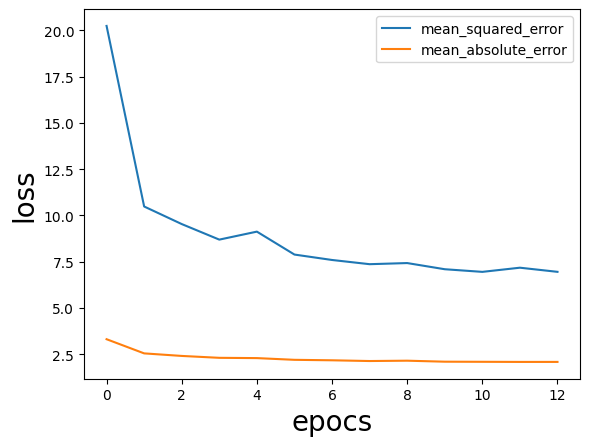

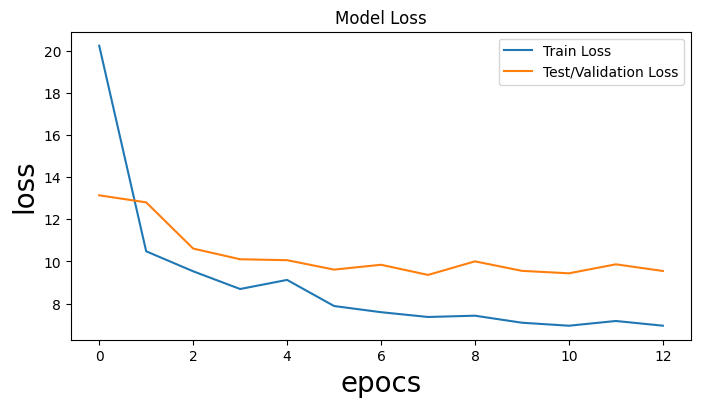

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d (ConvLSTM2D)    (None, 1, 1, 32)          15488     
                                                                 
 flatten (Flatten)           (None, 32)                0         
                                                                 
 repeat_vector (RepeatVector  (None, 5, 32)            0         
 )                                                               
                                                                 
 lstm (LSTM)                 (None, 5, 100)            53200     
                                                                 
 time_distributed (TimeDistr  (None, 5, 100)           10100     
 ibuted)                                                         
                                                                 
 time_distributed_1 (TimeDis  (None, 5, 1)             1

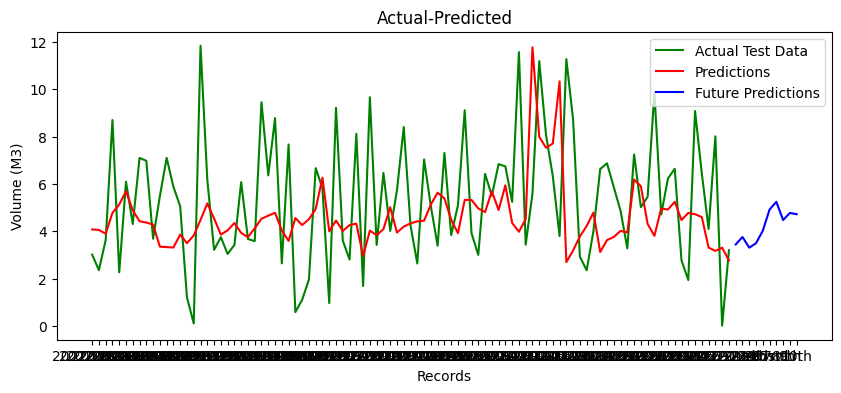

ConvLSTM: 2.872 RMSE (+/- 0.516) cfg_list [1, 3, 32, 100, 16, 5, 0.001, 100]


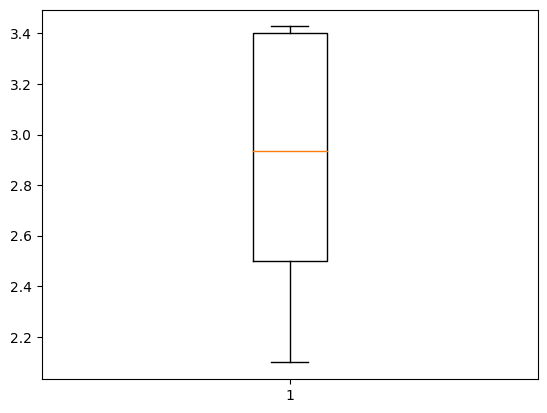

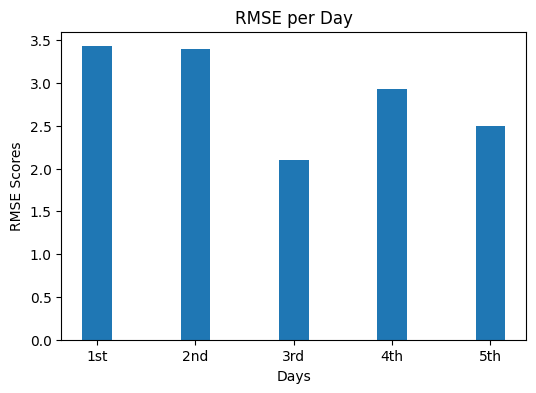

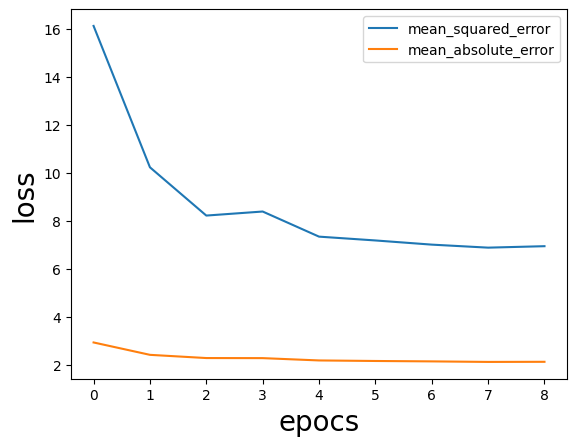

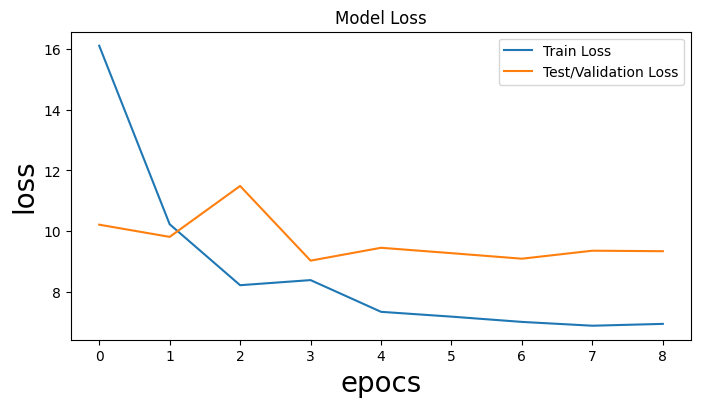

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_1 (ConvLSTM2D)  (None, 1, 1, 32)          15488     
                                                                 
 flatten_1 (Flatten)         (None, 32)                0         
                                                                 
 repeat_vector_1 (RepeatVect  (None, 5, 32)            0         
 or)                                                             
                                                                 
 lstm_1 (LSTM)               (None, 5, 200)            186400    
                                                                 
 time_distributed_2 (TimeDis  (None, 5, 100)           20100     
 tributed)                                                       
                                                                 
 time_distributed_3 (TimeDis  (None, 5, 1)            

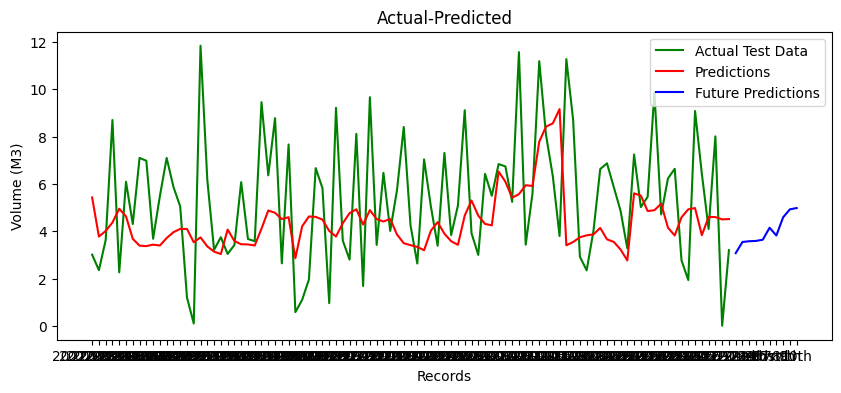

ConvLSTM: 2.807 RMSE (+/- 0.449) cfg_list [1, 3, 32, 100, 16, 5, 0.001, 200]


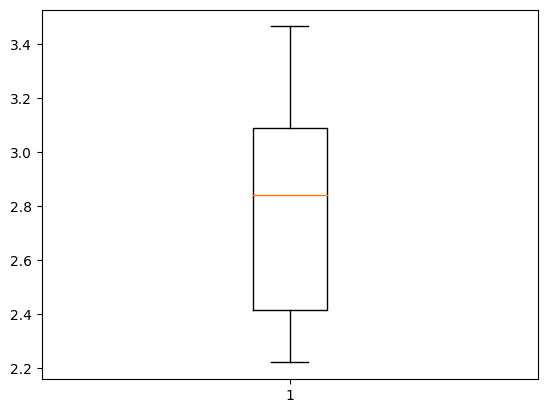

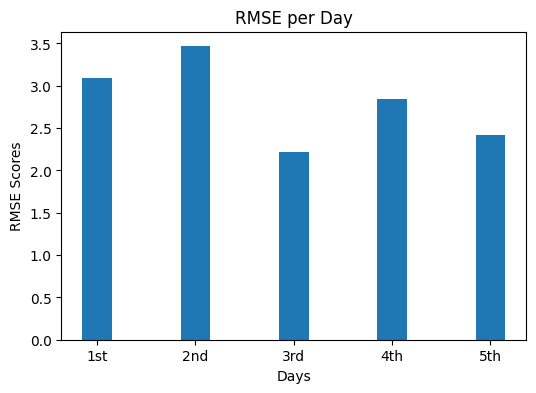

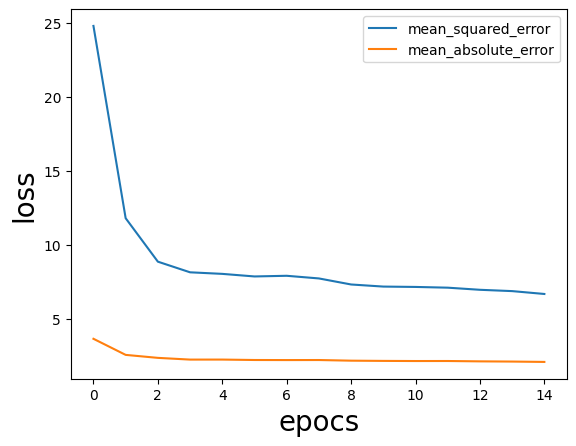

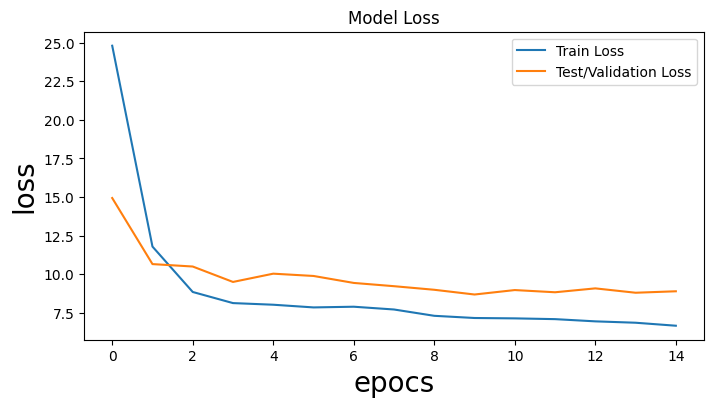

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_2 (ConvLSTM2D)  (None, 1, 1, 32)          15488     
                                                                 
 flatten_2 (Flatten)         (None, 32)                0         
                                                                 
 repeat_vector_2 (RepeatVect  (None, 5, 32)            0         
 or)                                                             
                                                                 
 lstm_2 (LSTM)               (None, 5, 100)            53200     
                                                                 
 time_distributed_4 (TimeDis  (None, 5, 100)           10100     
 tributed)                                                       
                                                                 
 time_distributed_5 (TimeDis  (None, 5, 1)            

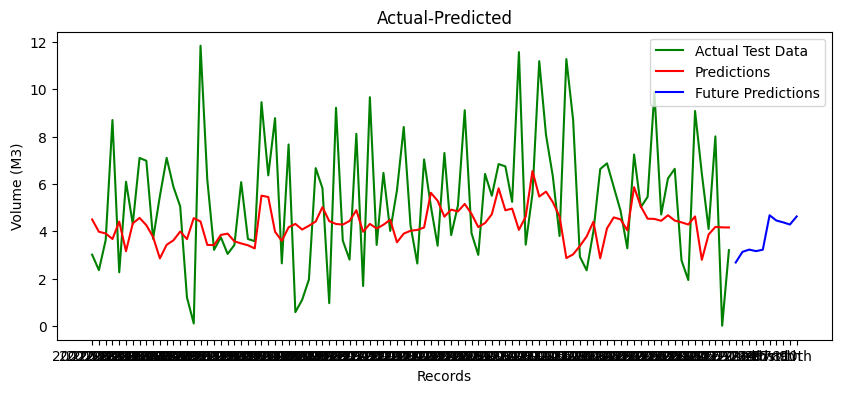

ConvLSTM: 2.775 RMSE (+/- 0.649) cfg_list [1, 3, 32, 100, 16, 5, 0.0001, 100]


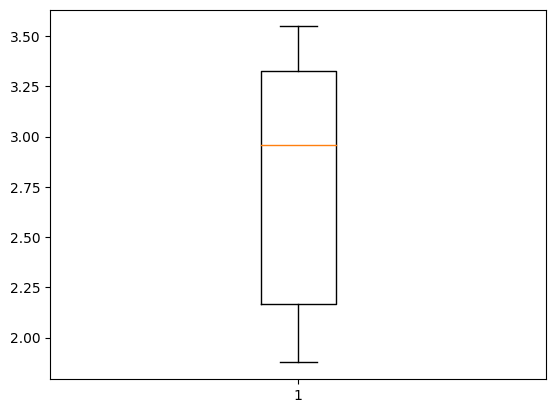

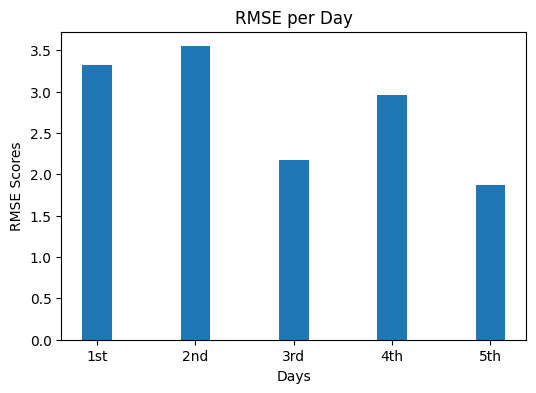

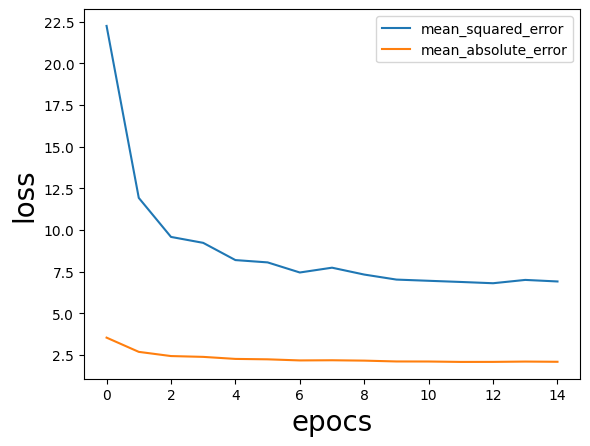

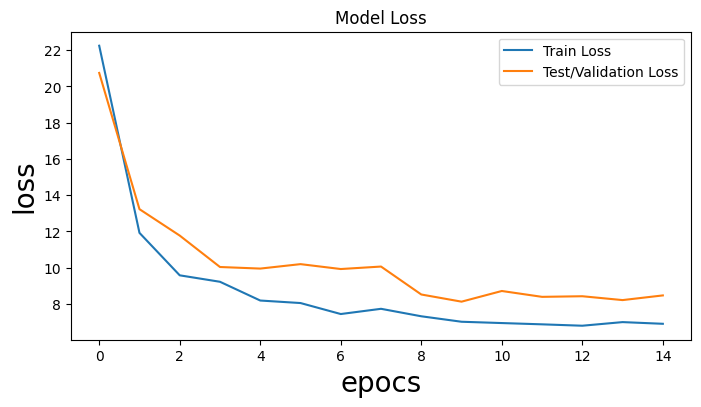

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_3 (ConvLSTM2D)  (None, 1, 1, 32)          15488     
                                                                 
 flatten_3 (Flatten)         (None, 32)                0         
                                                                 
 repeat_vector_3 (RepeatVect  (None, 5, 32)            0         
 or)                                                             
                                                                 
 lstm_3 (LSTM)               (None, 5, 200)            186400    
                                                                 
 time_distributed_6 (TimeDis  (None, 5, 100)           20100     
 tributed)                                                       
                                                                 
 time_distributed_7 (TimeDis  (None, 5, 1)            

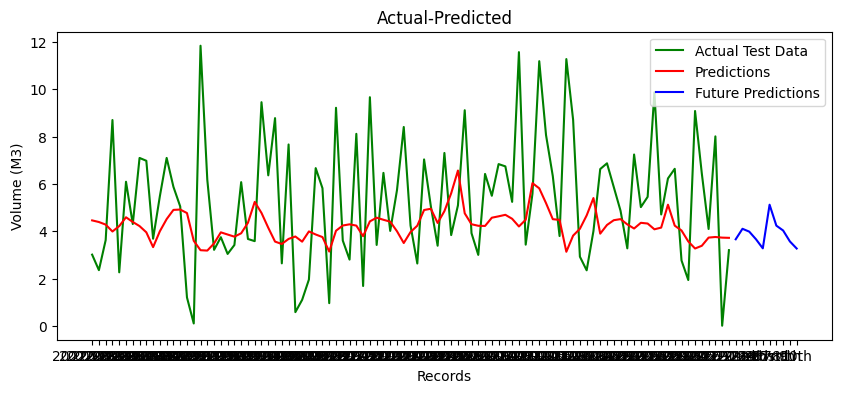

ConvLSTM: 2.851 RMSE (+/- 0.506) cfg_list [1, 3, 32, 100, 16, 5, 0.0001, 200]


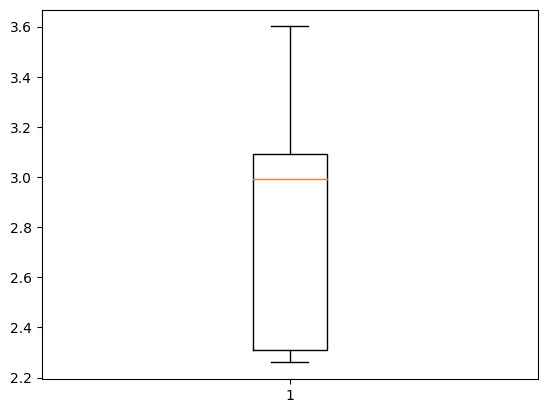

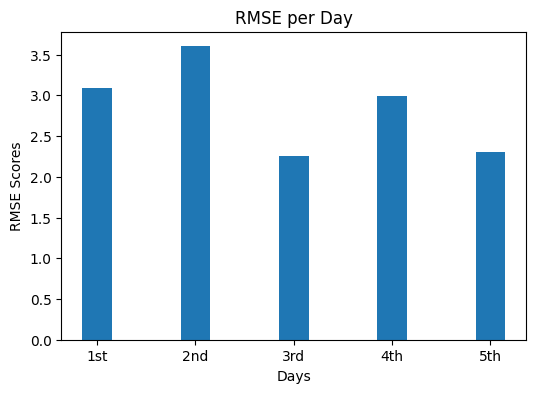

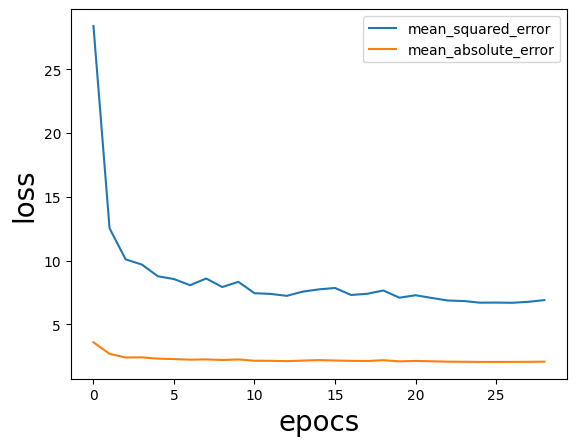

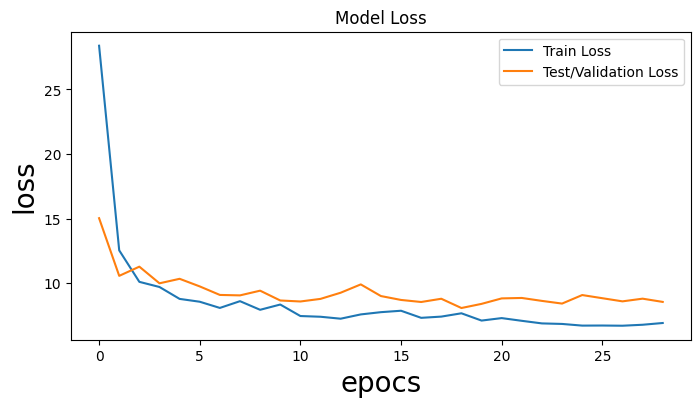

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_4 (ConvLSTM2D)  (None, 1, 1, 32)          15488     
                                                                 
 flatten_4 (Flatten)         (None, 32)                0         
                                                                 
 repeat_vector_4 (RepeatVect  (None, 5, 32)            0         
 or)                                                             
                                                                 
 lstm_4 (LSTM)               (None, 5, 100)            53200     
                                                                 
 time_distributed_8 (TimeDis  (None, 5, 100)           10100     
 tributed)                                                       
                                                                 
 time_distributed_9 (TimeDis  (None, 5, 1)            

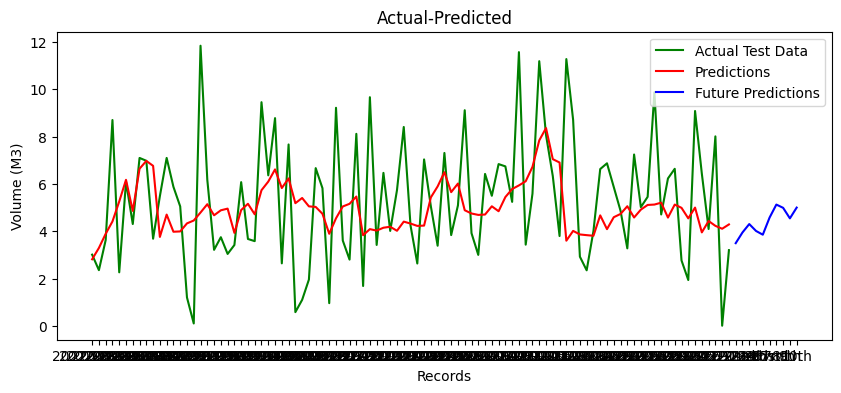

ConvLSTM: 2.544 RMSE (+/- 0.597) cfg_list [1, 3, 32, 100, 16, 10, 0.001, 100]


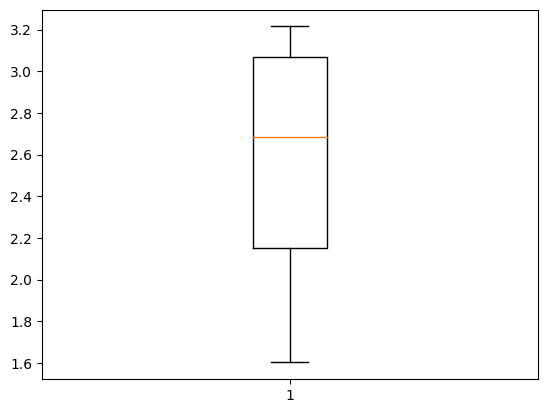

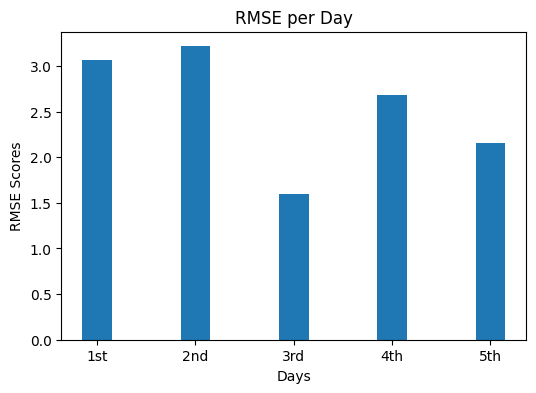

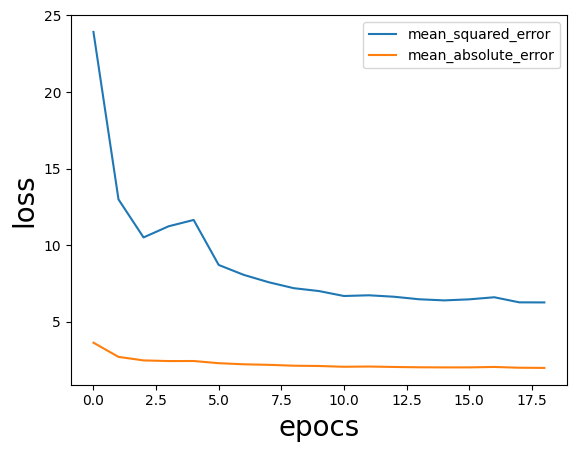

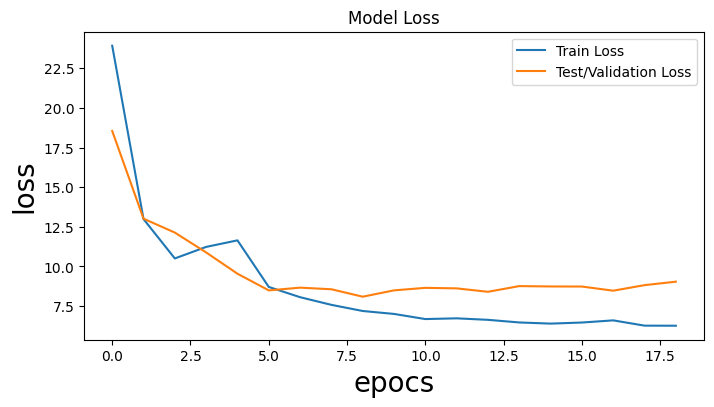

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_5 (ConvLSTM2D)  (None, 1, 1, 32)          15488     
                                                                 
 flatten_5 (Flatten)         (None, 32)                0         
                                                                 
 repeat_vector_5 (RepeatVect  (None, 5, 32)            0         
 or)                                                             
                                                                 
 lstm_5 (LSTM)               (None, 5, 200)            186400    
                                                                 
 time_distributed_10 (TimeDi  (None, 5, 100)           20100     
 stributed)                                                      
                                                                 
 time_distributed_11 (TimeDi  (None, 5, 1)            

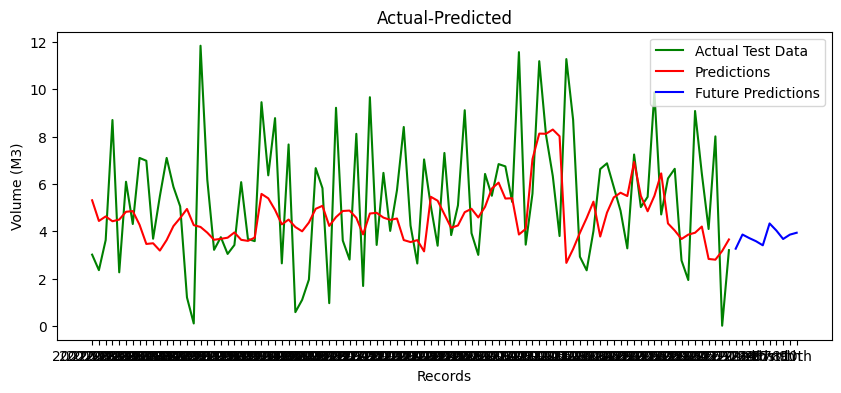

ConvLSTM: 2.769 RMSE (+/- 0.443) cfg_list [1, 3, 32, 100, 16, 10, 0.001, 200]


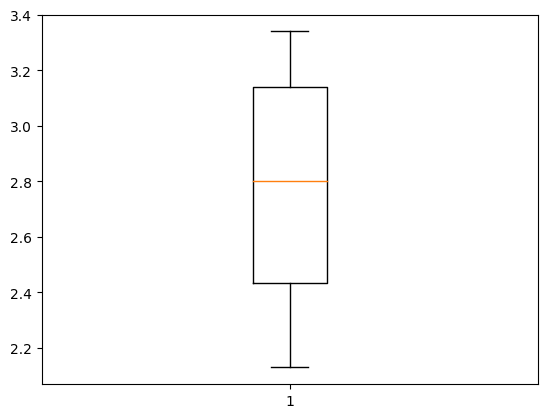

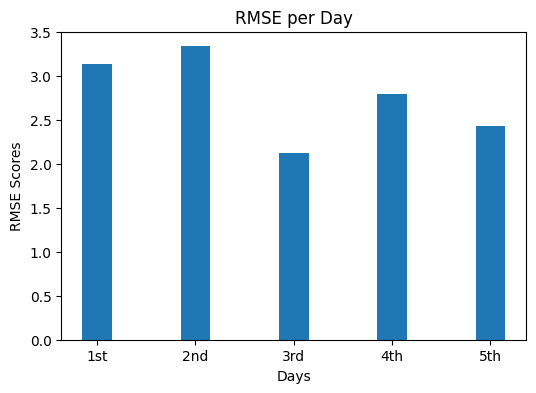

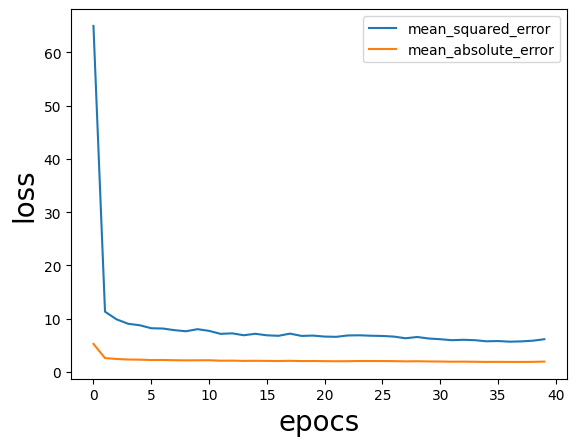

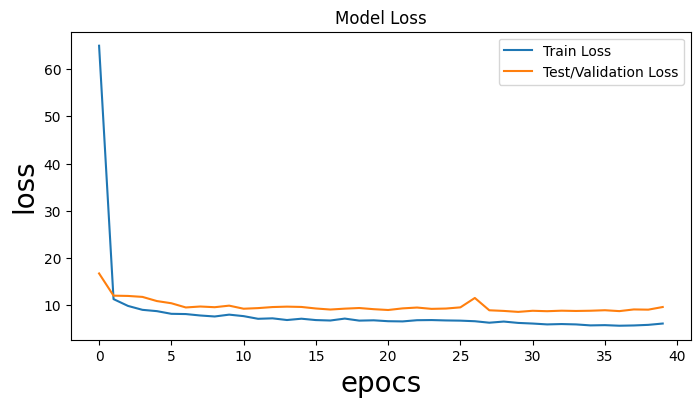

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_6 (ConvLSTM2D)  (None, 1, 1, 32)          15488     
                                                                 
 flatten_6 (Flatten)         (None, 32)                0         
                                                                 
 repeat_vector_6 (RepeatVect  (None, 5, 32)            0         
 or)                                                             
                                                                 
 lstm_6 (LSTM)               (None, 5, 100)            53200     
                                                                 
 time_distributed_12 (TimeDi  (None, 5, 100)           10100     
 stributed)                                                      
                                                                 
 time_distributed_13 (TimeDi  (None, 5, 1)            

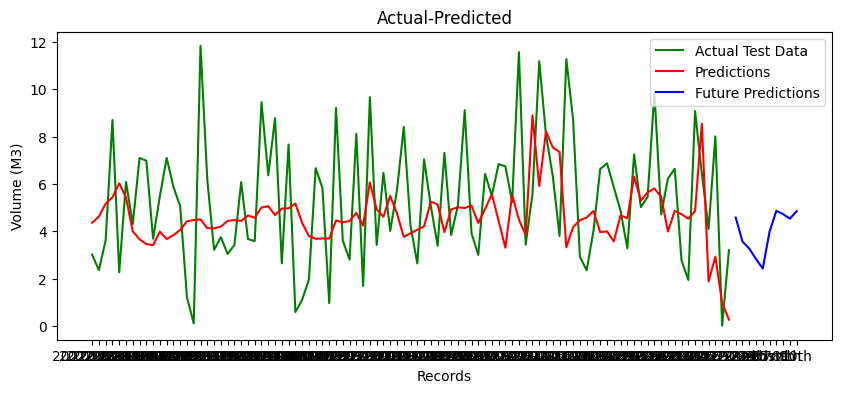

ConvLSTM: 2.772 RMSE (+/- 0.467) cfg_list [1, 3, 32, 100, 16, 10, 0.0001, 100]


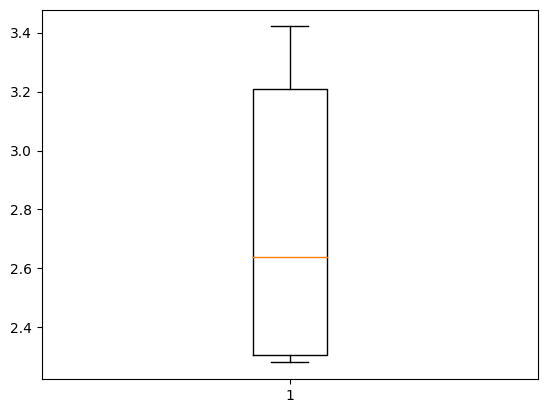

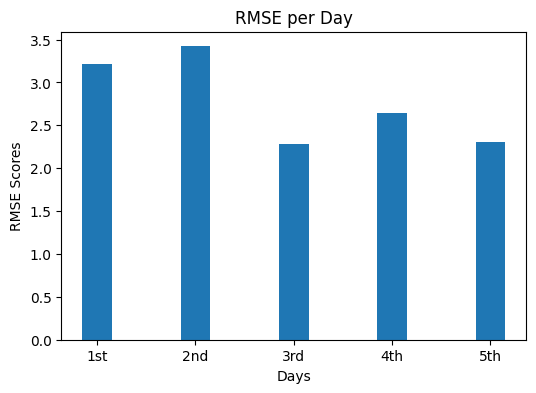

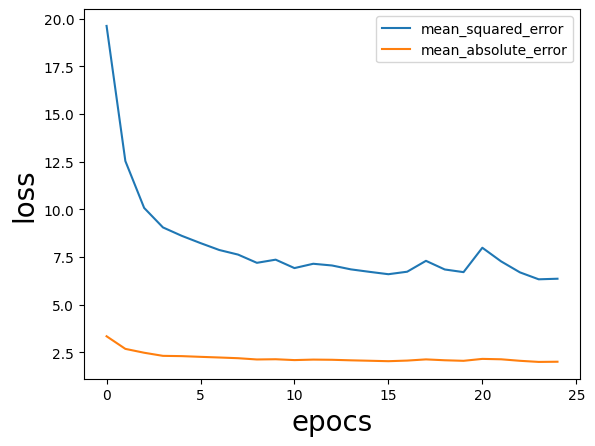

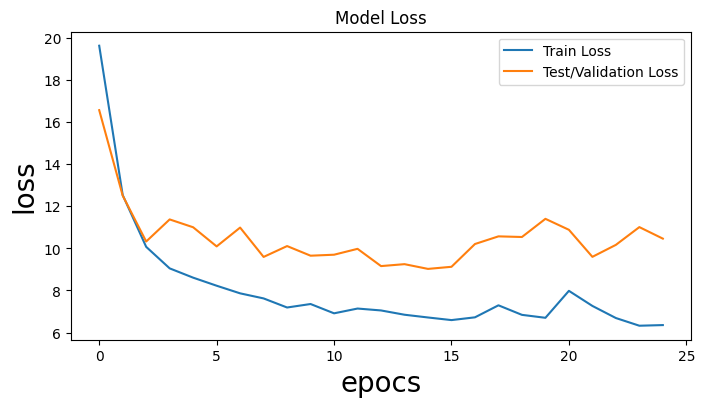

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_7 (ConvLSTM2D)  (None, 1, 1, 32)          15488     
                                                                 
 flatten_7 (Flatten)         (None, 32)                0         
                                                                 
 repeat_vector_7 (RepeatVect  (None, 5, 32)            0         
 or)                                                             
                                                                 
 lstm_7 (LSTM)               (None, 5, 200)            186400    
                                                                 
 time_distributed_14 (TimeDi  (None, 5, 100)           20100     
 stributed)                                                      
                                                                 
 time_distributed_15 (TimeDi  (None, 5, 1)            

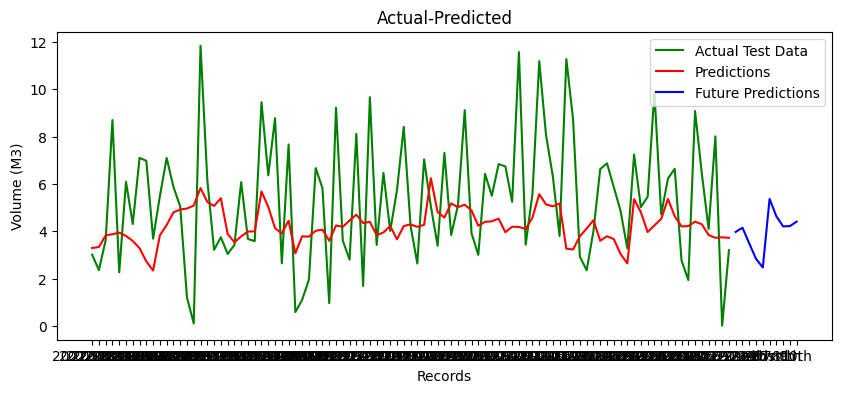

ConvLSTM: 2.759 RMSE (+/- 0.513) cfg_list [1, 3, 32, 100, 16, 10, 0.0001, 200]


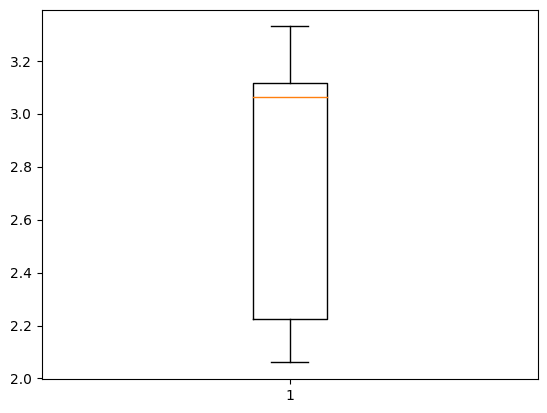

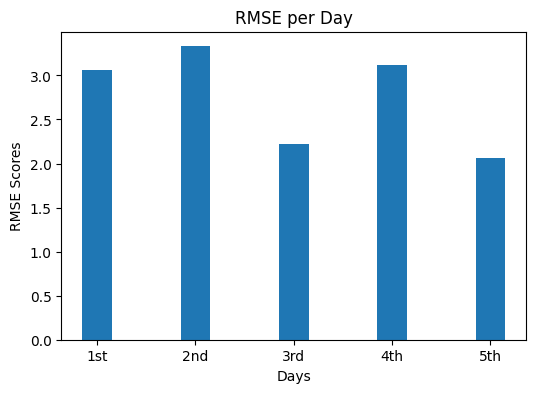

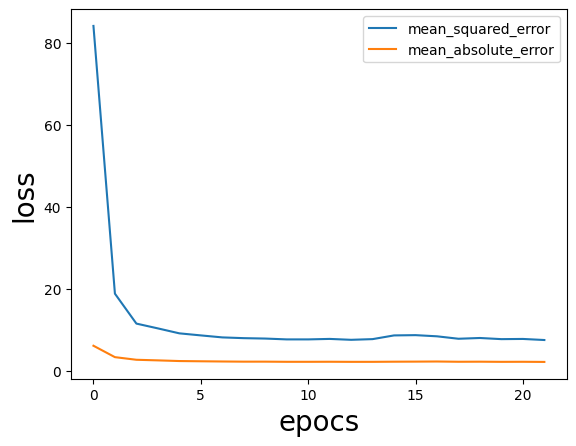

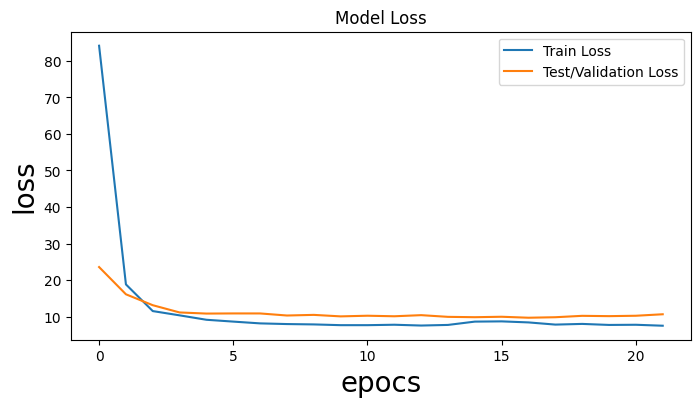

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_8 (ConvLSTM2D)  (None, 1, 1, 32)          15488     
                                                                 
 flatten_8 (Flatten)         (None, 32)                0         
                                                                 
 repeat_vector_8 (RepeatVect  (None, 5, 32)            0         
 or)                                                             
                                                                 
 lstm_8 (LSTM)               (None, 5, 100)            53200     
                                                                 
 time_distributed_16 (TimeDi  (None, 5, 100)           10100     
 stributed)                                                      
                                                                 
 time_distributed_17 (TimeDi  (None, 5, 1)            

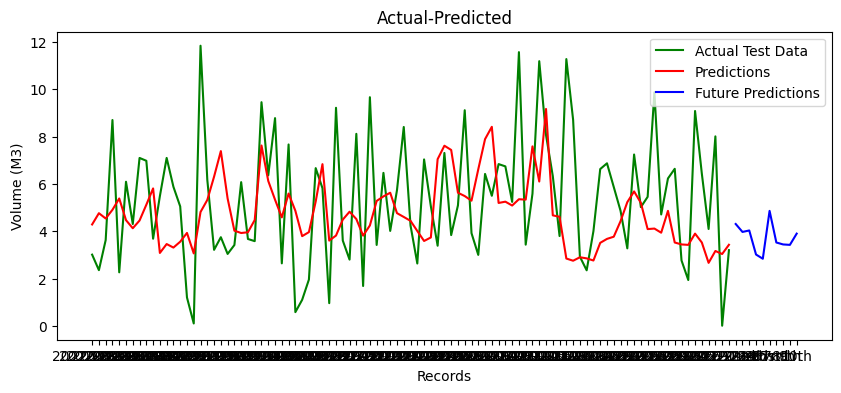

ConvLSTM: 2.792 RMSE (+/- 0.516) cfg_list [1, 3, 32, 100, 32, 5, 0.001, 100]


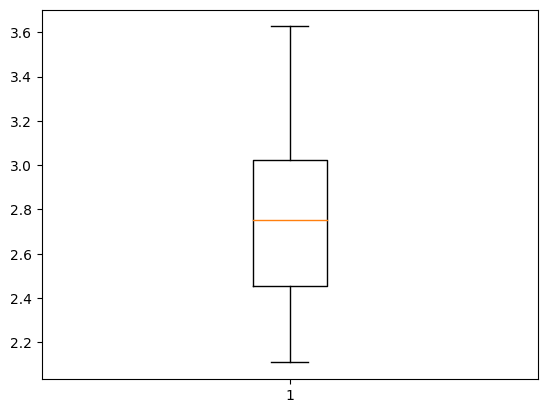

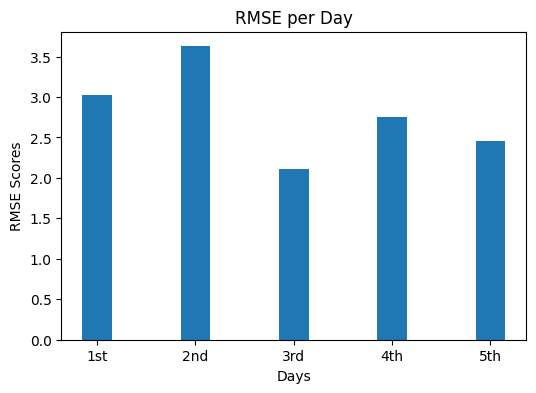

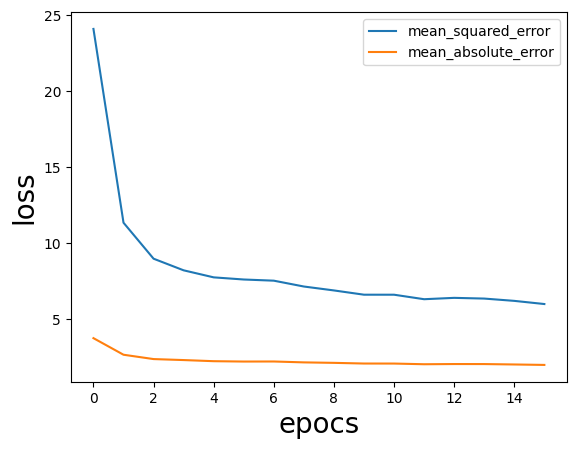

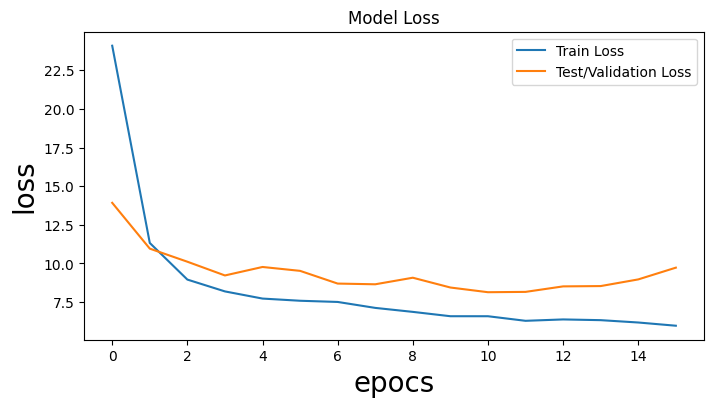

Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_9 (ConvLSTM2D)  (None, 1, 1, 32)          15488     
                                                                 
 flatten_9 (Flatten)         (None, 32)                0         
                                                                 
 repeat_vector_9 (RepeatVect  (None, 5, 32)            0         
 or)                                                             
                                                                 
 lstm_9 (LSTM)               (None, 5, 200)            186400    
                                                                 
 time_distributed_18 (TimeDi  (None, 5, 100)           20100     
 stributed)                                                      
                                                                 
 time_distributed_19 (TimeDi  (None, 5, 1)            

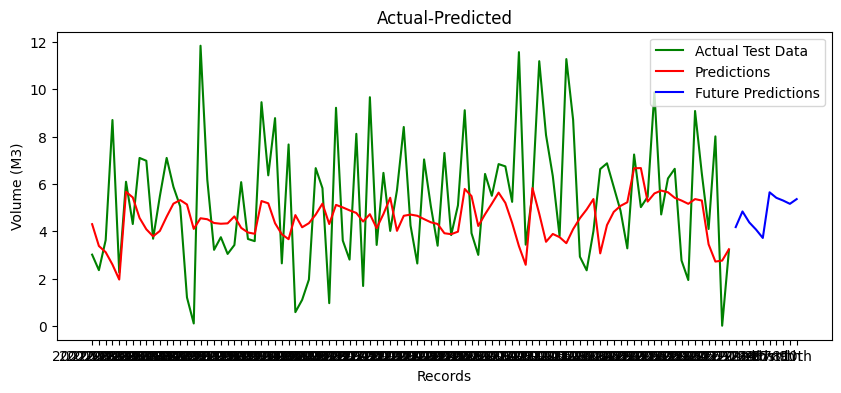

ConvLSTM: 2.761 RMSE (+/- 0.484) cfg_list [1, 3, 32, 100, 32, 5, 0.001, 200]


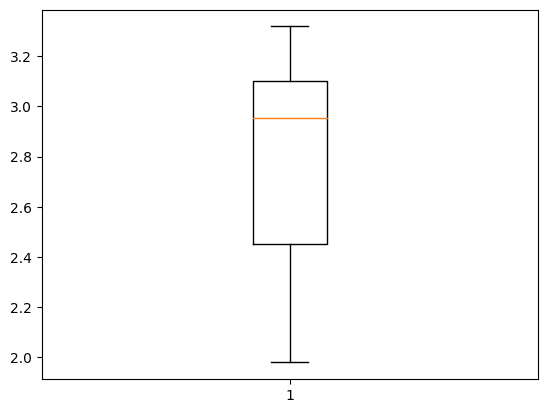

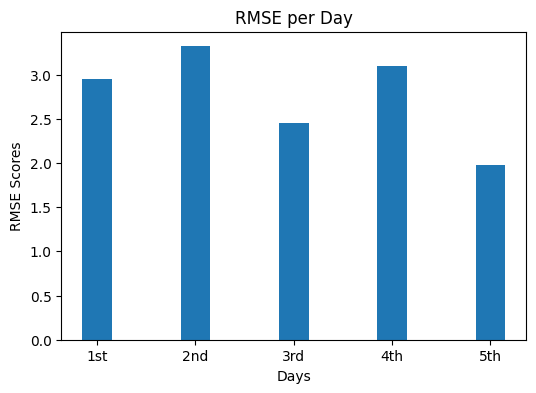

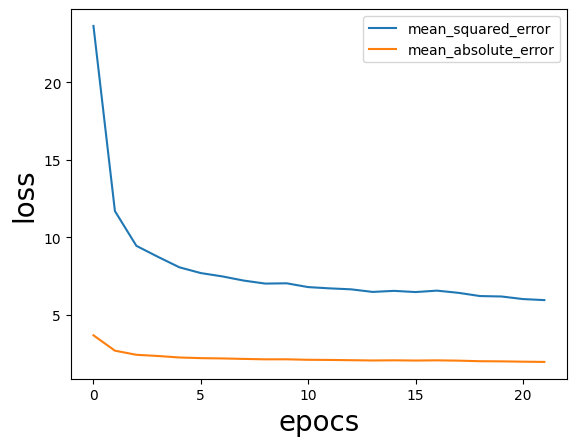

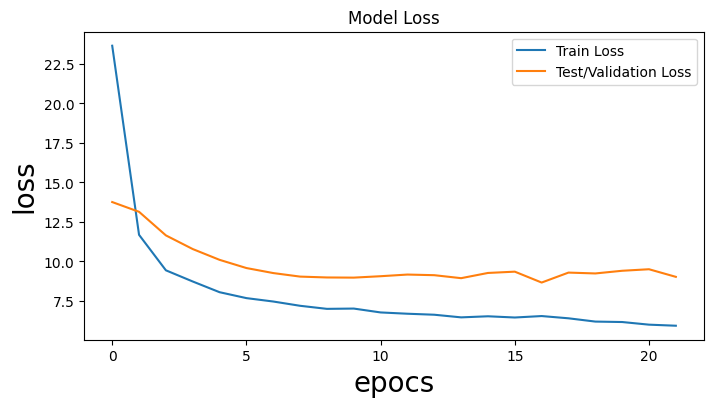

Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_10 (ConvLSTM2D)  (None, 1, 1, 32)         15488     
                                                                 
 flatten_10 (Flatten)        (None, 32)                0         
                                                                 
 repeat_vector_10 (RepeatVec  (None, 5, 32)            0         
 tor)                                                            
                                                                 
 lstm_10 (LSTM)              (None, 5, 100)            53200     
                                                                 
 time_distributed_20 (TimeDi  (None, 5, 100)           10100     
 stributed)                                                      
                                                                 
 time_distributed_21 (TimeDi  (None, 5, 1)           

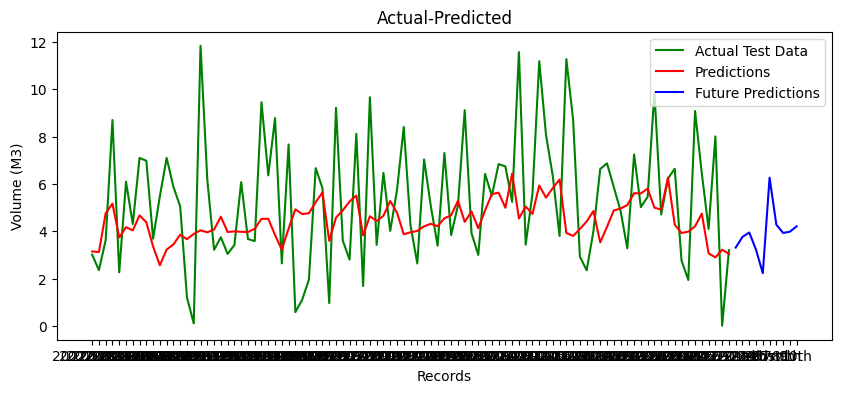

ConvLSTM: 2.698 RMSE (+/- 0.528) cfg_list [1, 3, 32, 100, 32, 5, 0.0001, 100]


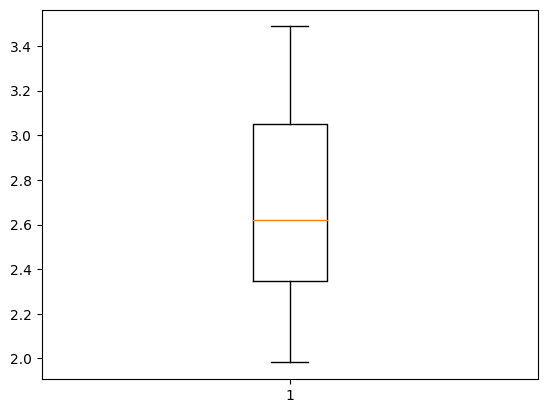

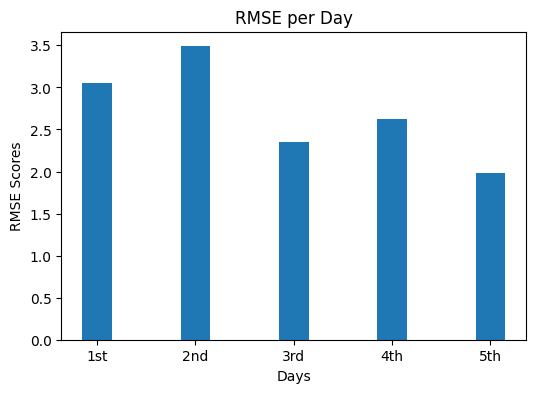

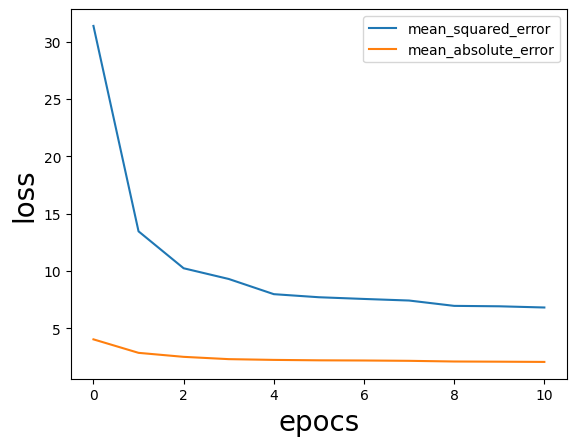

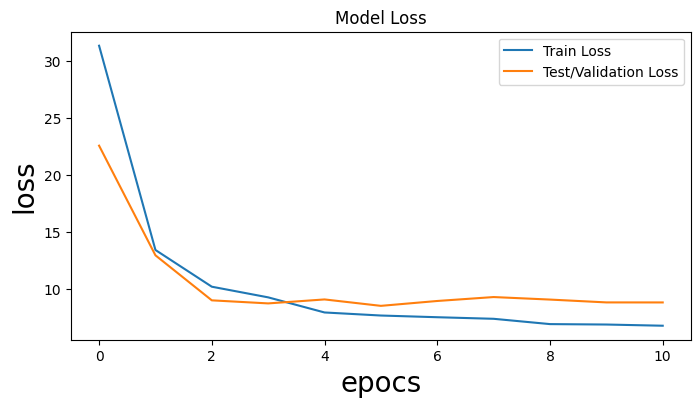

Model: "sequential_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_11 (ConvLSTM2D)  (None, 1, 1, 32)         15488     
                                                                 
 flatten_11 (Flatten)        (None, 32)                0         
                                                                 
 repeat_vector_11 (RepeatVec  (None, 5, 32)            0         
 tor)                                                            
                                                                 
 lstm_11 (LSTM)              (None, 5, 200)            186400    
                                                                 
 time_distributed_22 (TimeDi  (None, 5, 100)           20100     
 stributed)                                                      
                                                                 
 time_distributed_23 (TimeDi  (None, 5, 1)           

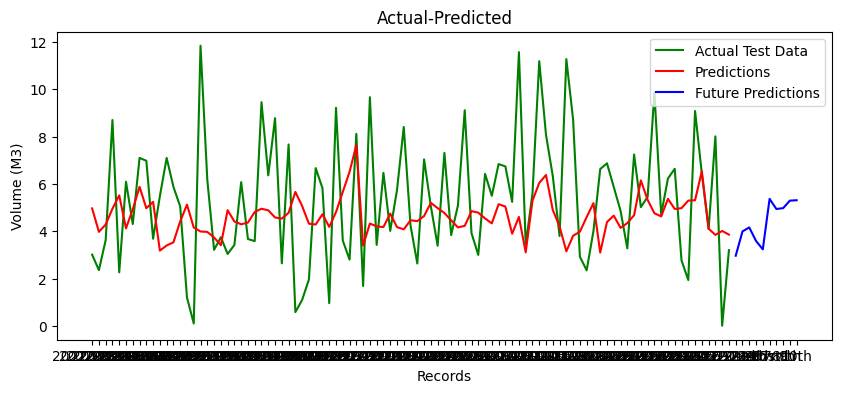

ConvLSTM: 2.734 RMSE (+/- 0.650) cfg_list [1, 3, 32, 100, 32, 5, 0.0001, 200]


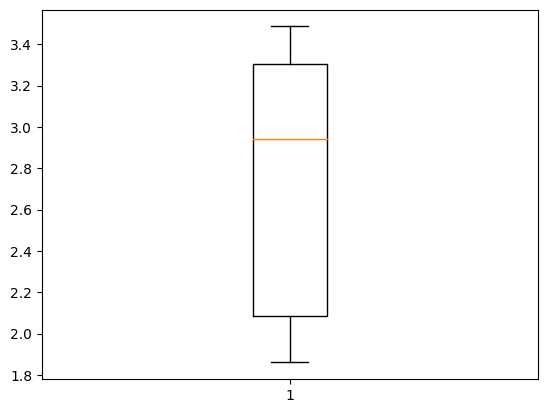

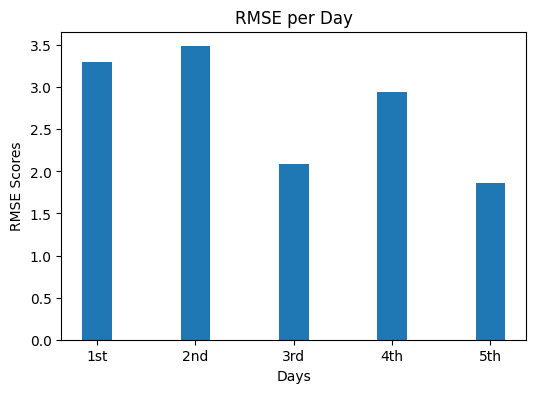

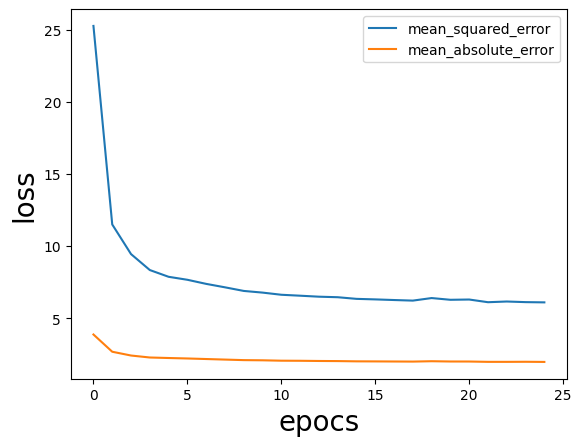

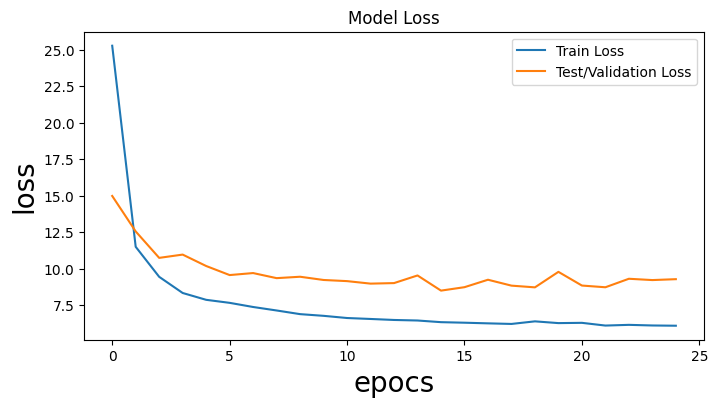

Model: "sequential_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_12 (ConvLSTM2D)  (None, 1, 1, 32)         15488     
                                                                 
 flatten_12 (Flatten)        (None, 32)                0         
                                                                 
 repeat_vector_12 (RepeatVec  (None, 5, 32)            0         
 tor)                                                            
                                                                 
 lstm_12 (LSTM)              (None, 5, 100)            53200     
                                                                 
 time_distributed_24 (TimeDi  (None, 5, 100)           10100     
 stributed)                                                      
                                                                 
 time_distributed_25 (TimeDi  (None, 5, 1)           

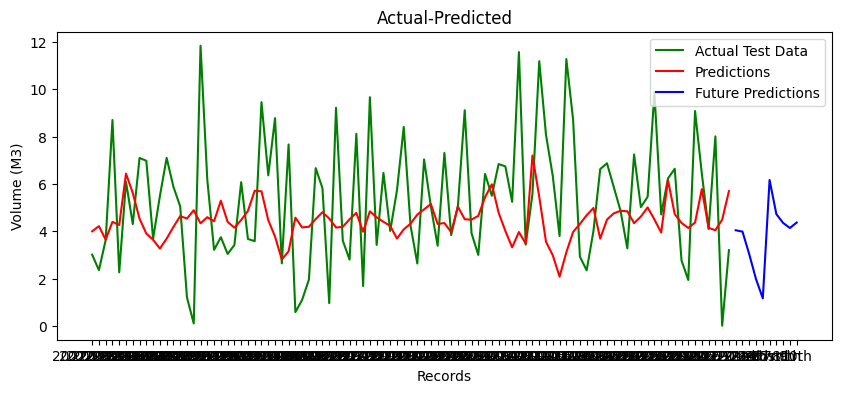

ConvLSTM: 2.855 RMSE (+/- 0.487) cfg_list [1, 3, 32, 100, 32, 10, 0.001, 100]


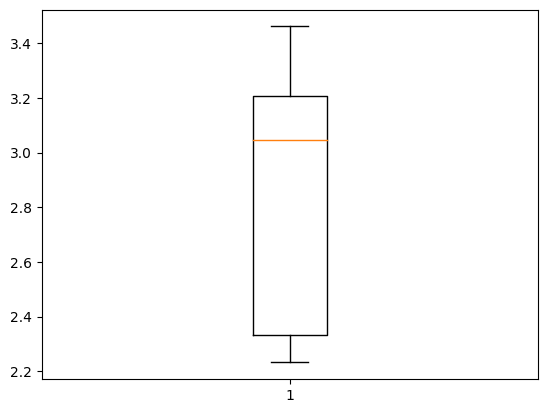

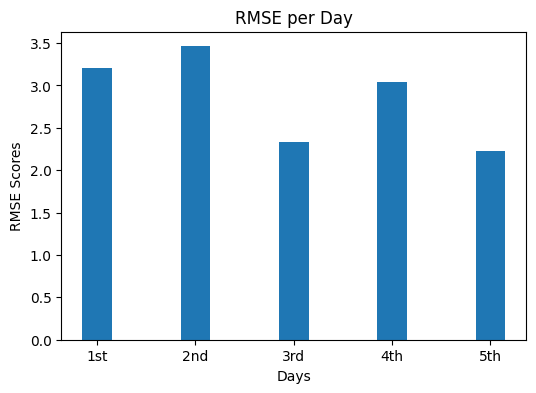

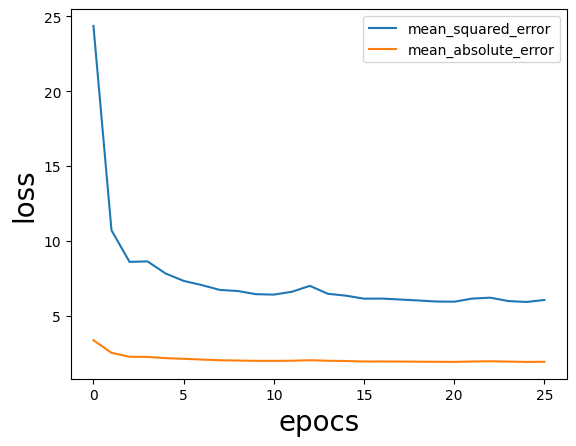

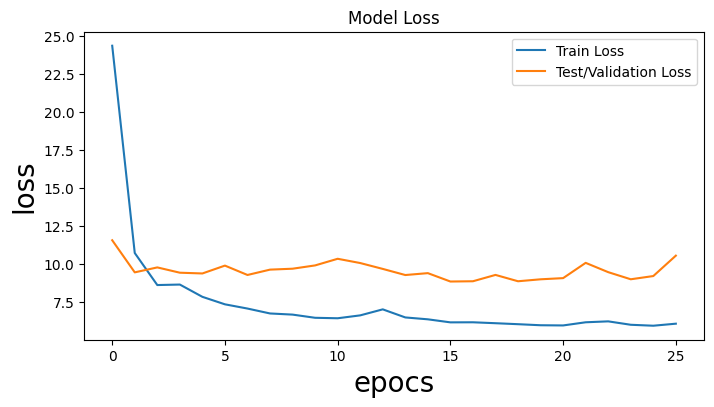

Model: "sequential_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_13 (ConvLSTM2D)  (None, 1, 1, 32)         15488     
                                                                 
 flatten_13 (Flatten)        (None, 32)                0         
                                                                 
 repeat_vector_13 (RepeatVec  (None, 5, 32)            0         
 tor)                                                            
                                                                 
 lstm_13 (LSTM)              (None, 5, 200)            186400    
                                                                 
 time_distributed_26 (TimeDi  (None, 5, 100)           20100     
 stributed)                                                      
                                                                 
 time_distributed_27 (TimeDi  (None, 5, 1)           

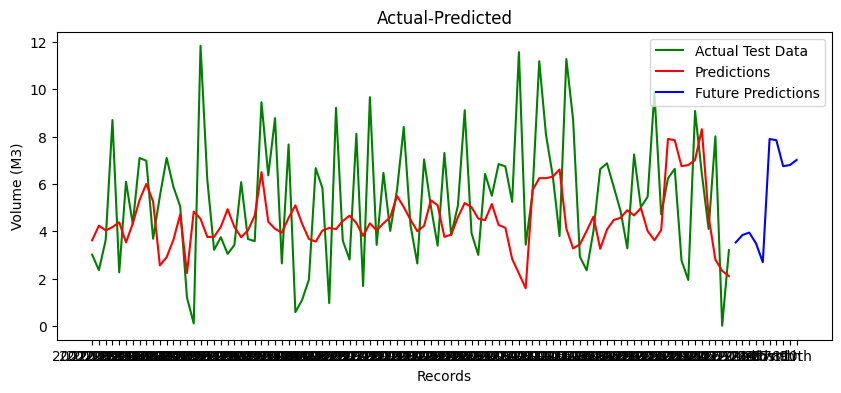

ConvLSTM: 2.840 RMSE (+/- 0.597) cfg_list [1, 3, 32, 100, 32, 10, 0.001, 200]


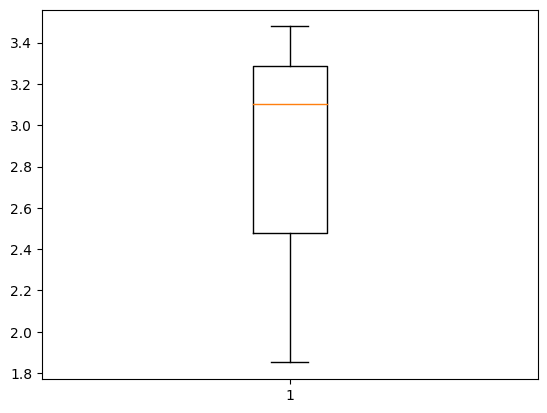

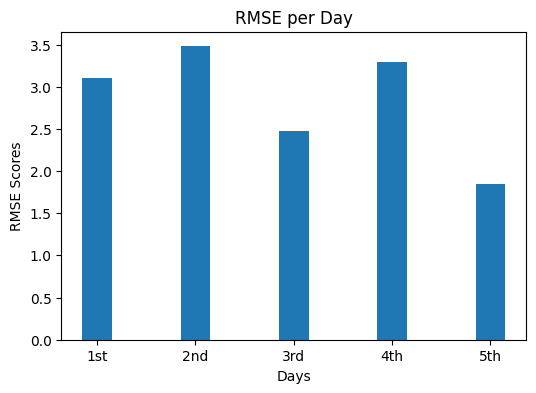

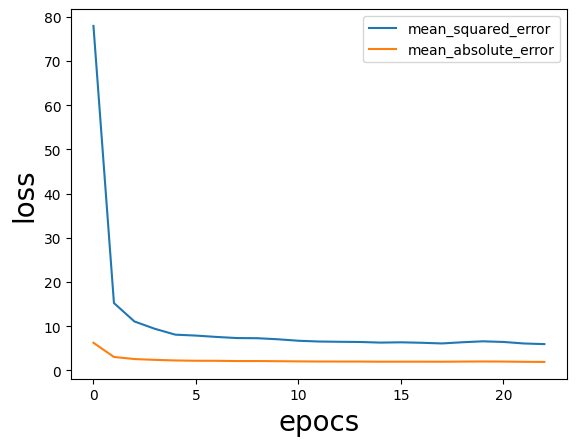

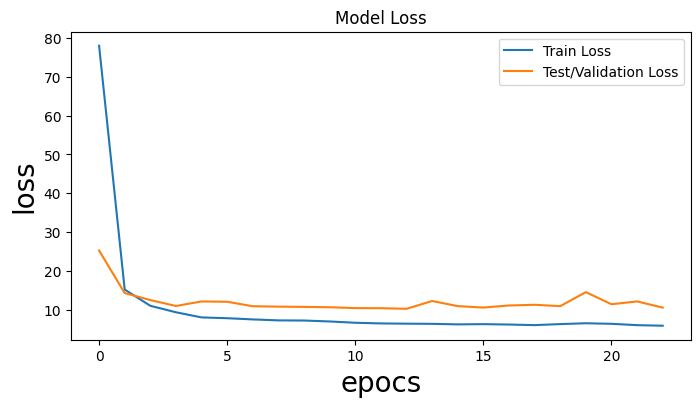

Model: "sequential_14"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_14 (ConvLSTM2D)  (None, 1, 1, 32)         15488     
                                                                 
 flatten_14 (Flatten)        (None, 32)                0         
                                                                 
 repeat_vector_14 (RepeatVec  (None, 5, 32)            0         
 tor)                                                            
                                                                 
 lstm_14 (LSTM)              (None, 5, 100)            53200     
                                                                 
 time_distributed_28 (TimeDi  (None, 5, 100)           10100     
 stributed)                                                      
                                                                 
 time_distributed_29 (TimeDi  (None, 5, 1)           

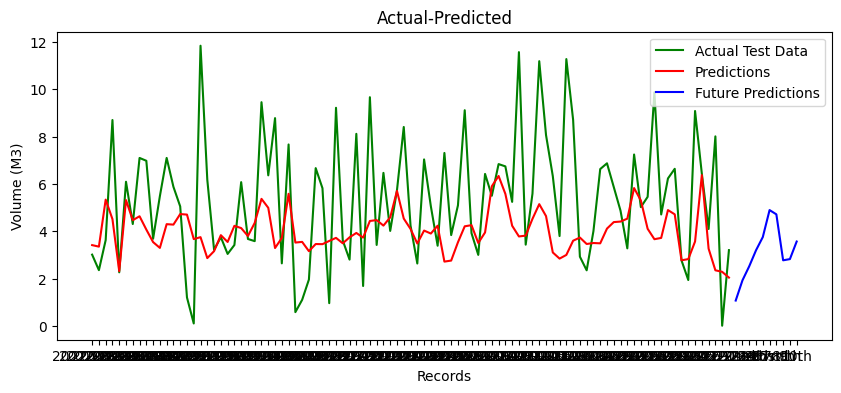

ConvLSTM: 2.835 RMSE (+/- 0.444) cfg_list [1, 3, 32, 100, 32, 10, 0.0001, 100]


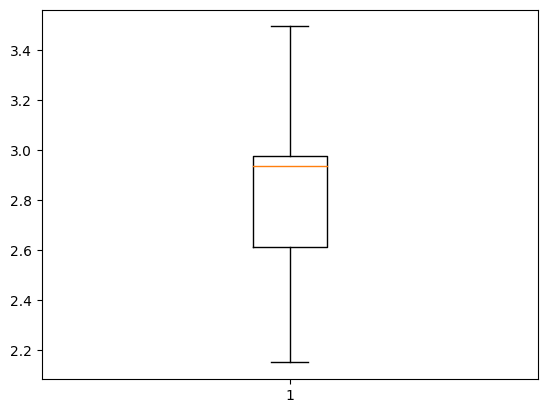

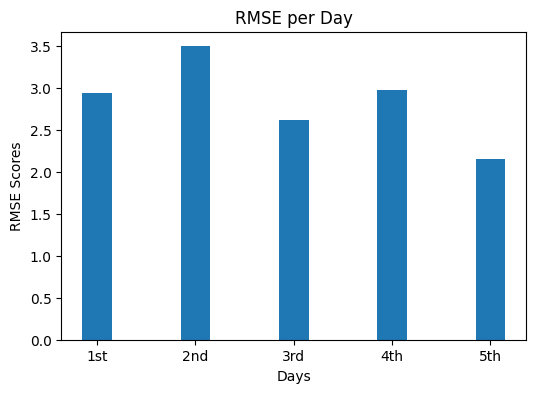

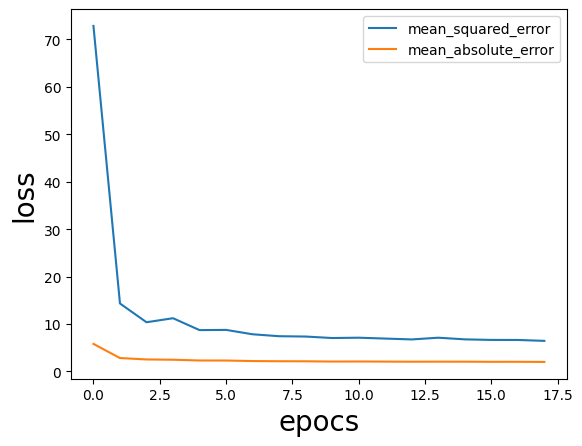

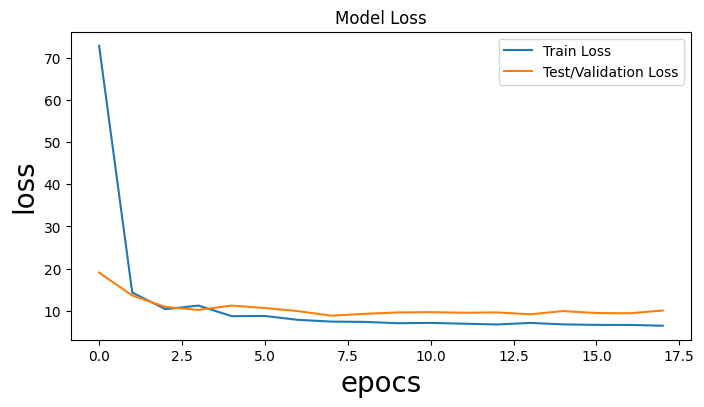

Model: "sequential_15"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_15 (ConvLSTM2D)  (None, 1, 1, 32)         15488     
                                                                 
 flatten_15 (Flatten)        (None, 32)                0         
                                                                 
 repeat_vector_15 (RepeatVec  (None, 5, 32)            0         
 tor)                                                            
                                                                 
 lstm_15 (LSTM)              (None, 5, 200)            186400    
                                                                 
 time_distributed_30 (TimeDi  (None, 5, 100)           20100     
 stributed)                                                      
                                                                 
 time_distributed_31 (TimeDi  (None, 5, 1)           

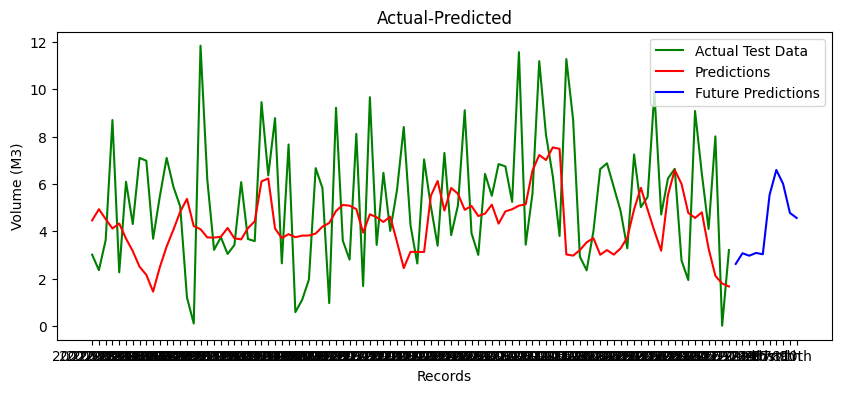

ConvLSTM: 2.950 RMSE (+/- 0.409) cfg_list [1, 3, 32, 100, 32, 10, 0.0001, 200]


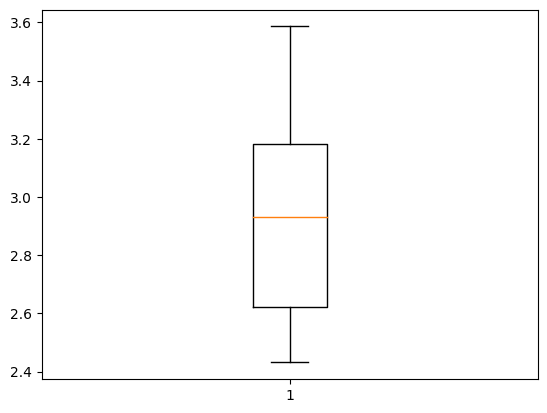

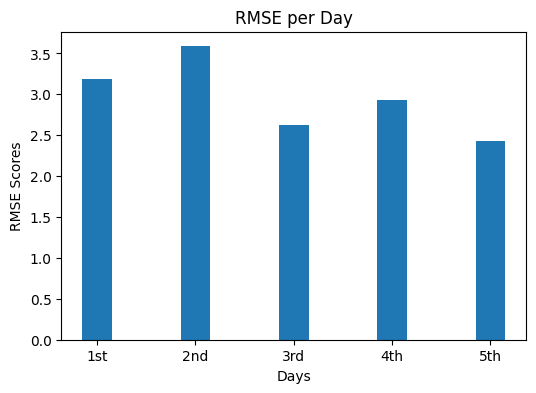

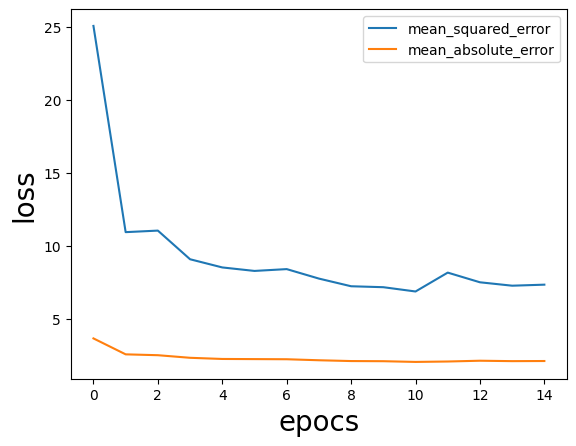

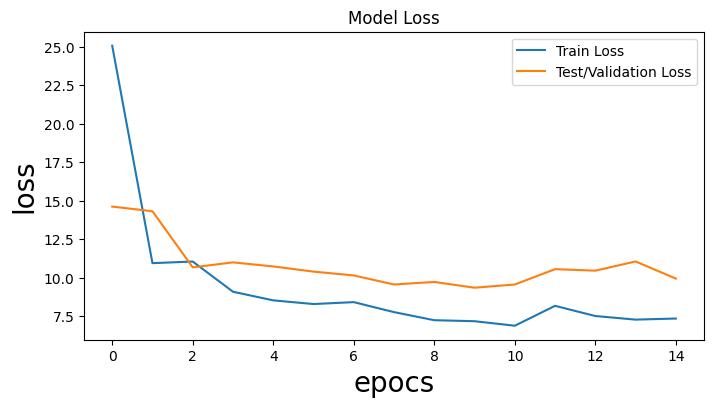

Model: "sequential_16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_16 (ConvLSTM2D)  (None, 1, 1, 64)         55552     
                                                                 
 flatten_16 (Flatten)        (None, 64)                0         
                                                                 
 repeat_vector_16 (RepeatVec  (None, 5, 64)            0         
 tor)                                                            
                                                                 
 lstm_16 (LSTM)              (None, 5, 100)            66000     
                                                                 
 time_distributed_32 (TimeDi  (None, 5, 100)           10100     
 stributed)                                                      
                                                                 
 time_distributed_33 (TimeDi  (None, 5, 1)           

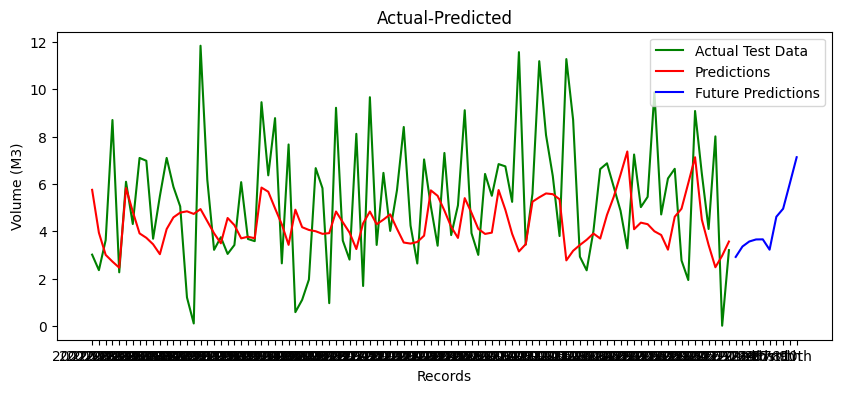

ConvLSTM: 2.893 RMSE (+/- 0.529) cfg_list [1, 3, 64, 100, 16, 5, 0.001, 100]


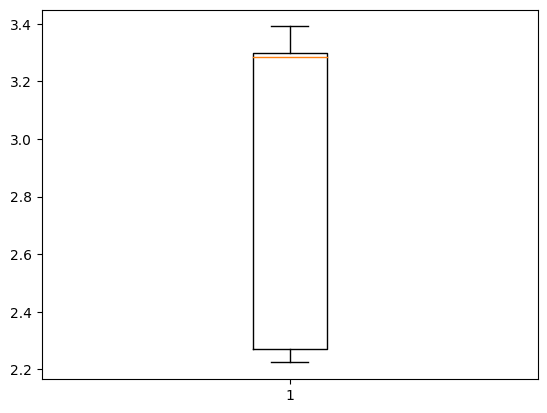

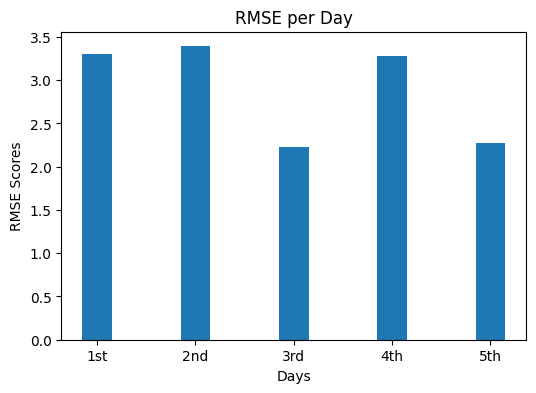

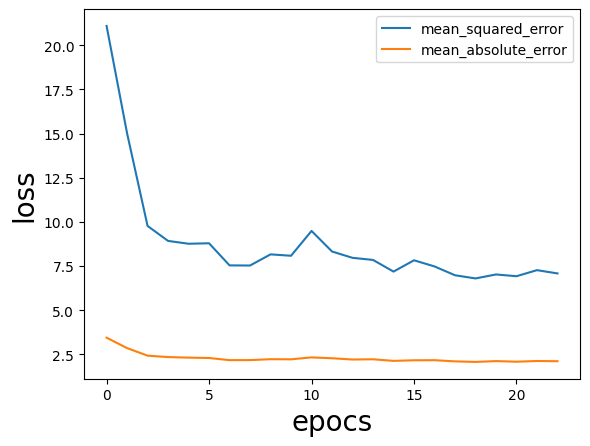

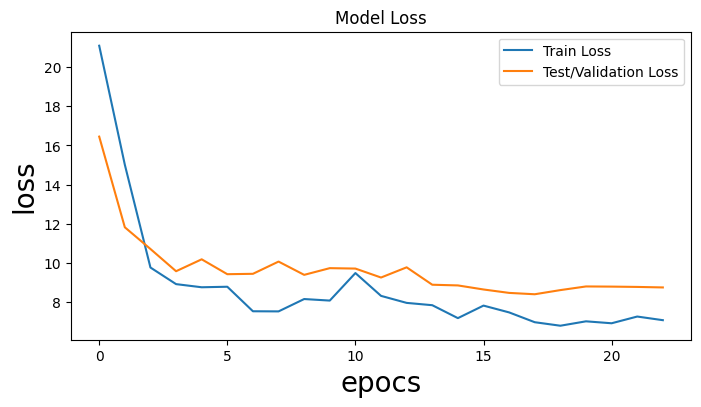

Model: "sequential_17"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_17 (ConvLSTM2D)  (None, 1, 1, 64)         55552     
                                                                 
 flatten_17 (Flatten)        (None, 64)                0         
                                                                 
 repeat_vector_17 (RepeatVec  (None, 5, 64)            0         
 tor)                                                            
                                                                 
 lstm_17 (LSTM)              (None, 5, 200)            212000    
                                                                 
 time_distributed_34 (TimeDi  (None, 5, 100)           20100     
 stributed)                                                      
                                                                 
 time_distributed_35 (TimeDi  (None, 5, 1)           

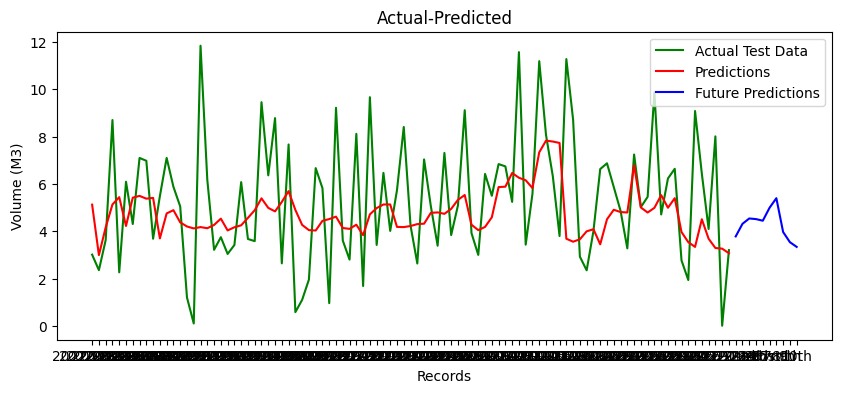

ConvLSTM: 2.595 RMSE (+/- 0.455) cfg_list [1, 3, 64, 100, 16, 5, 0.001, 200]


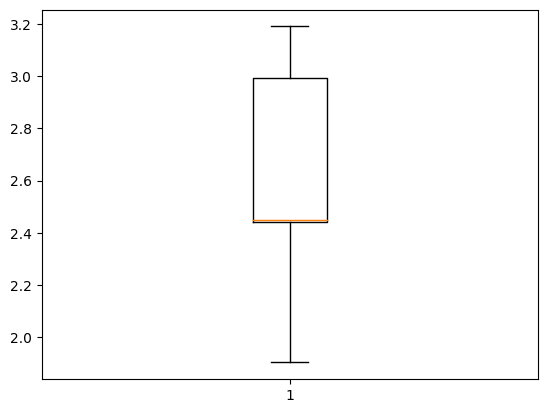

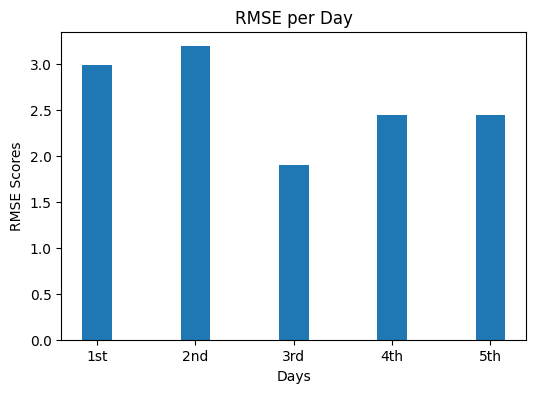

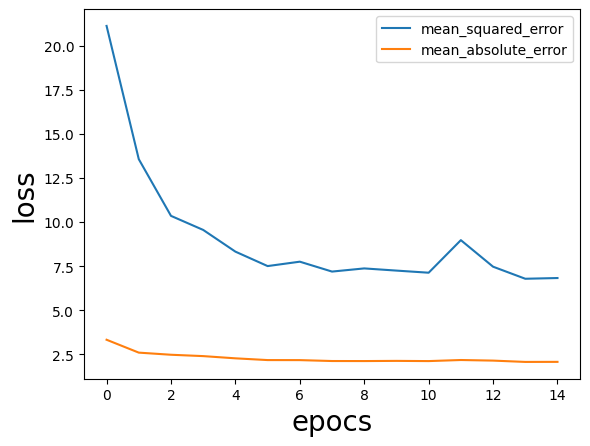

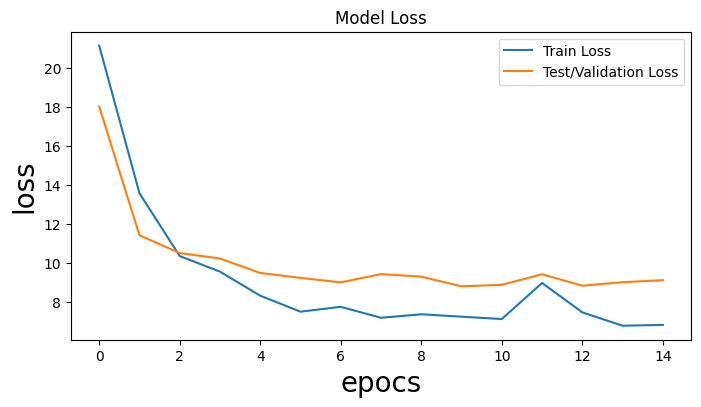

Model: "sequential_18"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_18 (ConvLSTM2D)  (None, 1, 1, 64)         55552     
                                                                 
 flatten_18 (Flatten)        (None, 64)                0         
                                                                 
 repeat_vector_18 (RepeatVec  (None, 5, 64)            0         
 tor)                                                            
                                                                 
 lstm_18 (LSTM)              (None, 5, 100)            66000     
                                                                 
 time_distributed_36 (TimeDi  (None, 5, 100)           10100     
 stributed)                                                      
                                                                 
 time_distributed_37 (TimeDi  (None, 5, 1)           

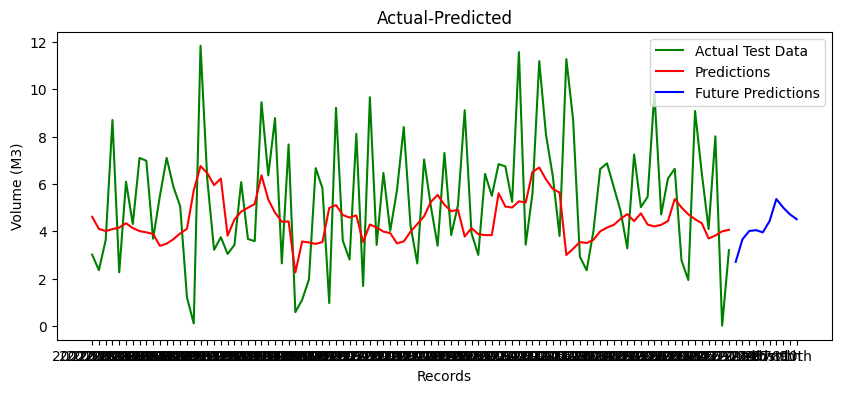

ConvLSTM: 2.697 RMSE (+/- 0.539) cfg_list [1, 3, 64, 100, 16, 5, 0.0001, 100]


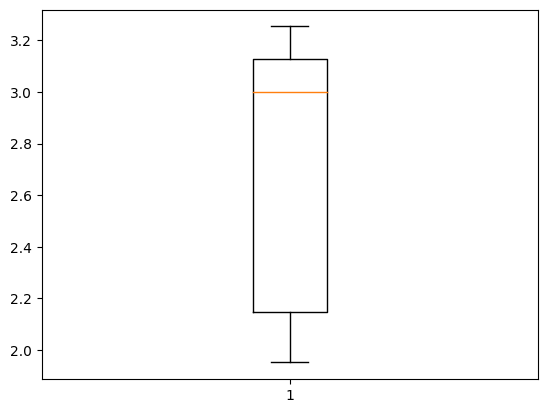

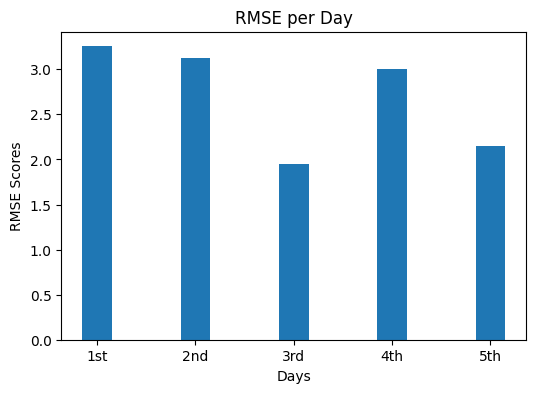

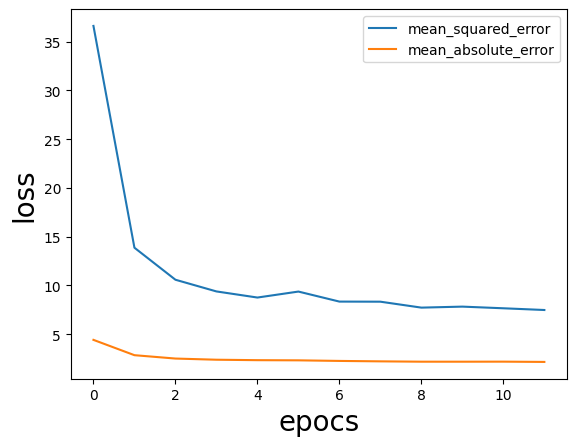

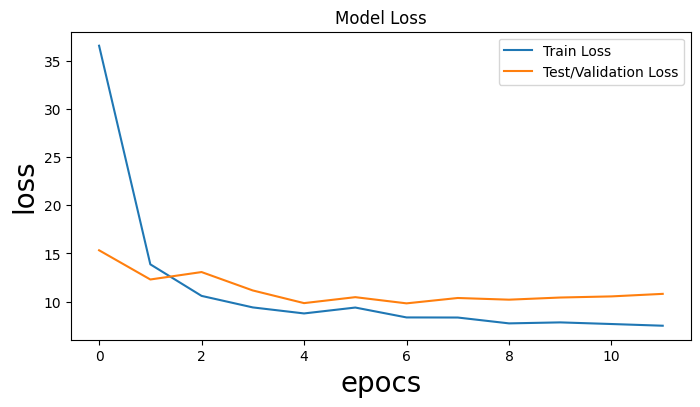

Model: "sequential_19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_19 (ConvLSTM2D)  (None, 1, 1, 64)         55552     
                                                                 
 flatten_19 (Flatten)        (None, 64)                0         
                                                                 
 repeat_vector_19 (RepeatVec  (None, 5, 64)            0         
 tor)                                                            
                                                                 
 lstm_19 (LSTM)              (None, 5, 200)            212000    
                                                                 
 time_distributed_38 (TimeDi  (None, 5, 100)           20100     
 stributed)                                                      
                                                                 
 time_distributed_39 (TimeDi  (None, 5, 1)           

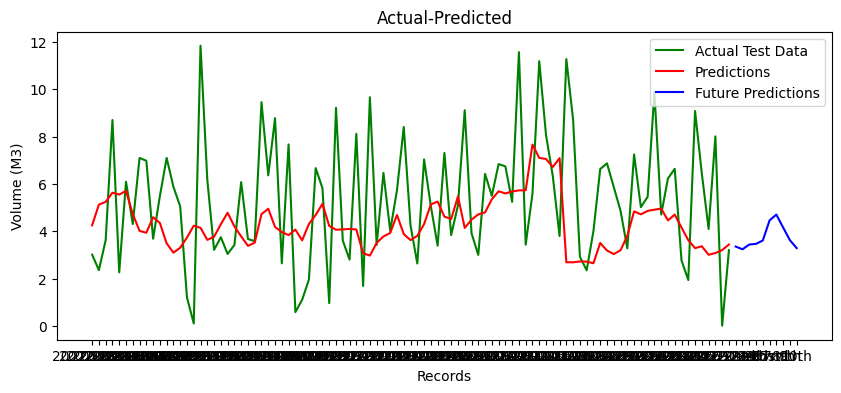

ConvLSTM: 2.834 RMSE (+/- 0.541) cfg_list [1, 3, 64, 100, 16, 5, 0.0001, 200]


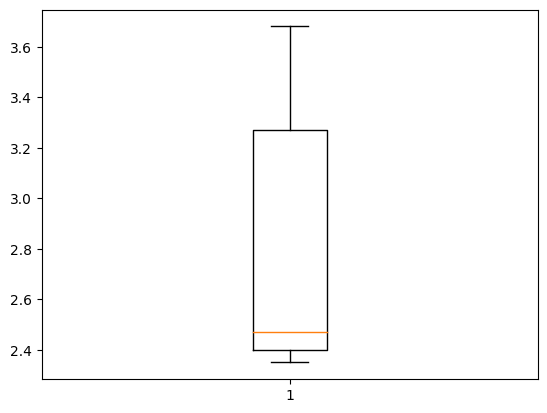

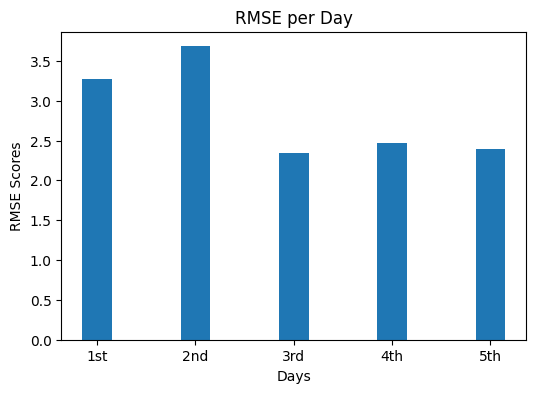

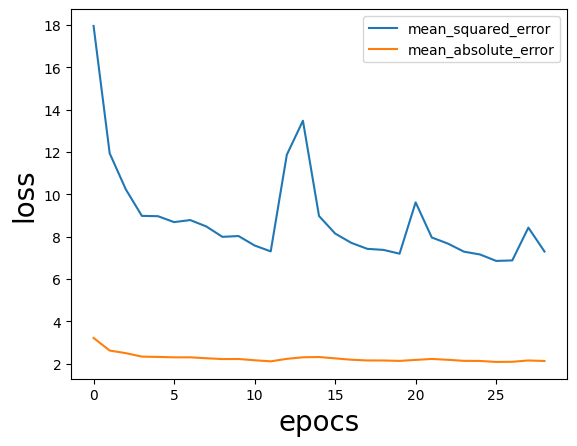

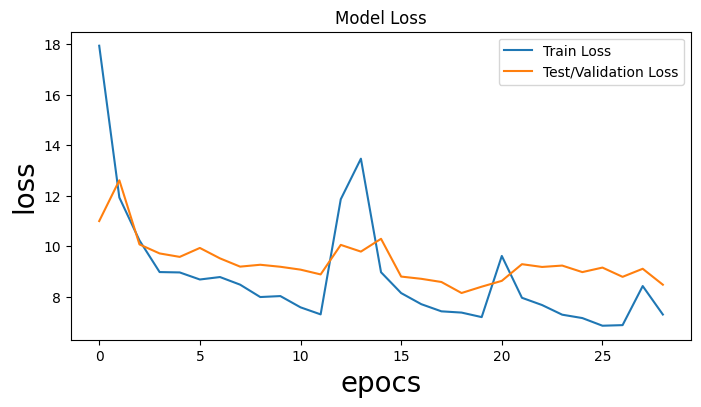

Model: "sequential_20"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_20 (ConvLSTM2D)  (None, 1, 1, 64)         55552     
                                                                 
 flatten_20 (Flatten)        (None, 64)                0         
                                                                 
 repeat_vector_20 (RepeatVec  (None, 5, 64)            0         
 tor)                                                            
                                                                 
 lstm_20 (LSTM)              (None, 5, 100)            66000     
                                                                 
 time_distributed_40 (TimeDi  (None, 5, 100)           10100     
 stributed)                                                      
                                                                 
 time_distributed_41 (TimeDi  (None, 5, 1)           

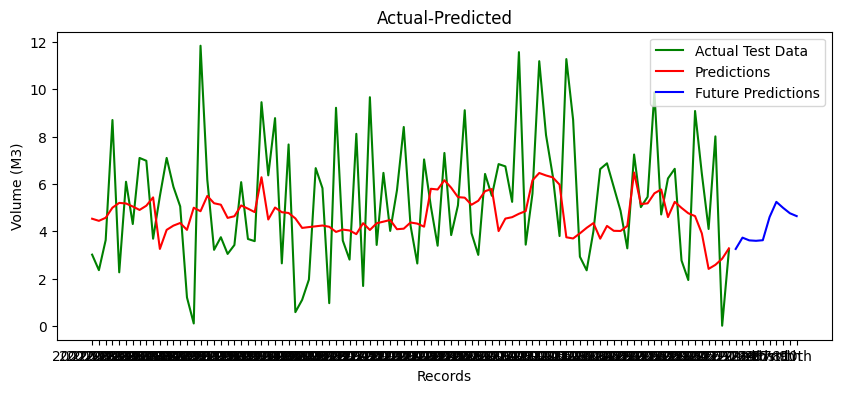

ConvLSTM: 2.669 RMSE (+/- 0.531) cfg_list [1, 3, 64, 100, 16, 10, 0.001, 100]


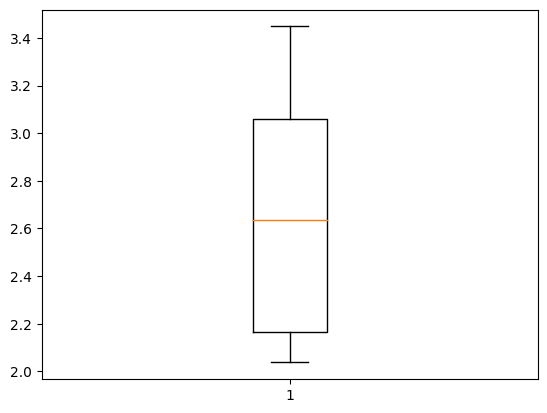

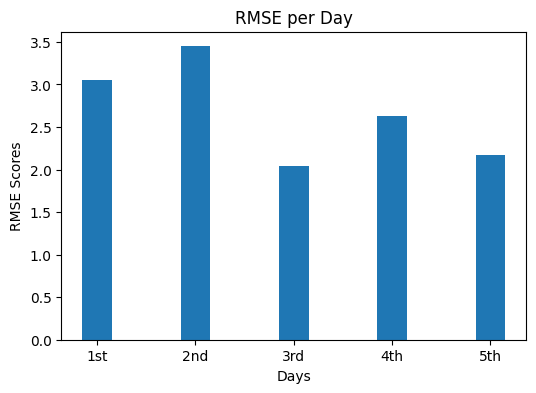

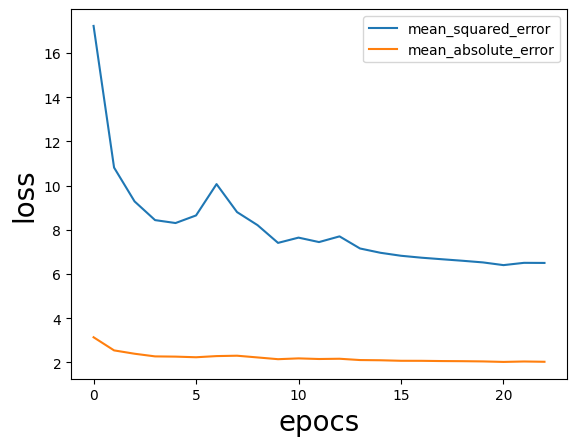

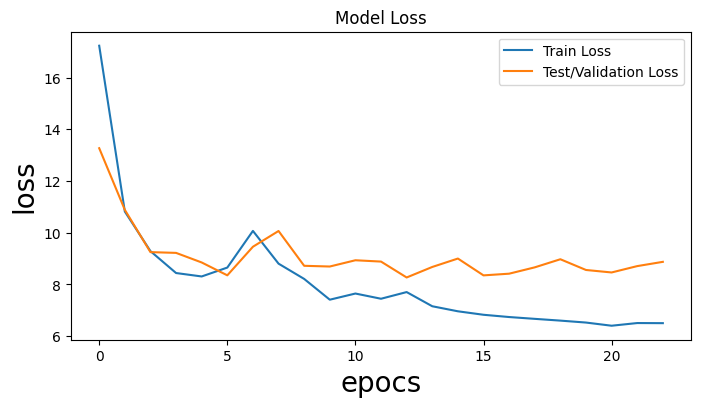

Model: "sequential_21"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_21 (ConvLSTM2D)  (None, 1, 1, 64)         55552     
                                                                 
 flatten_21 (Flatten)        (None, 64)                0         
                                                                 
 repeat_vector_21 (RepeatVec  (None, 5, 64)            0         
 tor)                                                            
                                                                 
 lstm_21 (LSTM)              (None, 5, 200)            212000    
                                                                 
 time_distributed_42 (TimeDi  (None, 5, 100)           20100     
 stributed)                                                      
                                                                 
 time_distributed_43 (TimeDi  (None, 5, 1)           

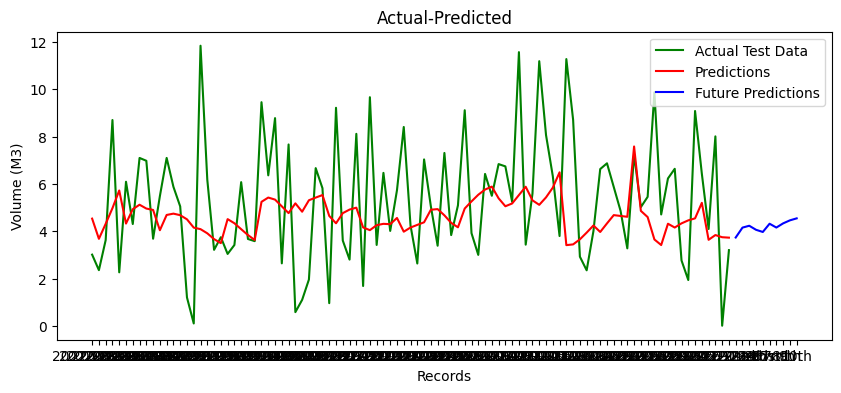

ConvLSTM: 2.715 RMSE (+/- 0.562) cfg_list [1, 3, 64, 100, 16, 10, 0.001, 200]


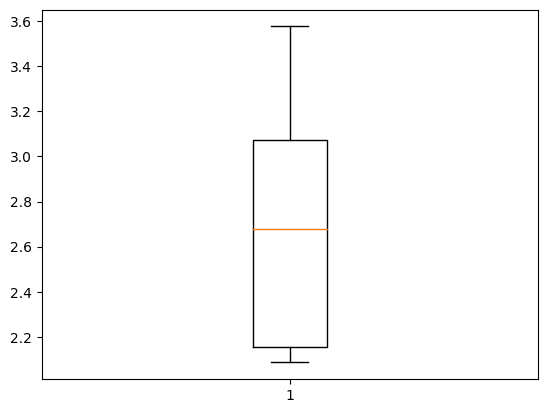

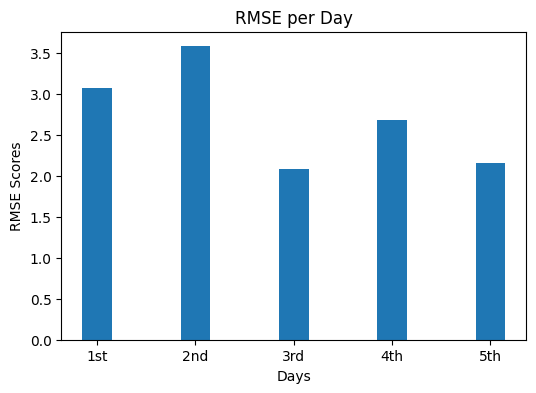

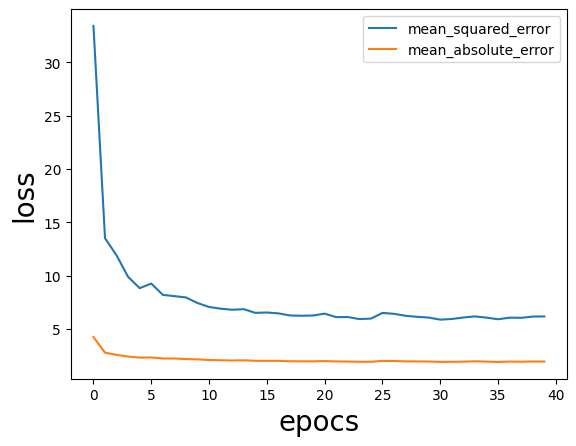

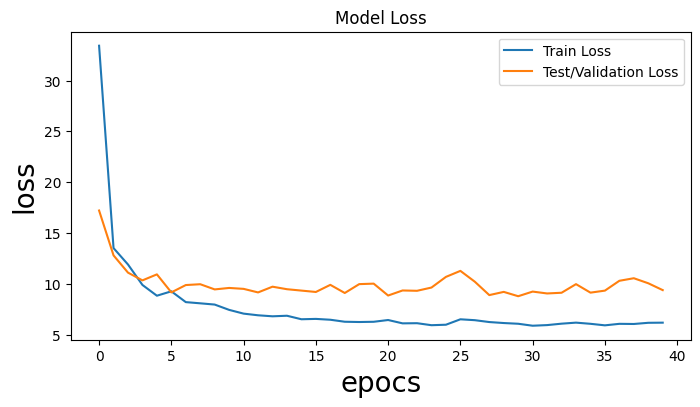

Model: "sequential_22"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_22 (ConvLSTM2D)  (None, 1, 1, 64)         55552     
                                                                 
 flatten_22 (Flatten)        (None, 64)                0         
                                                                 
 repeat_vector_22 (RepeatVec  (None, 5, 64)            0         
 tor)                                                            
                                                                 
 lstm_22 (LSTM)              (None, 5, 100)            66000     
                                                                 
 time_distributed_44 (TimeDi  (None, 5, 100)           10100     
 stributed)                                                      
                                                                 
 time_distributed_45 (TimeDi  (None, 5, 1)           

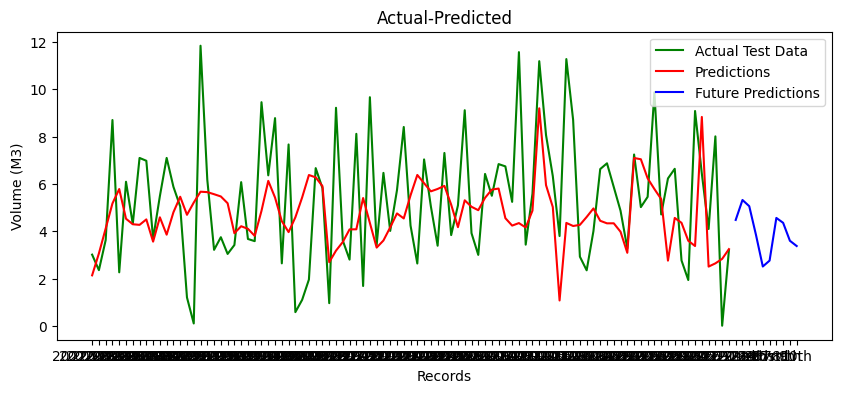

ConvLSTM: 2.709 RMSE (+/- 0.405) cfg_list [1, 3, 64, 100, 16, 10, 0.0001, 100]


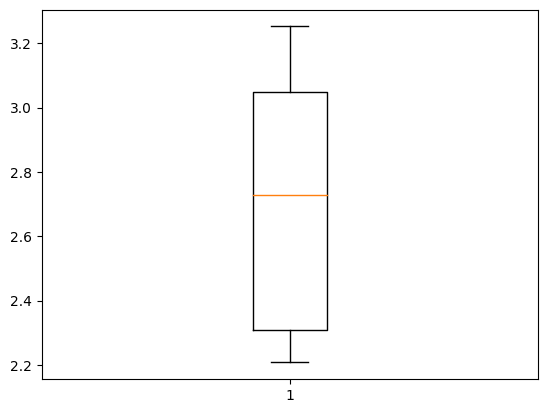

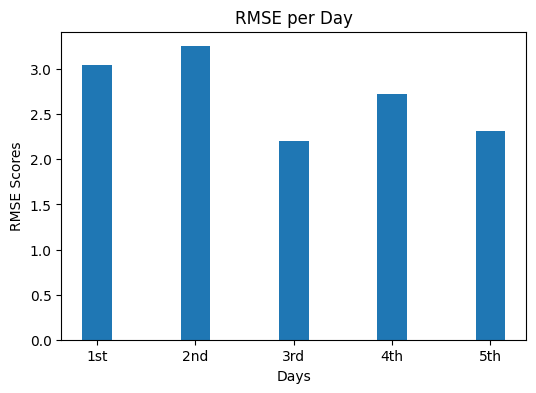

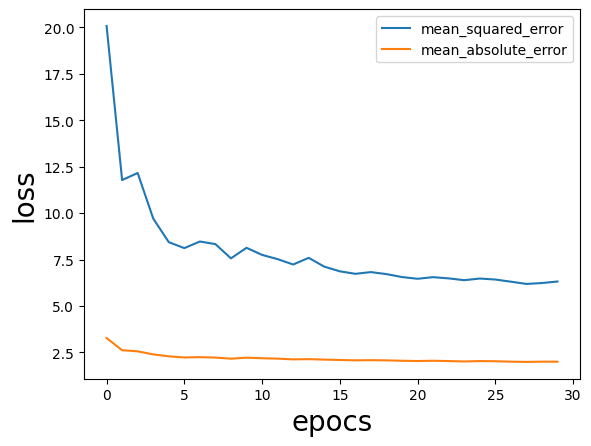

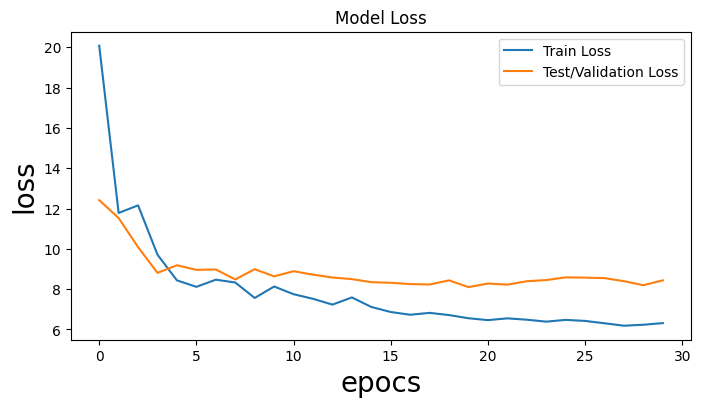

Model: "sequential_23"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_23 (ConvLSTM2D)  (None, 1, 1, 64)         55552     
                                                                 
 flatten_23 (Flatten)        (None, 64)                0         
                                                                 
 repeat_vector_23 (RepeatVec  (None, 5, 64)            0         
 tor)                                                            
                                                                 
 lstm_23 (LSTM)              (None, 5, 200)            212000    
                                                                 
 time_distributed_46 (TimeDi  (None, 5, 100)           20100     
 stributed)                                                      
                                                                 
 time_distributed_47 (TimeDi  (None, 5, 1)           

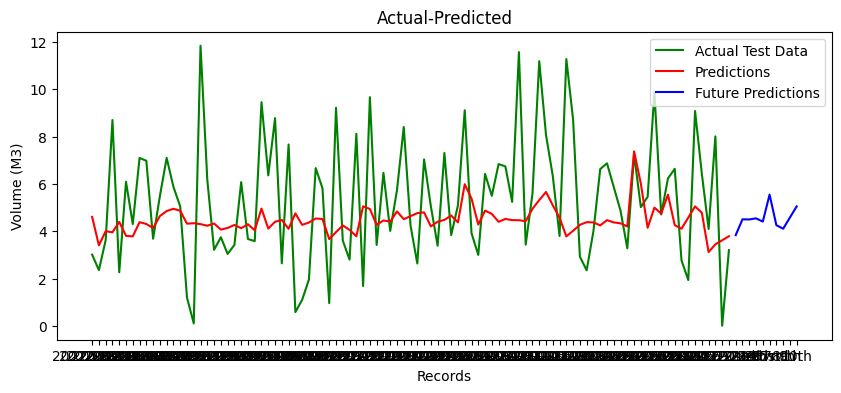

ConvLSTM: 2.662 RMSE (+/- 0.539) cfg_list [1, 3, 64, 100, 16, 10, 0.0001, 200]


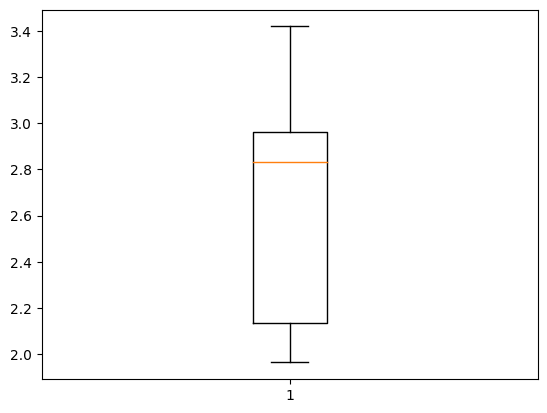

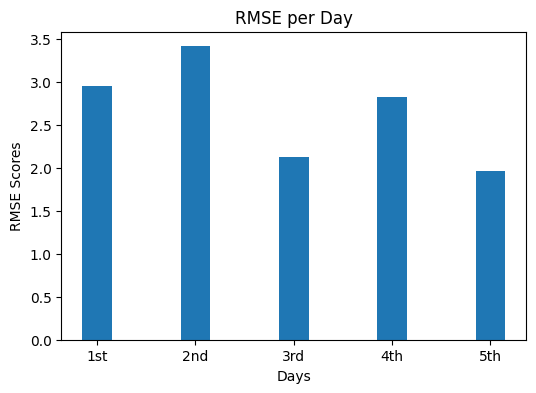

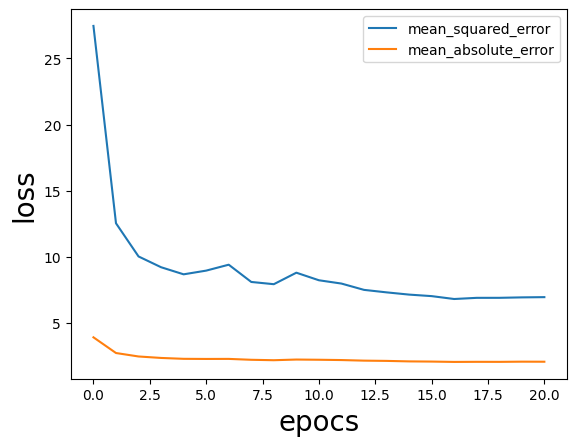

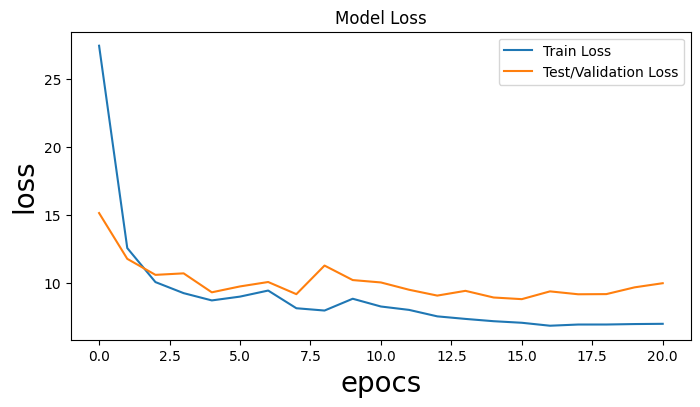

Model: "sequential_24"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_24 (ConvLSTM2D)  (None, 1, 1, 64)         55552     
                                                                 
 flatten_24 (Flatten)        (None, 64)                0         
                                                                 
 repeat_vector_24 (RepeatVec  (None, 5, 64)            0         
 tor)                                                            
                                                                 
 lstm_24 (LSTM)              (None, 5, 100)            66000     
                                                                 
 time_distributed_48 (TimeDi  (None, 5, 100)           10100     
 stributed)                                                      
                                                                 
 time_distributed_49 (TimeDi  (None, 5, 1)           

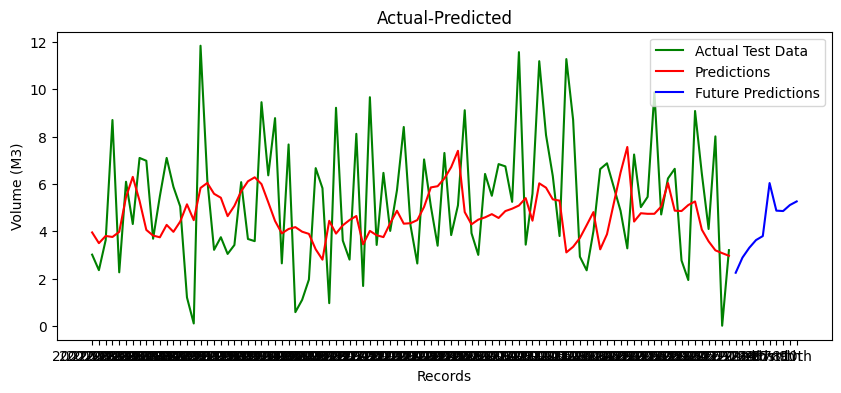

ConvLSTM: 2.775 RMSE (+/- 0.541) cfg_list [1, 3, 64, 100, 32, 5, 0.001, 100]


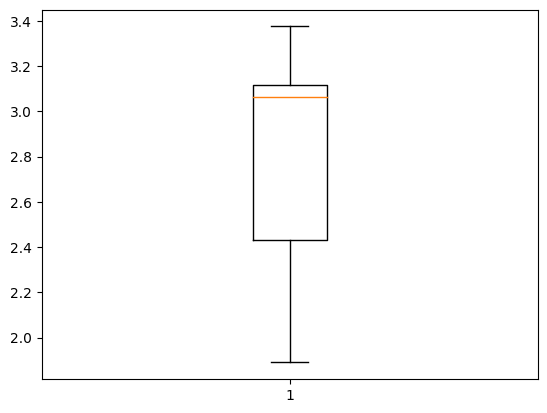

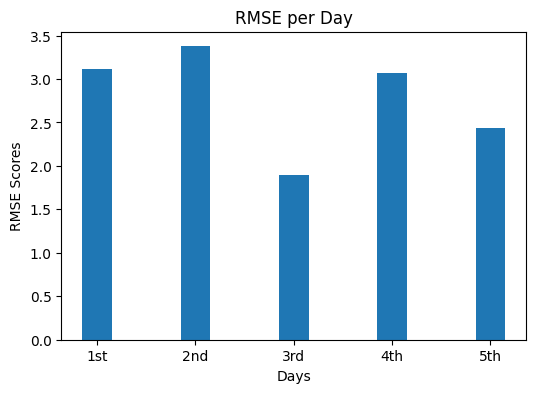

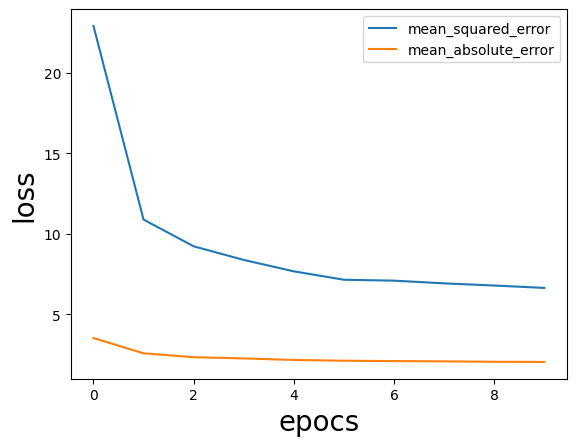

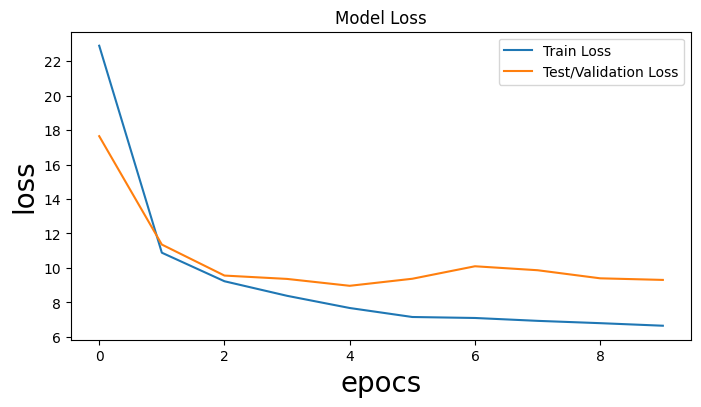

Model: "sequential_25"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_25 (ConvLSTM2D)  (None, 1, 1, 64)         55552     
                                                                 
 flatten_25 (Flatten)        (None, 64)                0         
                                                                 
 repeat_vector_25 (RepeatVec  (None, 5, 64)            0         
 tor)                                                            
                                                                 
 lstm_25 (LSTM)              (None, 5, 200)            212000    
                                                                 
 time_distributed_50 (TimeDi  (None, 5, 100)           20100     
 stributed)                                                      
                                                                 
 time_distributed_51 (TimeDi  (None, 5, 1)           

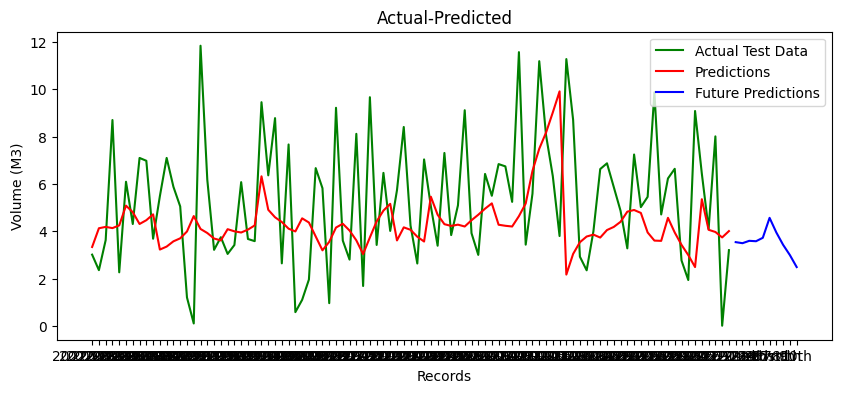

ConvLSTM: 2.922 RMSE (+/- 0.484) cfg_list [1, 3, 64, 100, 32, 5, 0.001, 200]


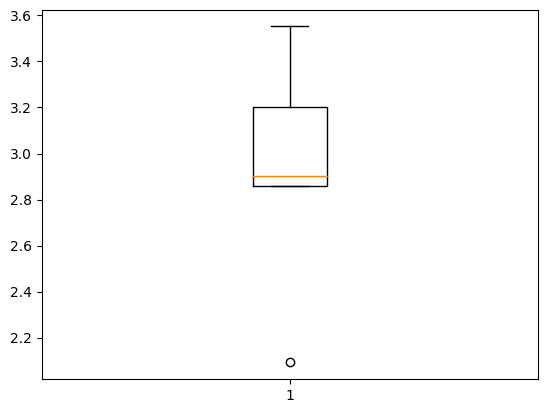

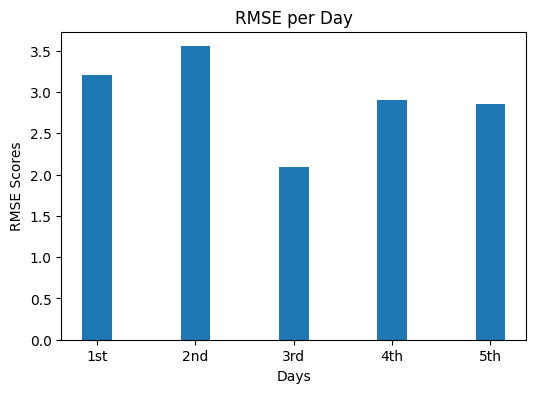

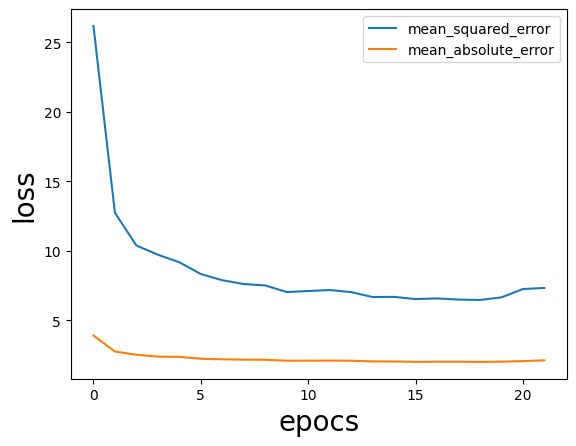

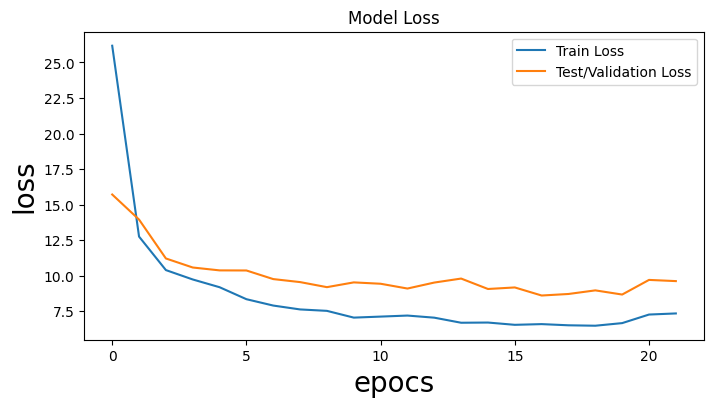

Model: "sequential_26"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_26 (ConvLSTM2D)  (None, 1, 1, 64)         55552     
                                                                 
 flatten_26 (Flatten)        (None, 64)                0         
                                                                 
 repeat_vector_26 (RepeatVec  (None, 5, 64)            0         
 tor)                                                            
                                                                 
 lstm_26 (LSTM)              (None, 5, 100)            66000     
                                                                 
 time_distributed_52 (TimeDi  (None, 5, 100)           10100     
 stributed)                                                      
                                                                 
 time_distributed_53 (TimeDi  (None, 5, 1)           

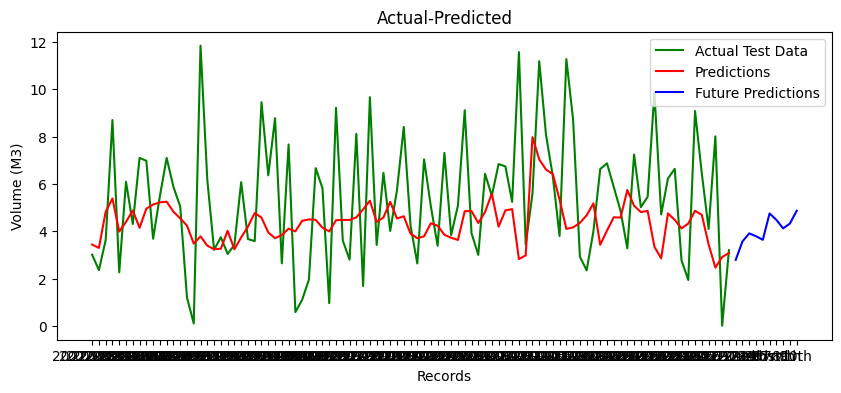

ConvLSTM: 2.770 RMSE (+/- 0.405) cfg_list [1, 3, 64, 100, 32, 5, 0.0001, 100]


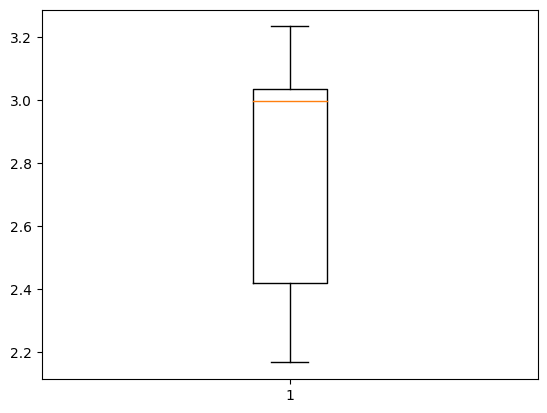

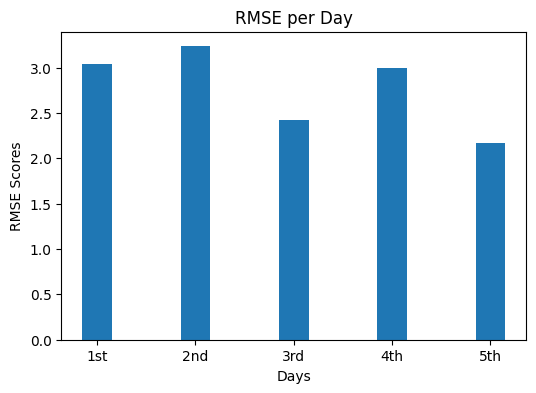

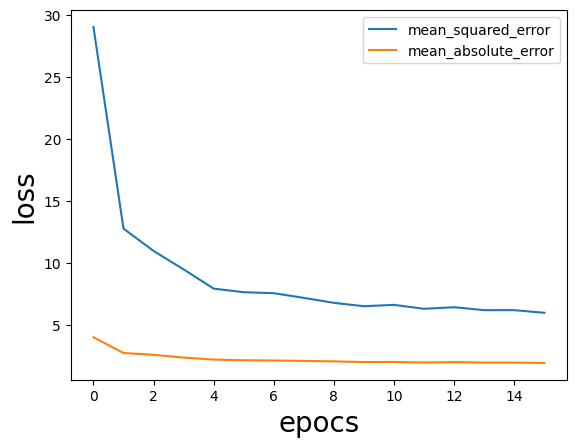

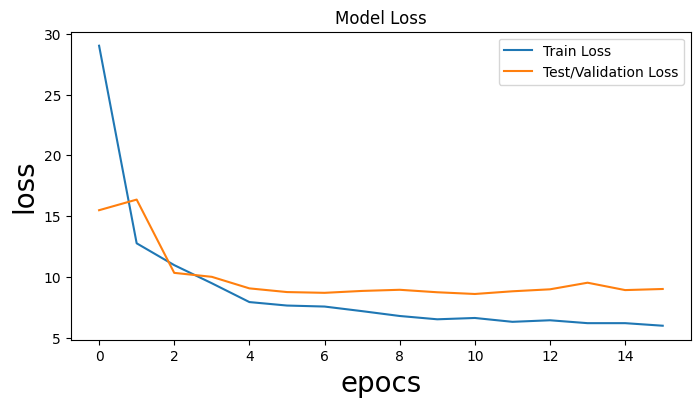

Model: "sequential_27"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_27 (ConvLSTM2D)  (None, 1, 1, 64)         55552     
                                                                 
 flatten_27 (Flatten)        (None, 64)                0         
                                                                 
 repeat_vector_27 (RepeatVec  (None, 5, 64)            0         
 tor)                                                            
                                                                 
 lstm_27 (LSTM)              (None, 5, 200)            212000    
                                                                 
 time_distributed_54 (TimeDi  (None, 5, 100)           20100     
 stributed)                                                      
                                                                 
 time_distributed_55 (TimeDi  (None, 5, 1)           

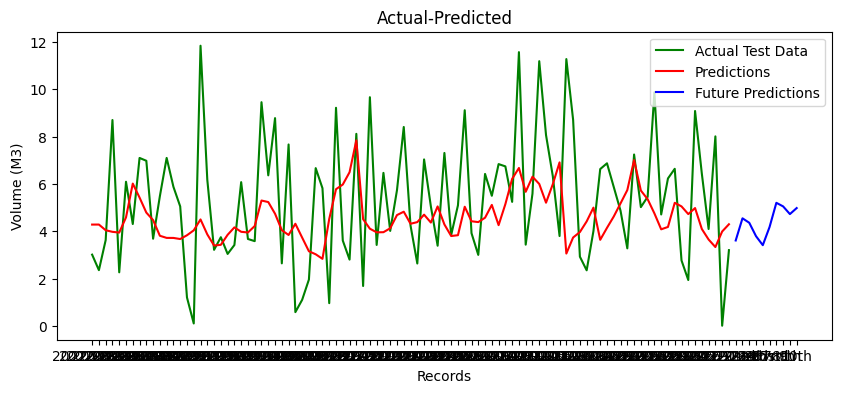

ConvLSTM: 2.693 RMSE (+/- 0.485) cfg_list [1, 3, 64, 100, 32, 5, 0.0001, 200]


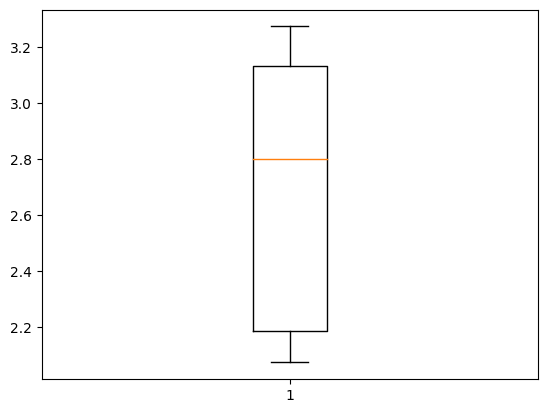

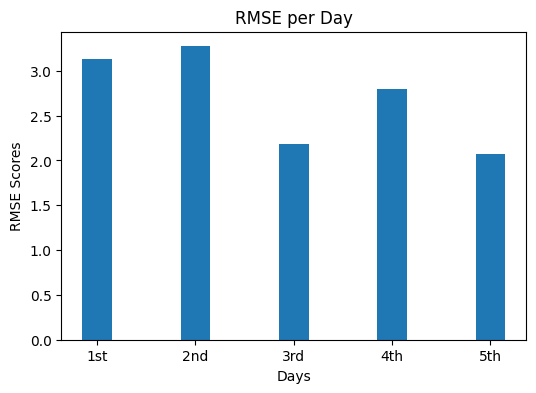

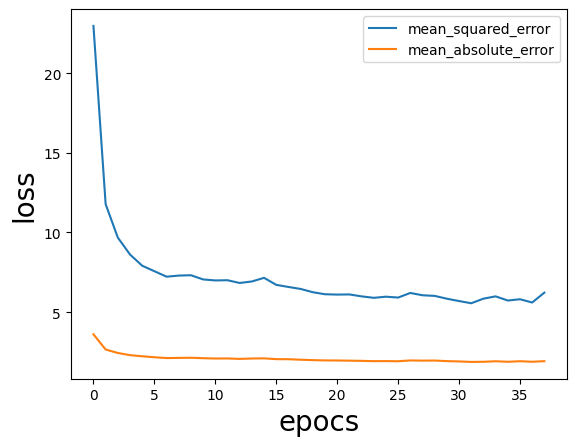

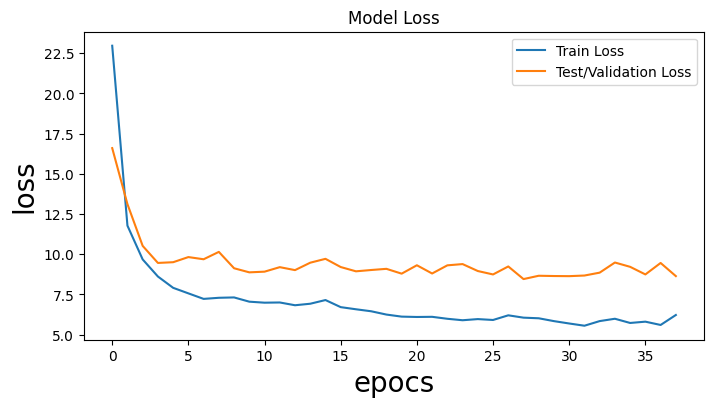

Model: "sequential_28"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_28 (ConvLSTM2D)  (None, 1, 1, 64)         55552     
                                                                 
 flatten_28 (Flatten)        (None, 64)                0         
                                                                 
 repeat_vector_28 (RepeatVec  (None, 5, 64)            0         
 tor)                                                            
                                                                 
 lstm_28 (LSTM)              (None, 5, 100)            66000     
                                                                 
 time_distributed_56 (TimeDi  (None, 5, 100)           10100     
 stributed)                                                      
                                                                 
 time_distributed_57 (TimeDi  (None, 5, 1)           

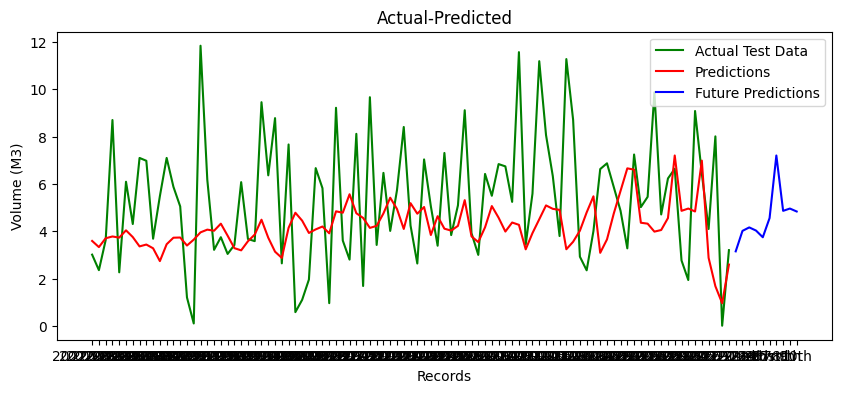

ConvLSTM: 2.904 RMSE (+/- 0.559) cfg_list [1, 3, 64, 100, 32, 10, 0.001, 100]


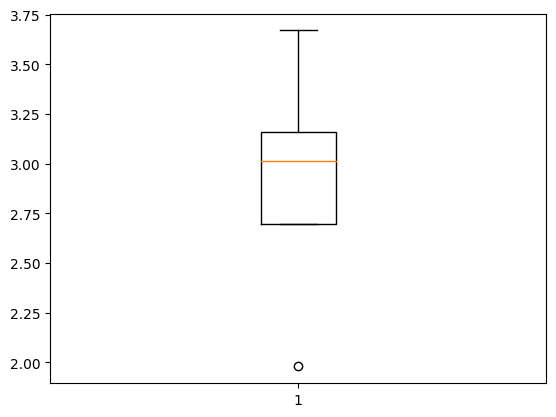

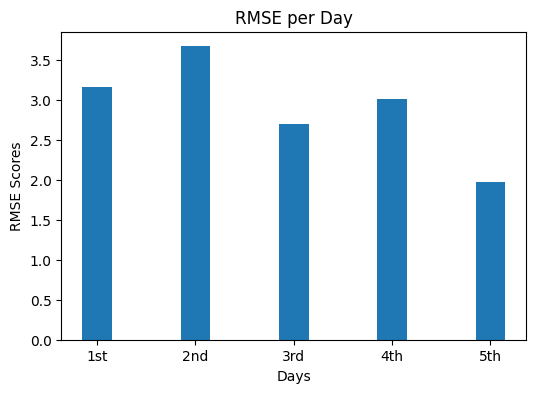

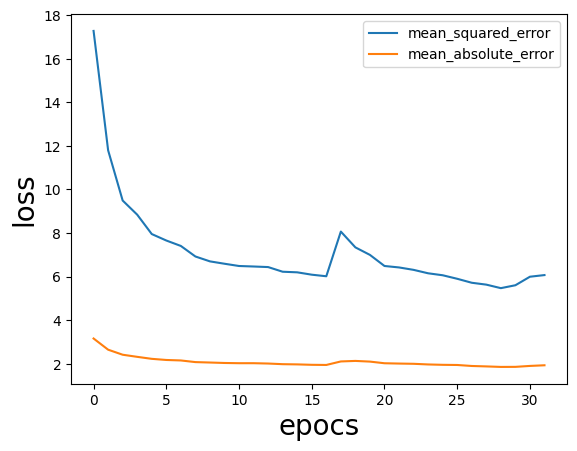

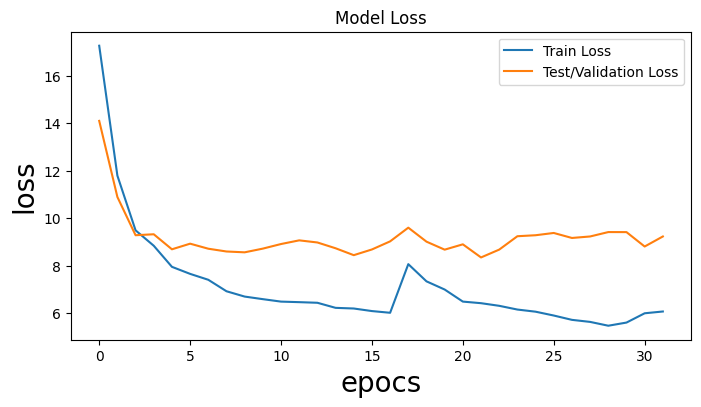

Model: "sequential_29"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_29 (ConvLSTM2D)  (None, 1, 1, 64)         55552     
                                                                 
 flatten_29 (Flatten)        (None, 64)                0         
                                                                 
 repeat_vector_29 (RepeatVec  (None, 5, 64)            0         
 tor)                                                            
                                                                 
 lstm_29 (LSTM)              (None, 5, 200)            212000    
                                                                 
 time_distributed_58 (TimeDi  (None, 5, 100)           20100     
 stributed)                                                      
                                                                 
 time_distributed_59 (TimeDi  (None, 5, 1)           

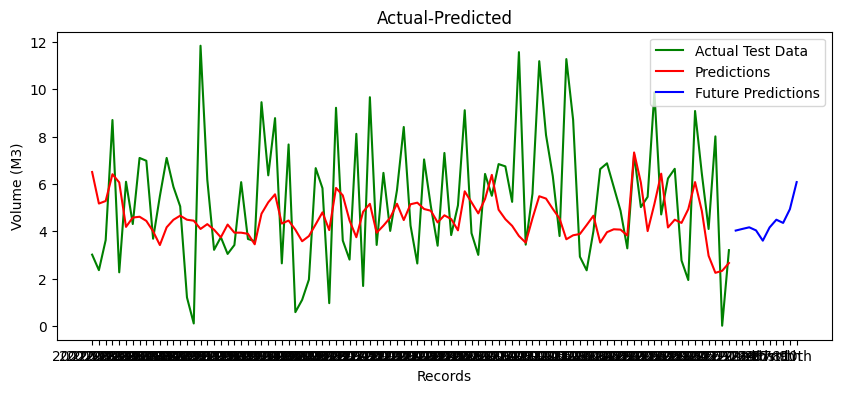

ConvLSTM: 2.687 RMSE (+/- 0.502) cfg_list [1, 3, 64, 100, 32, 10, 0.001, 200]


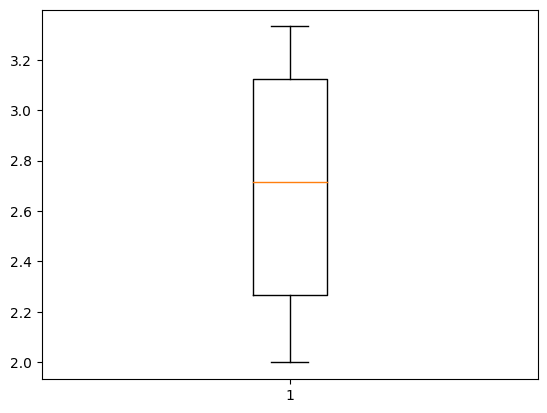

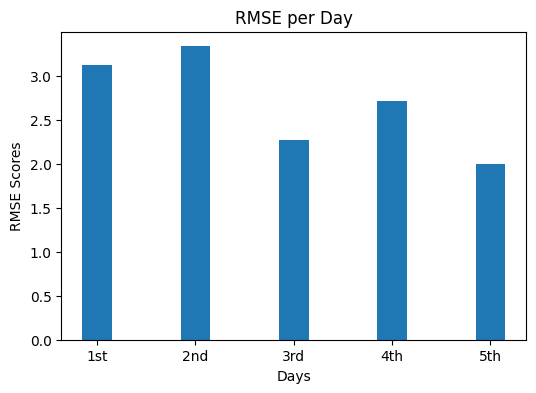

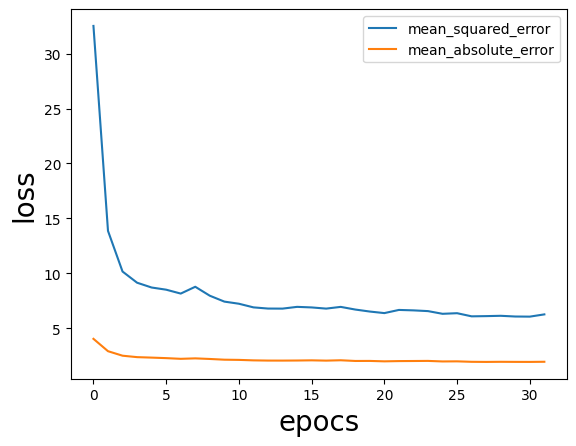

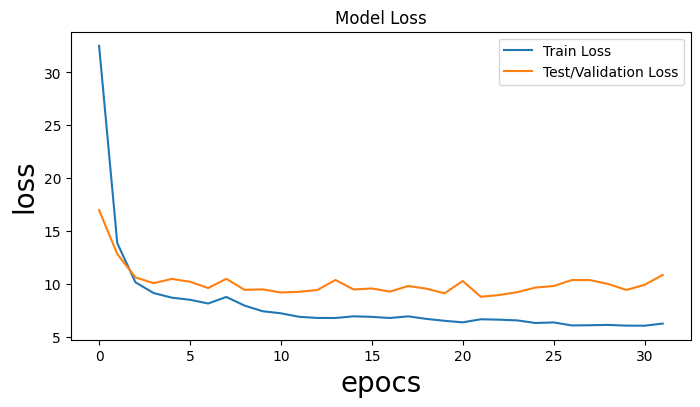

Model: "sequential_30"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_30 (ConvLSTM2D)  (None, 1, 1, 64)         55552     
                                                                 
 flatten_30 (Flatten)        (None, 64)                0         
                                                                 
 repeat_vector_30 (RepeatVec  (None, 5, 64)            0         
 tor)                                                            
                                                                 
 lstm_30 (LSTM)              (None, 5, 100)            66000     
                                                                 
 time_distributed_60 (TimeDi  (None, 5, 100)           10100     
 stributed)                                                      
                                                                 
 time_distributed_61 (TimeDi  (None, 5, 1)           

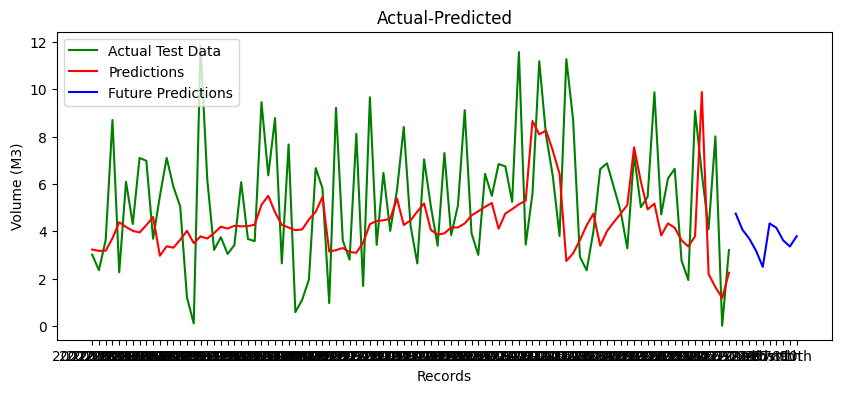

ConvLSTM: 2.807 RMSE (+/- 0.495) cfg_list [1, 3, 64, 100, 32, 10, 0.0001, 100]


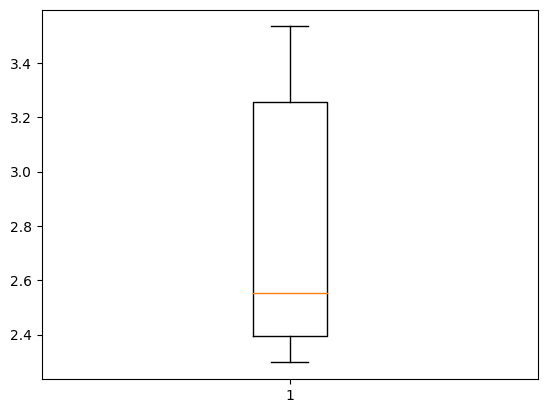

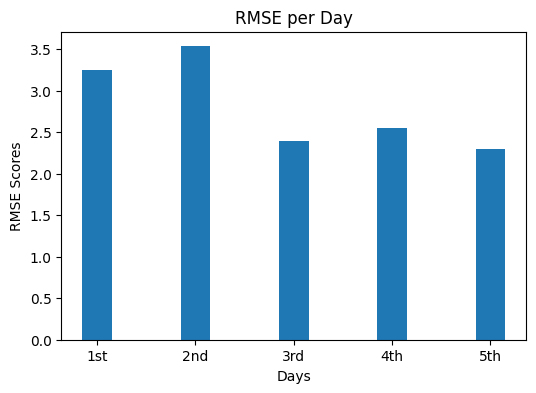

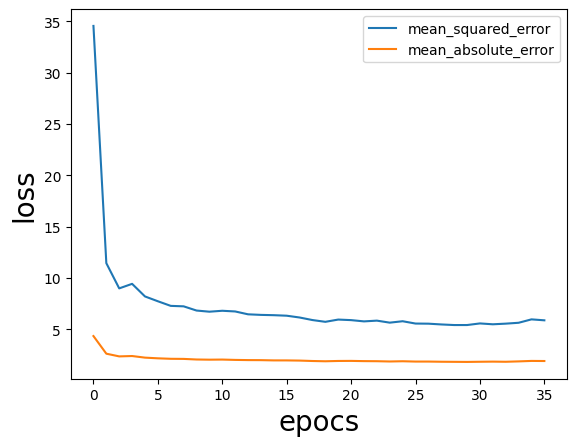

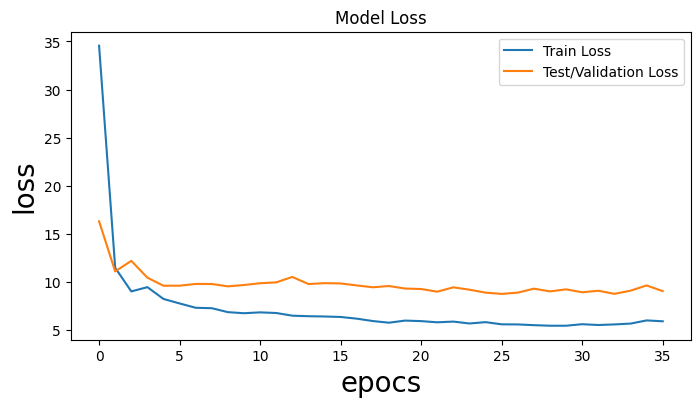

Model: "sequential_31"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_31 (ConvLSTM2D)  (None, 1, 1, 64)         55552     
                                                                 
 flatten_31 (Flatten)        (None, 64)                0         
                                                                 
 repeat_vector_31 (RepeatVec  (None, 5, 64)            0         
 tor)                                                            
                                                                 
 lstm_31 (LSTM)              (None, 5, 200)            212000    
                                                                 
 time_distributed_62 (TimeDi  (None, 5, 100)           20100     
 stributed)                                                      
                                                                 
 time_distributed_63 (TimeDi  (None, 5, 1)           

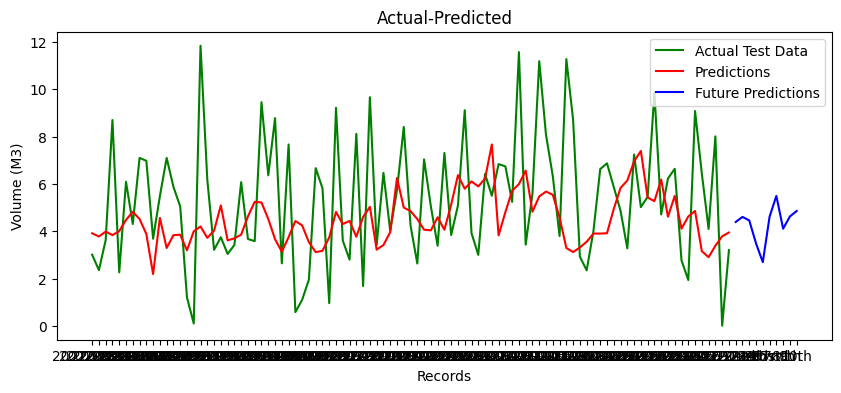

ConvLSTM: 2.794 RMSE (+/- 0.436) cfg_list [1, 3, 64, 100, 32, 10, 0.0001, 200]


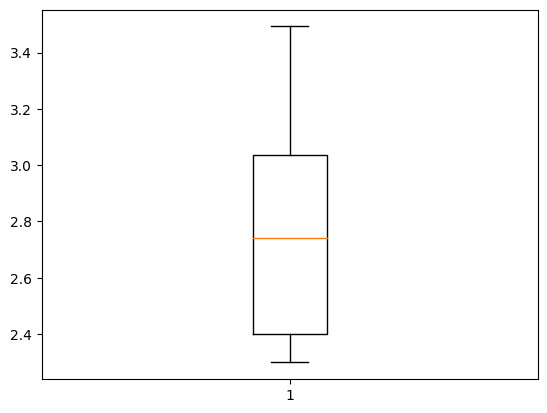

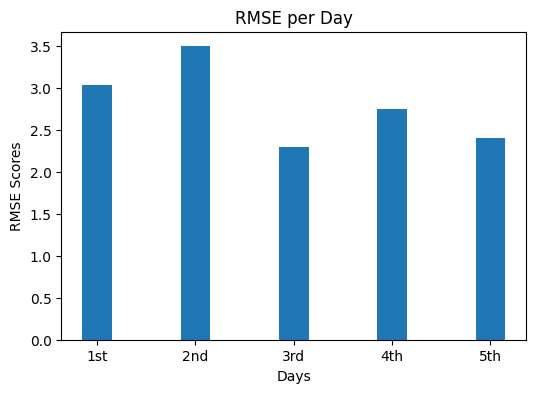

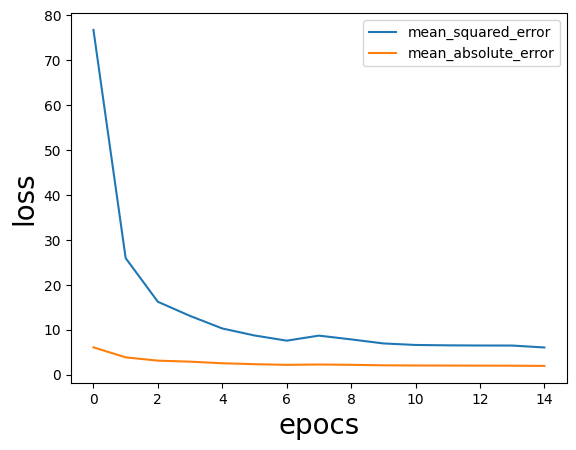

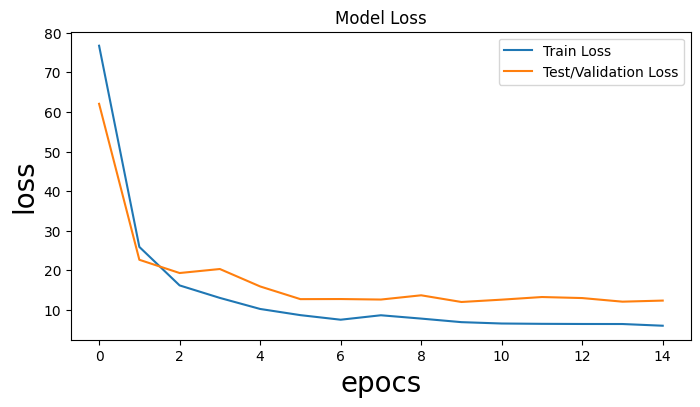

Model: "sequential_32"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_32 (ConvLSTM2D)  (None, 1, 3, 32)         15488     
                                                                 
 flatten_32 (Flatten)        (None, 96)                0         
                                                                 
 repeat_vector_32 (RepeatVec  (None, 5, 96)            0         
 tor)                                                            
                                                                 
 lstm_32 (LSTM)              (None, 5, 100)            78800     
                                                                 
 time_distributed_64 (TimeDi  (None, 5, 100)           10100     
 stributed)                                                      
                                                                 
 time_distributed_65 (TimeDi  (None, 5, 1)           

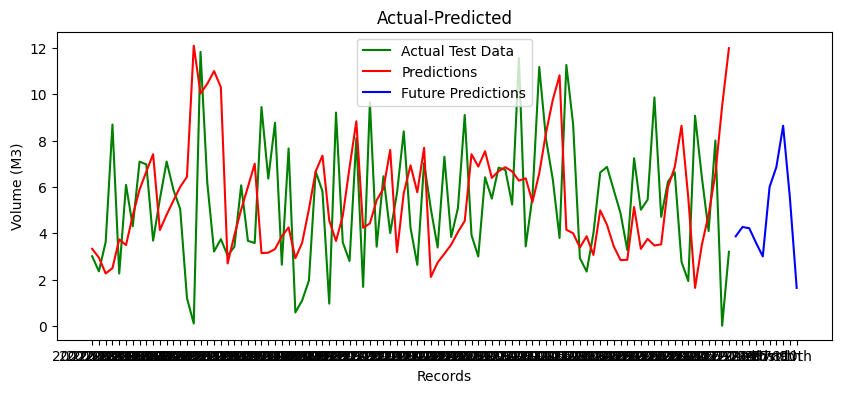

ConvLSTM: 3.617 RMSE (+/- 0.614) cfg_list [1, 5, 32, 100, 16, 5, 0.001, 100]


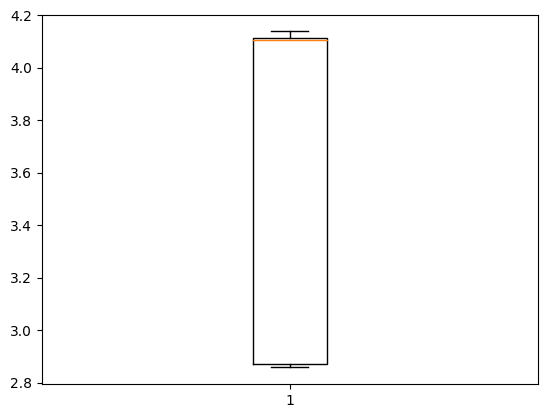

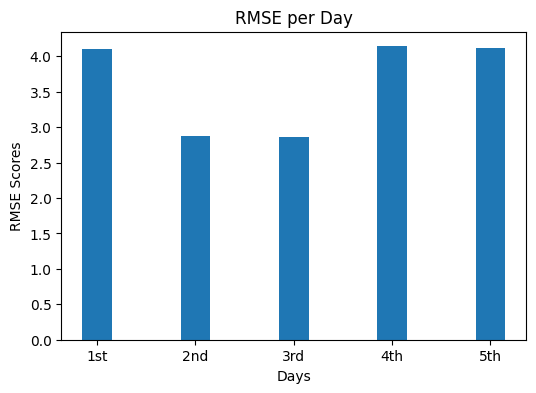

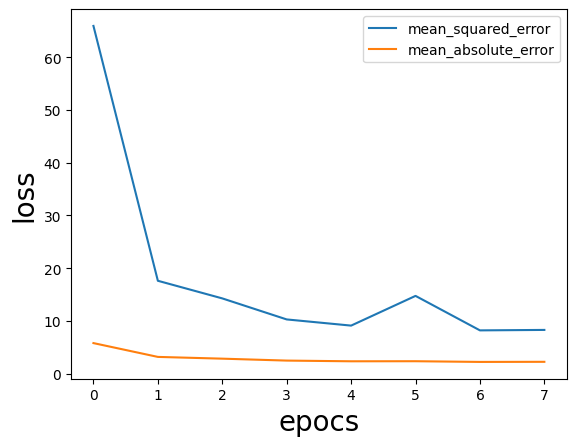

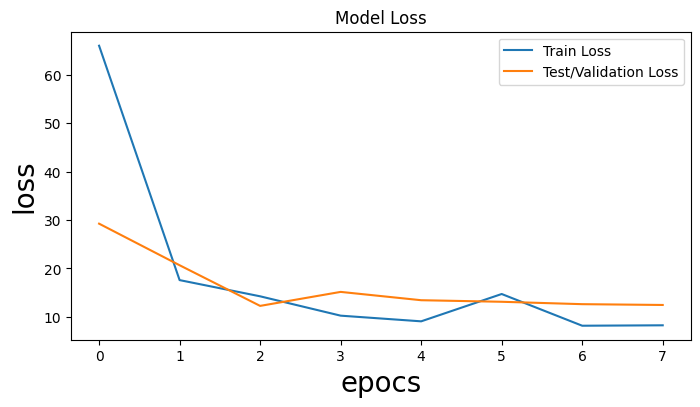

Model: "sequential_33"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_33 (ConvLSTM2D)  (None, 1, 3, 32)         15488     
                                                                 
 flatten_33 (Flatten)        (None, 96)                0         
                                                                 
 repeat_vector_33 (RepeatVec  (None, 5, 96)            0         
 tor)                                                            
                                                                 
 lstm_33 (LSTM)              (None, 5, 200)            237600    
                                                                 
 time_distributed_66 (TimeDi  (None, 5, 100)           20100     
 stributed)                                                      
                                                                 
 time_distributed_67 (TimeDi  (None, 5, 1)           

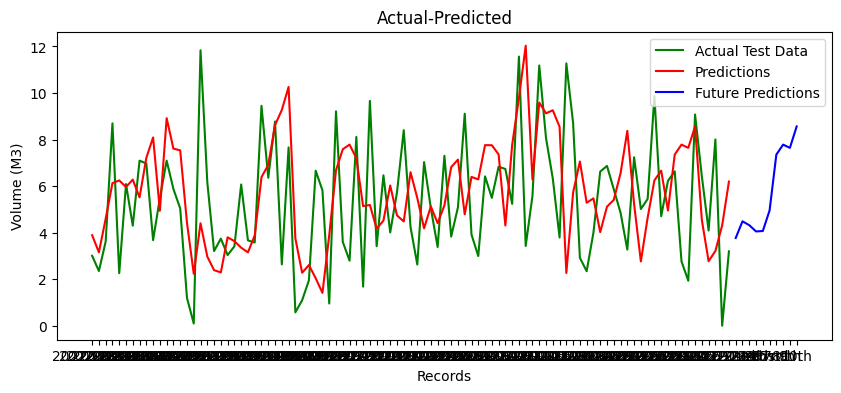

ConvLSTM: 3.040 RMSE (+/- 0.336) cfg_list [1, 5, 32, 100, 16, 5, 0.001, 200]


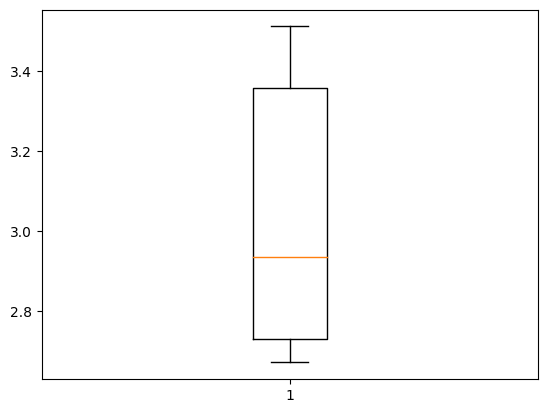

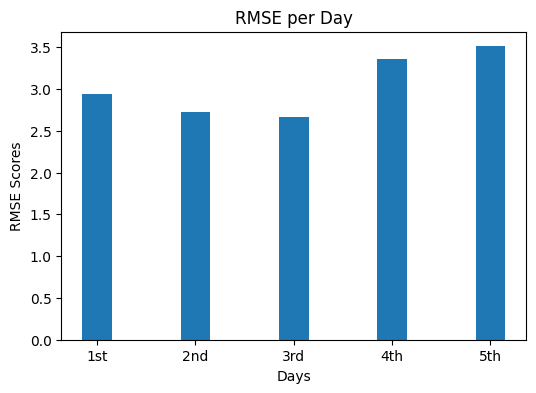

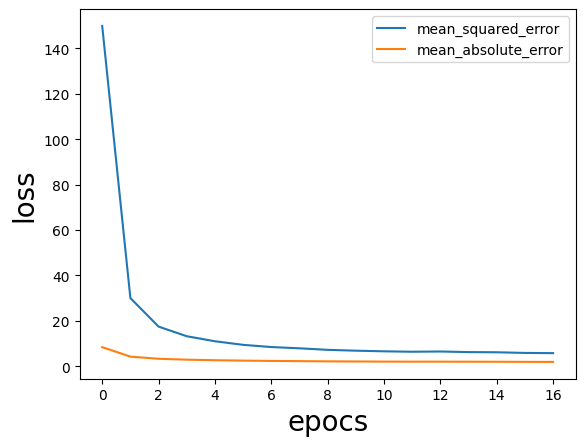

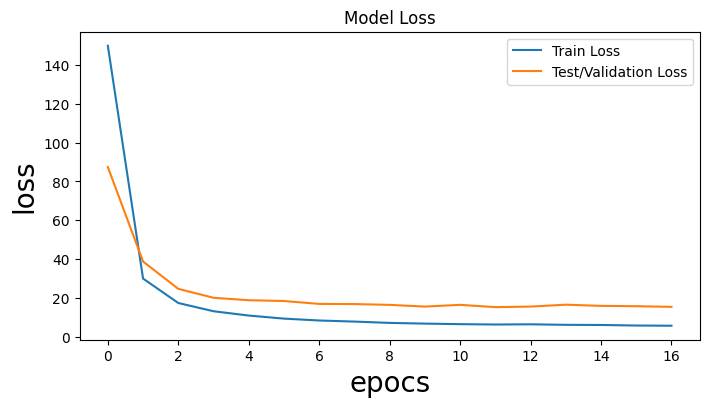

Model: "sequential_34"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_34 (ConvLSTM2D)  (None, 1, 3, 32)         15488     
                                                                 
 flatten_34 (Flatten)        (None, 96)                0         
                                                                 
 repeat_vector_34 (RepeatVec  (None, 5, 96)            0         
 tor)                                                            
                                                                 
 lstm_34 (LSTM)              (None, 5, 100)            78800     
                                                                 
 time_distributed_68 (TimeDi  (None, 5, 100)           10100     
 stributed)                                                      
                                                                 
 time_distributed_69 (TimeDi  (None, 5, 1)           

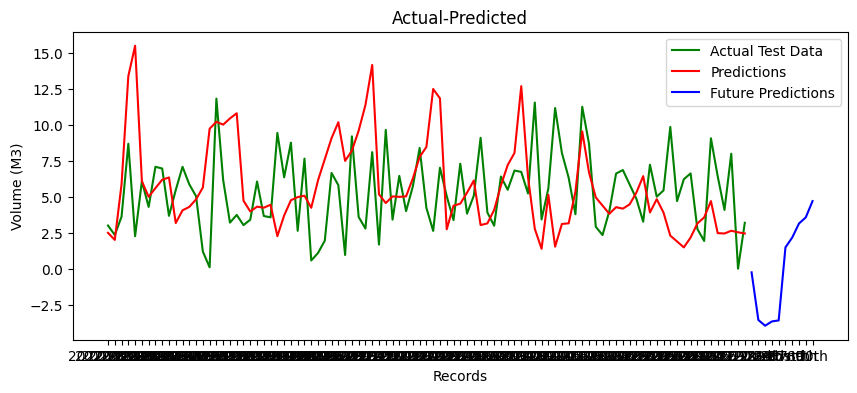

ConvLSTM: 4.032 RMSE (+/- 0.552) cfg_list [1, 5, 32, 100, 16, 5, 0.0001, 100]


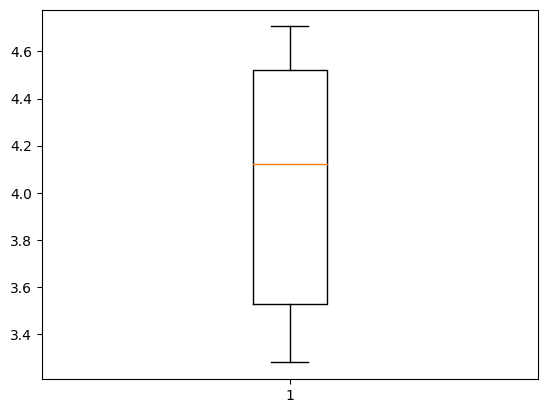

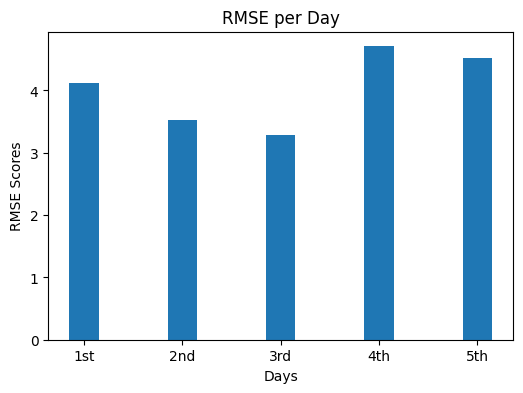

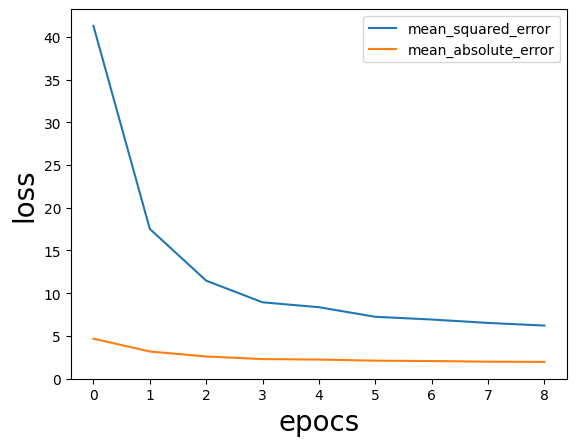

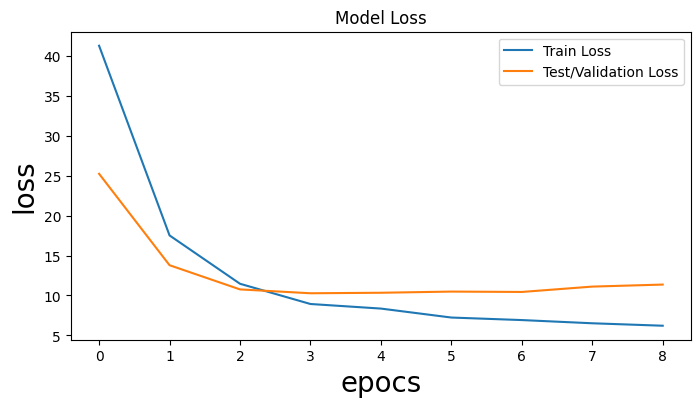

Model: "sequential_35"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_35 (ConvLSTM2D)  (None, 1, 3, 32)         15488     
                                                                 
 flatten_35 (Flatten)        (None, 96)                0         
                                                                 
 repeat_vector_35 (RepeatVec  (None, 5, 96)            0         
 tor)                                                            
                                                                 
 lstm_35 (LSTM)              (None, 5, 200)            237600    
                                                                 
 time_distributed_70 (TimeDi  (None, 5, 100)           20100     
 stributed)                                                      
                                                                 
 time_distributed_71 (TimeDi  (None, 5, 1)           

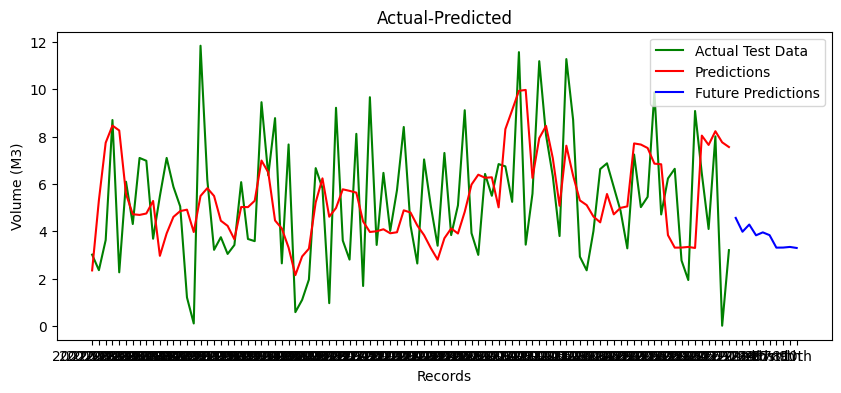

ConvLSTM: 2.697 RMSE (+/- 0.382) cfg_list [1, 5, 32, 100, 16, 5, 0.0001, 200]


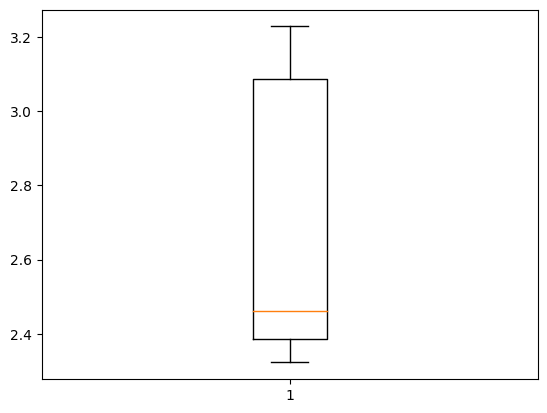

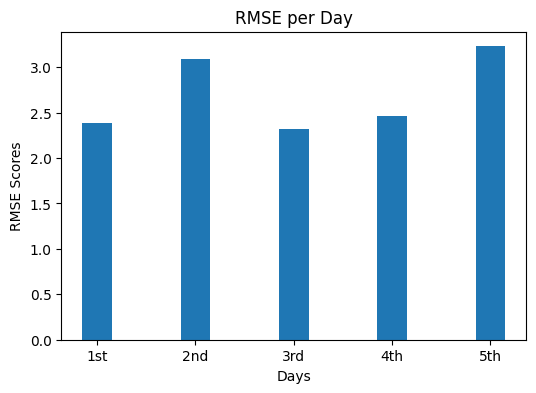

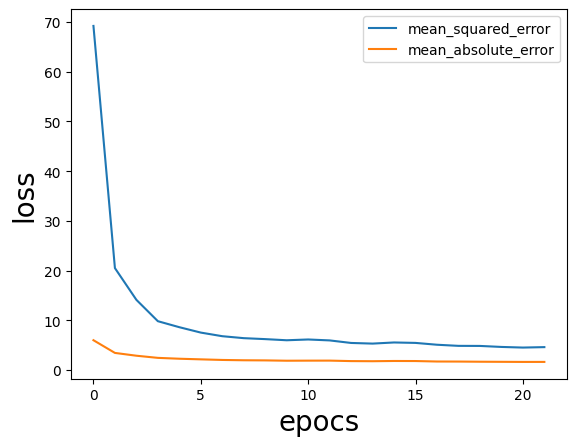

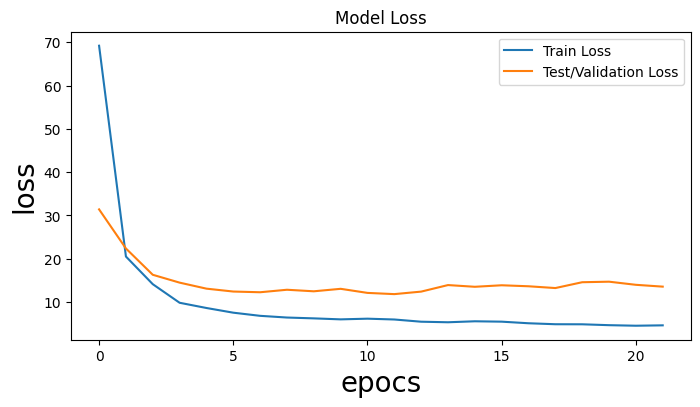

Model: "sequential_36"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_36 (ConvLSTM2D)  (None, 1, 3, 32)         15488     
                                                                 
 flatten_36 (Flatten)        (None, 96)                0         
                                                                 
 repeat_vector_36 (RepeatVec  (None, 5, 96)            0         
 tor)                                                            
                                                                 
 lstm_36 (LSTM)              (None, 5, 100)            78800     
                                                                 
 time_distributed_72 (TimeDi  (None, 5, 100)           10100     
 stributed)                                                      
                                                                 
 time_distributed_73 (TimeDi  (None, 5, 1)           

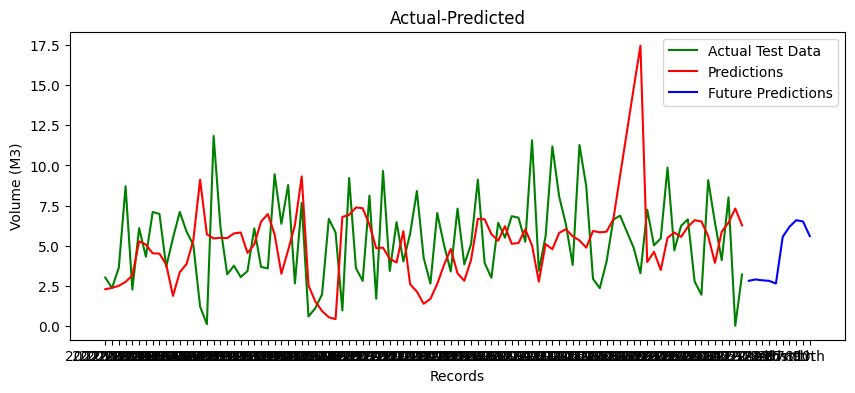

ConvLSTM: 3.644 RMSE (+/- 0.679) cfg_list [1, 5, 32, 100, 16, 10, 0.001, 100]


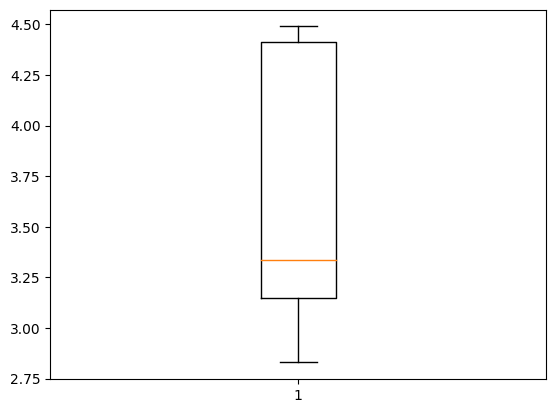

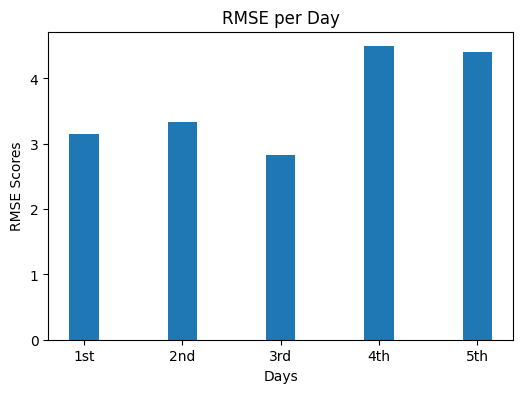

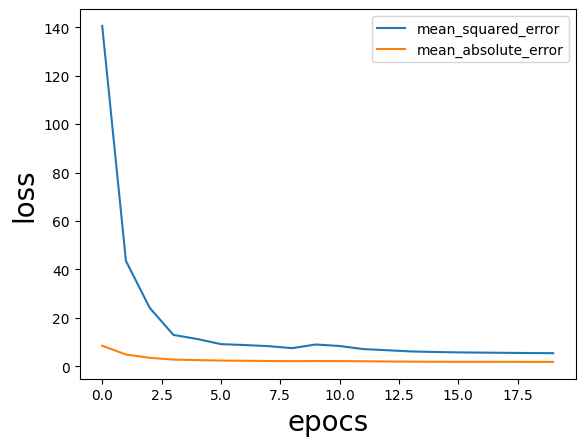

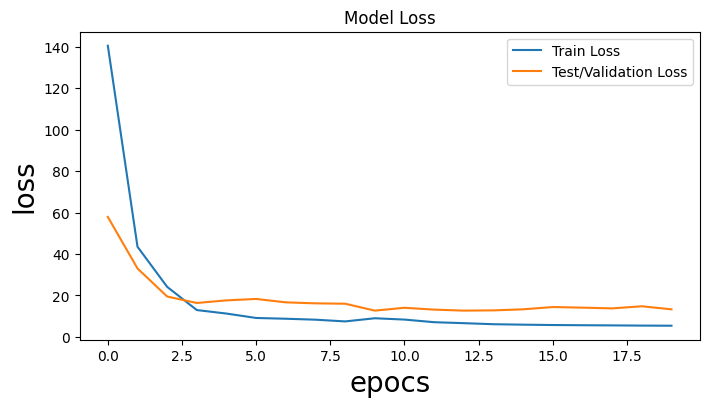

Model: "sequential_37"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_37 (ConvLSTM2D)  (None, 1, 3, 32)         15488     
                                                                 
 flatten_37 (Flatten)        (None, 96)                0         
                                                                 
 repeat_vector_37 (RepeatVec  (None, 5, 96)            0         
 tor)                                                            
                                                                 
 lstm_37 (LSTM)              (None, 5, 200)            237600    
                                                                 
 time_distributed_74 (TimeDi  (None, 5, 100)           20100     
 stributed)                                                      
                                                                 
 time_distributed_75 (TimeDi  (None, 5, 1)           

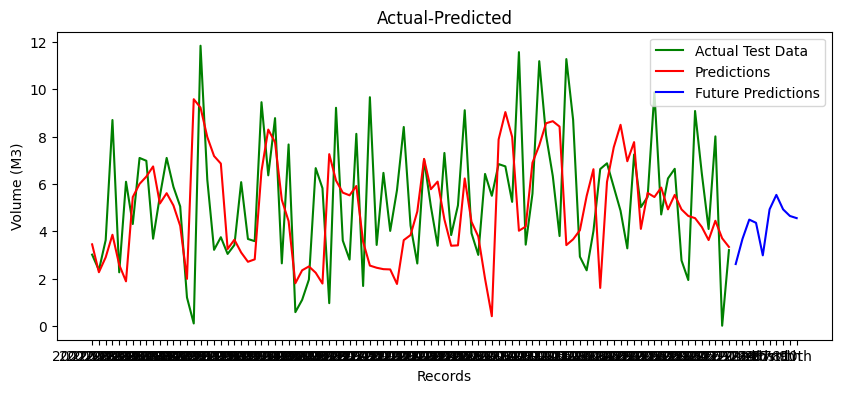

ConvLSTM: 2.961 RMSE (+/- 0.730) cfg_list [1, 5, 32, 100, 16, 10, 0.001, 200]


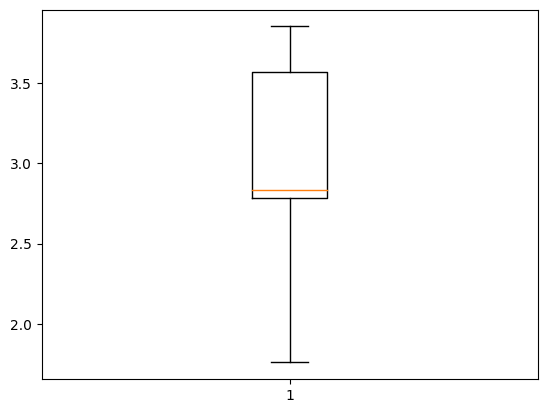

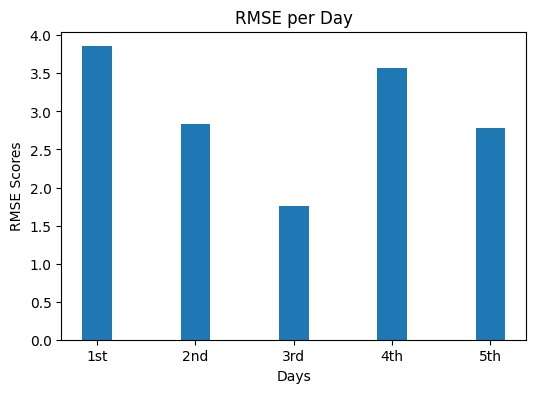

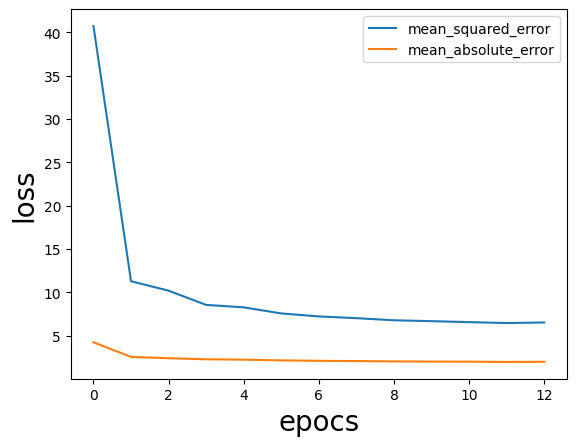

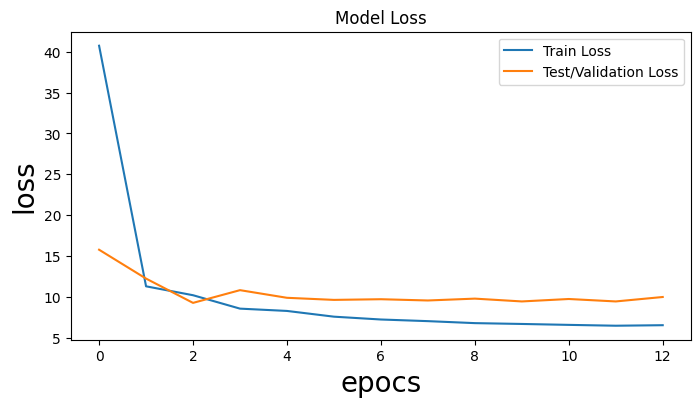

Model: "sequential_38"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_38 (ConvLSTM2D)  (None, 1, 3, 32)         15488     
                                                                 
 flatten_38 (Flatten)        (None, 96)                0         
                                                                 
 repeat_vector_38 (RepeatVec  (None, 5, 96)            0         
 tor)                                                            
                                                                 
 lstm_38 (LSTM)              (None, 5, 100)            78800     
                                                                 
 time_distributed_76 (TimeDi  (None, 5, 100)           10100     
 stributed)                                                      
                                                                 
 time_distributed_77 (TimeDi  (None, 5, 1)           

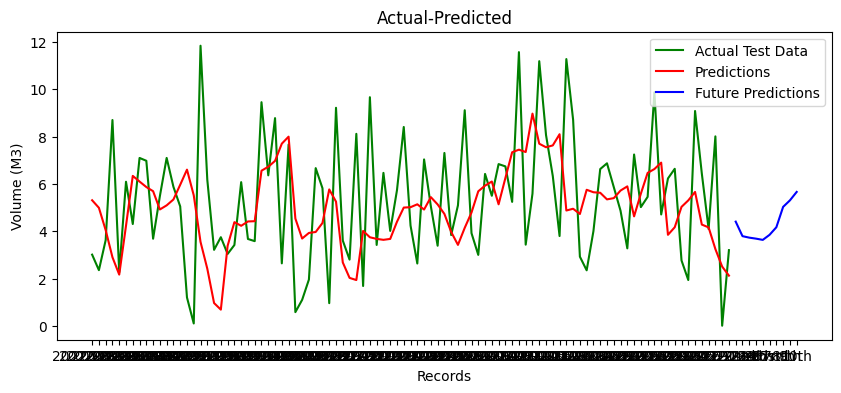

ConvLSTM: 2.803 RMSE (+/- 0.419) cfg_list [1, 5, 32, 100, 16, 10, 0.0001, 100]


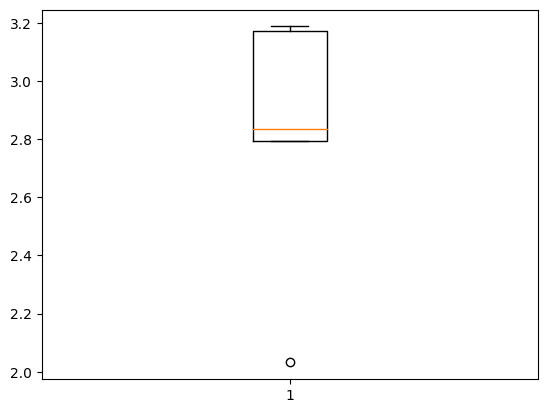

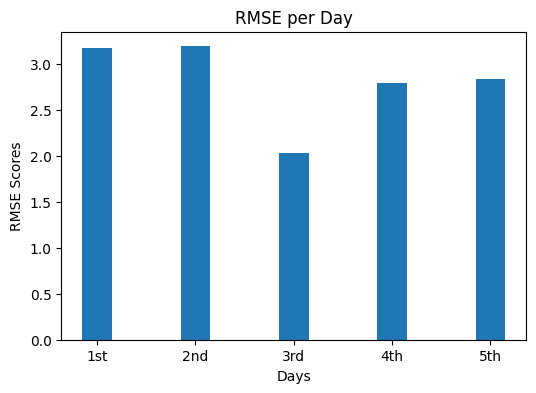

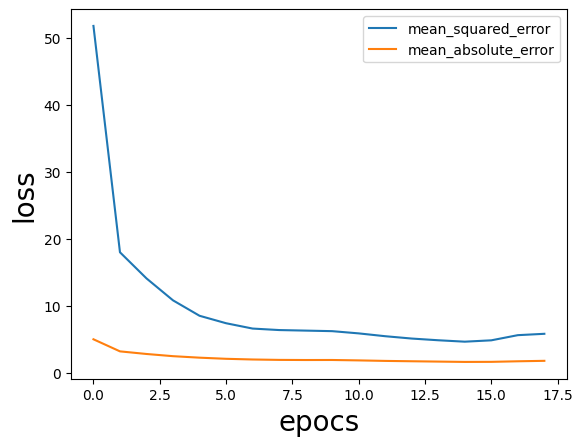

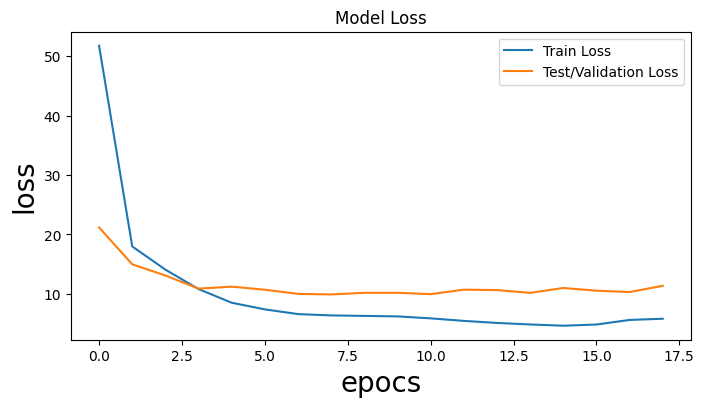

Model: "sequential_39"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_39 (ConvLSTM2D)  (None, 1, 3, 32)         15488     
                                                                 
 flatten_39 (Flatten)        (None, 96)                0         
                                                                 
 repeat_vector_39 (RepeatVec  (None, 5, 96)            0         
 tor)                                                            
                                                                 
 lstm_39 (LSTM)              (None, 5, 200)            237600    
                                                                 
 time_distributed_78 (TimeDi  (None, 5, 100)           20100     
 stributed)                                                      
                                                                 
 time_distributed_79 (TimeDi  (None, 5, 1)           

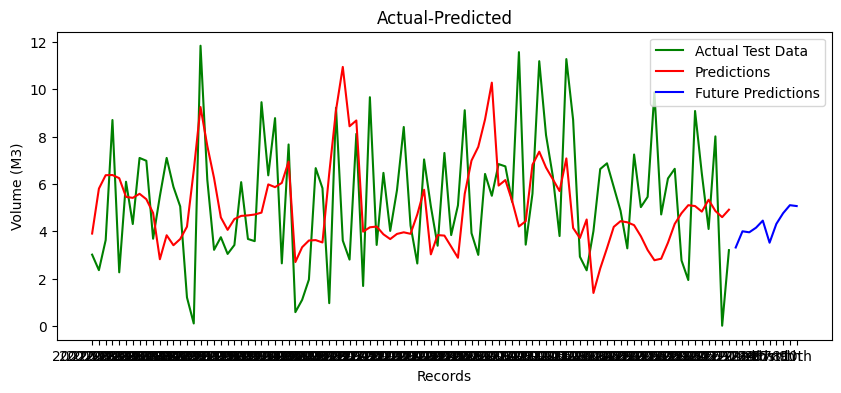

ConvLSTM: 2.900 RMSE (+/- 0.403) cfg_list [1, 5, 32, 100, 16, 10, 0.0001, 200]


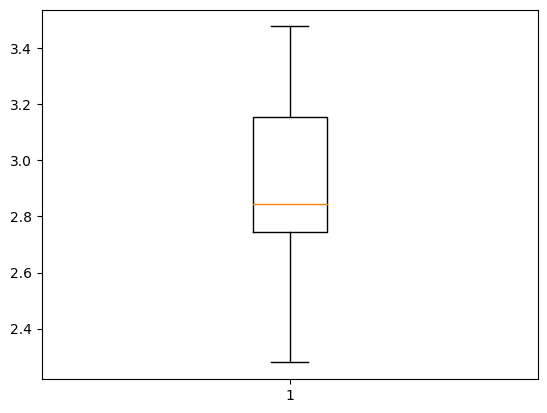

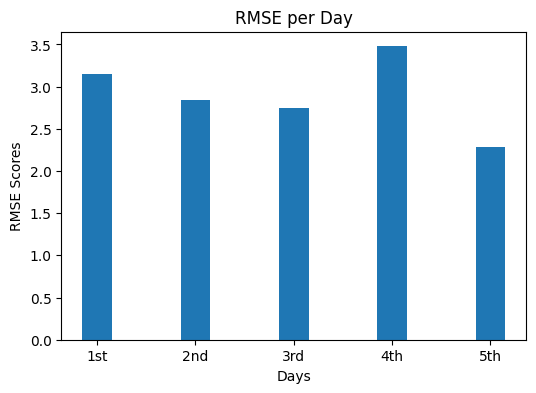

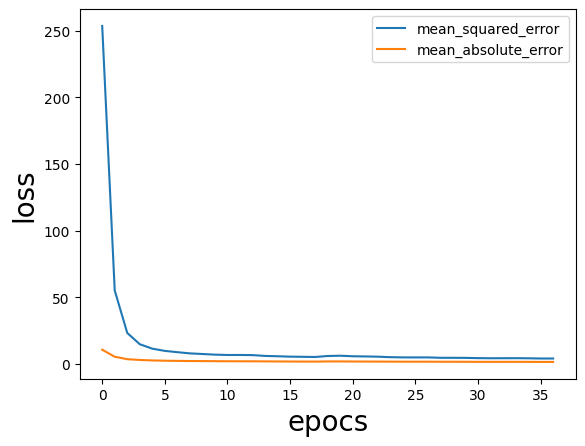

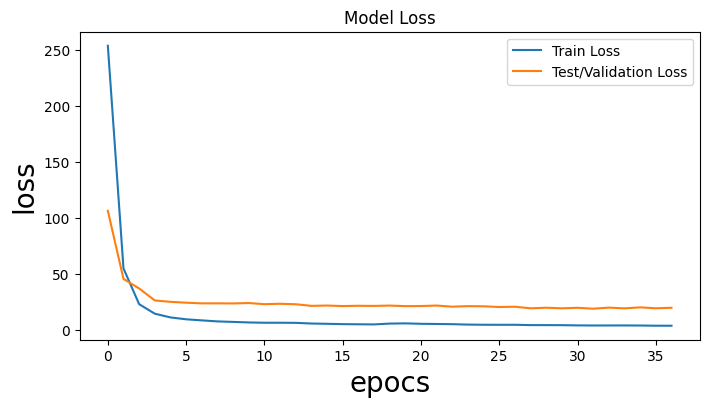

Model: "sequential_40"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_40 (ConvLSTM2D)  (None, 1, 3, 32)         15488     
                                                                 
 flatten_40 (Flatten)        (None, 96)                0         
                                                                 
 repeat_vector_40 (RepeatVec  (None, 5, 96)            0         
 tor)                                                            
                                                                 
 lstm_40 (LSTM)              (None, 5, 100)            78800     
                                                                 
 time_distributed_80 (TimeDi  (None, 5, 100)           10100     
 stributed)                                                      
                                                                 
 time_distributed_81 (TimeDi  (None, 5, 1)           

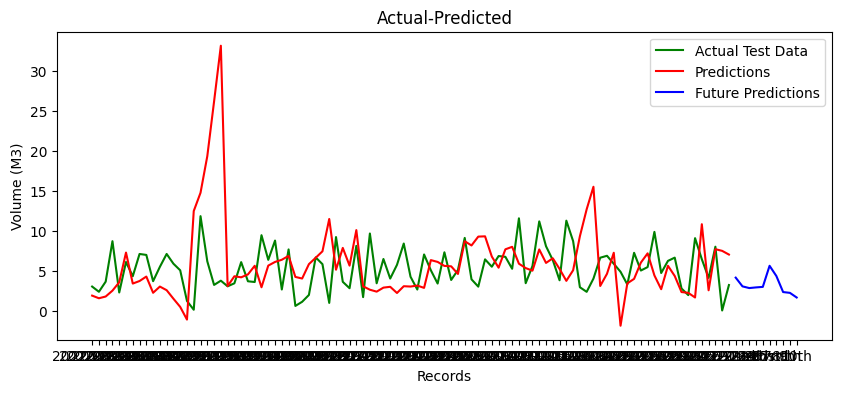

ConvLSTM: 5.409 RMSE (+/- 1.651) cfg_list [1, 5, 32, 100, 32, 5, 0.001, 100]


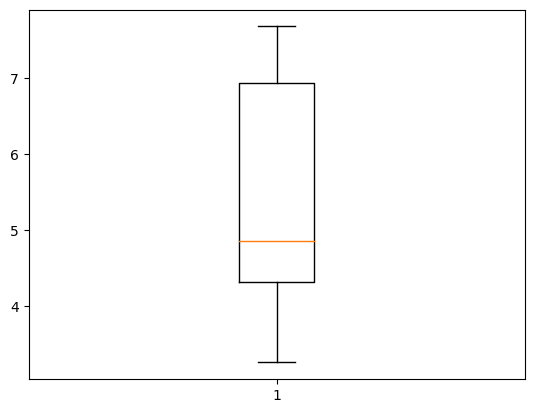

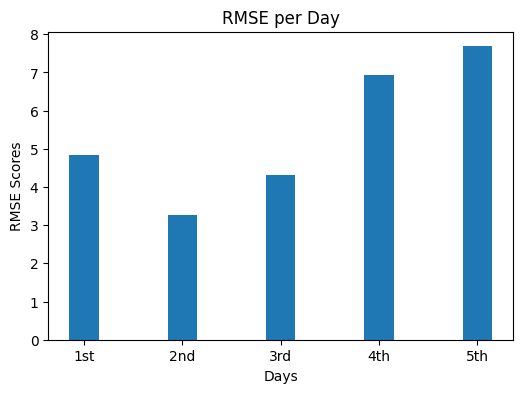

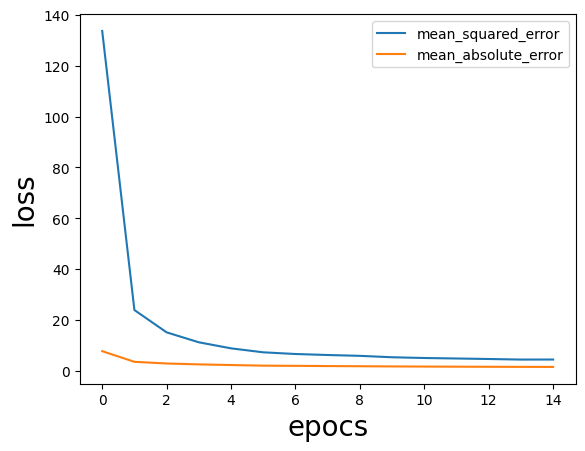

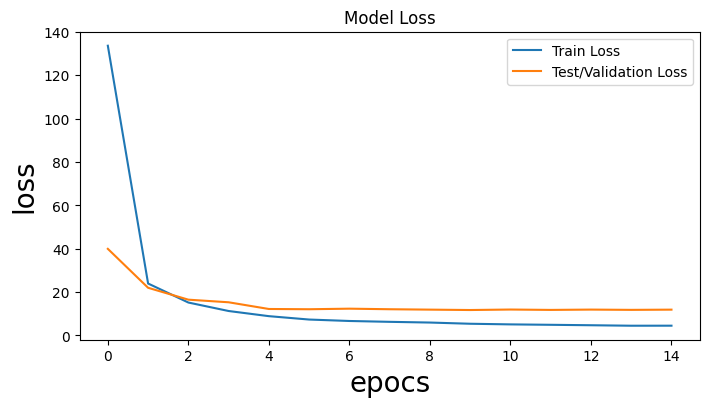

Model: "sequential_41"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_41 (ConvLSTM2D)  (None, 1, 3, 32)         15488     
                                                                 
 flatten_41 (Flatten)        (None, 96)                0         
                                                                 
 repeat_vector_41 (RepeatVec  (None, 5, 96)            0         
 tor)                                                            
                                                                 
 lstm_41 (LSTM)              (None, 5, 200)            237600    
                                                                 
 time_distributed_82 (TimeDi  (None, 5, 100)           20100     
 stributed)                                                      
                                                                 
 time_distributed_83 (TimeDi  (None, 5, 1)           

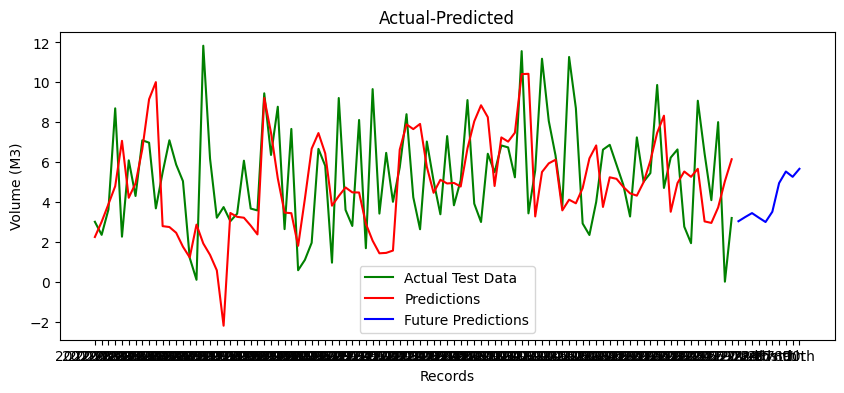

ConvLSTM: 3.190 RMSE (+/- 0.464) cfg_list [1, 5, 32, 100, 32, 5, 0.001, 200]


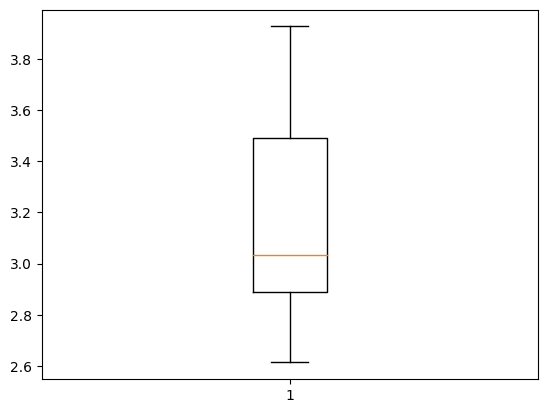

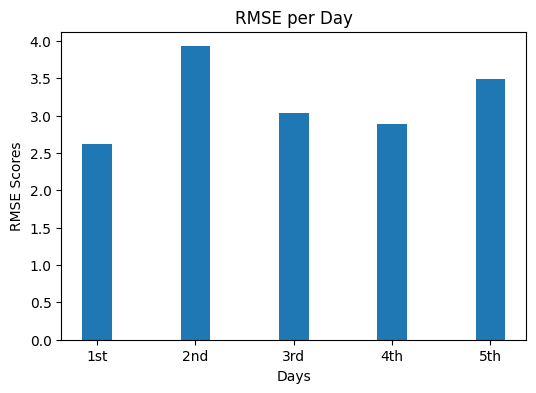

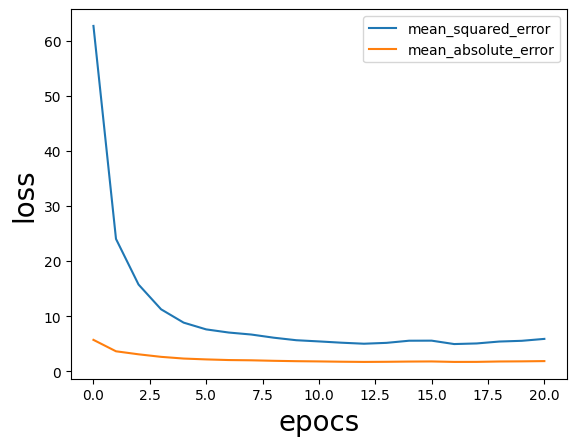

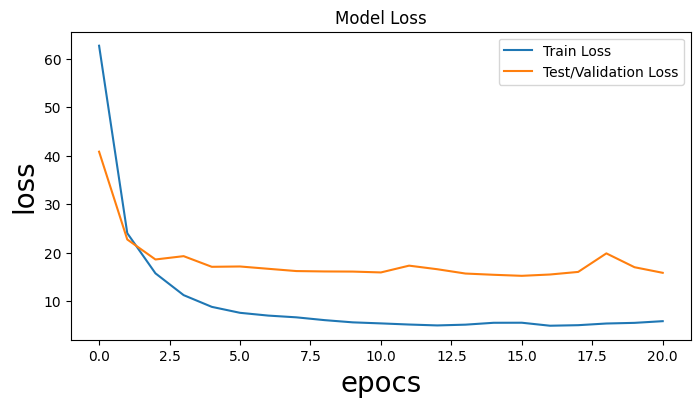

Model: "sequential_42"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_42 (ConvLSTM2D)  (None, 1, 3, 32)         15488     
                                                                 
 flatten_42 (Flatten)        (None, 96)                0         
                                                                 
 repeat_vector_42 (RepeatVec  (None, 5, 96)            0         
 tor)                                                            
                                                                 
 lstm_42 (LSTM)              (None, 5, 100)            78800     
                                                                 
 time_distributed_84 (TimeDi  (None, 5, 100)           10100     
 stributed)                                                      
                                                                 
 time_distributed_85 (TimeDi  (None, 5, 1)           

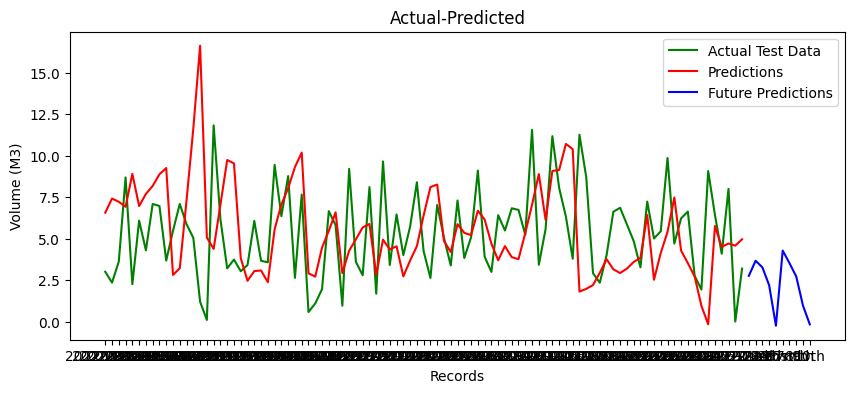

ConvLSTM: 3.593 RMSE (+/- 1.104) cfg_list [1, 5, 32, 100, 32, 5, 0.0001, 100]


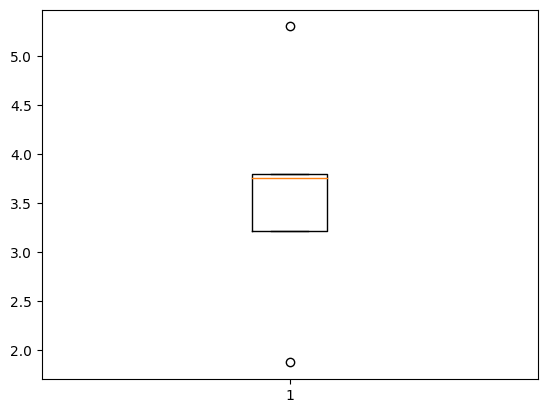

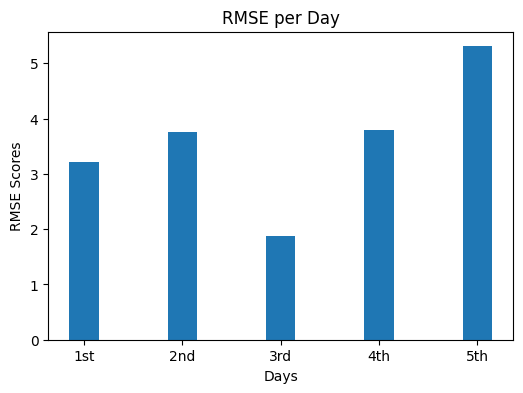

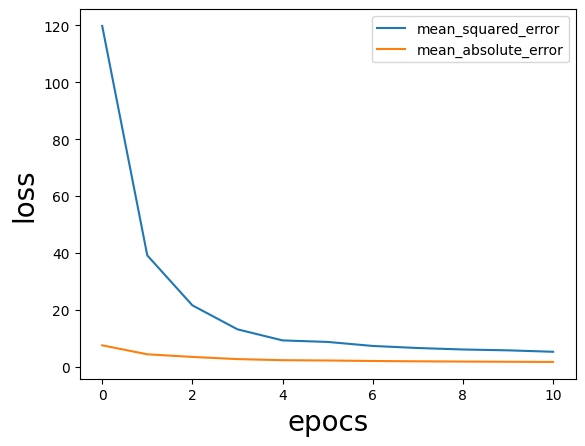

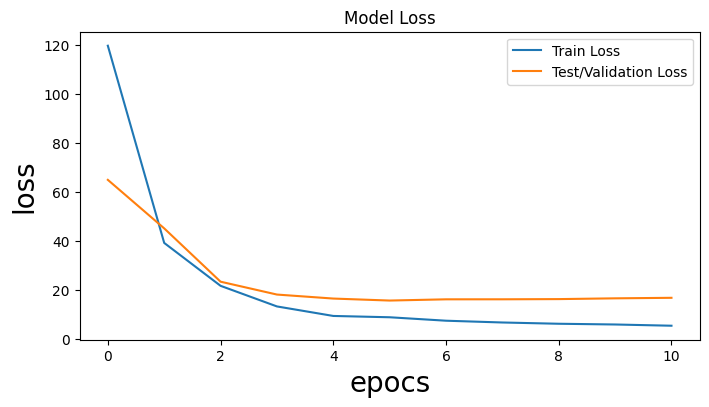

Model: "sequential_43"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_43 (ConvLSTM2D)  (None, 1, 3, 32)         15488     
                                                                 
 flatten_43 (Flatten)        (None, 96)                0         
                                                                 
 repeat_vector_43 (RepeatVec  (None, 5, 96)            0         
 tor)                                                            
                                                                 
 lstm_43 (LSTM)              (None, 5, 200)            237600    
                                                                 
 time_distributed_86 (TimeDi  (None, 5, 100)           20100     
 stributed)                                                      
                                                                 
 time_distributed_87 (TimeDi  (None, 5, 1)           

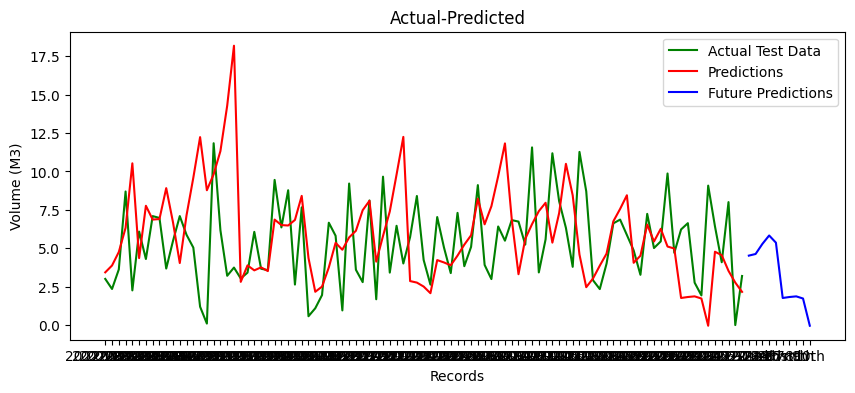

ConvLSTM: 3.802 RMSE (+/- 1.146) cfg_list [1, 5, 32, 100, 32, 5, 0.0001, 200]


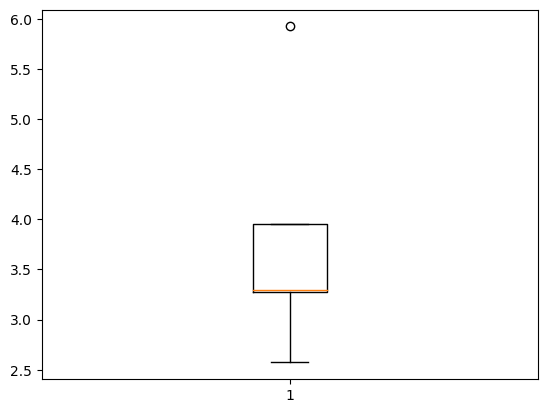

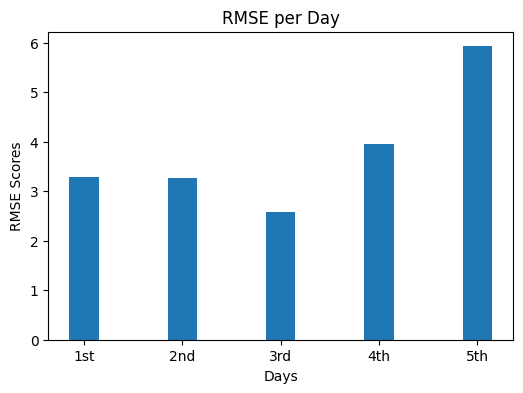

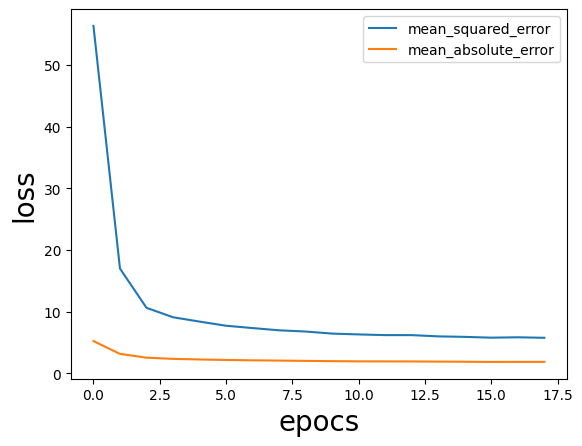

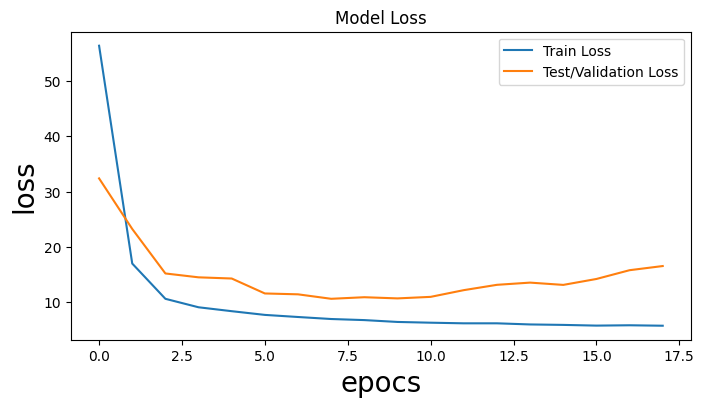

Model: "sequential_44"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_44 (ConvLSTM2D)  (None, 1, 3, 32)         15488     
                                                                 
 flatten_44 (Flatten)        (None, 96)                0         
                                                                 
 repeat_vector_44 (RepeatVec  (None, 5, 96)            0         
 tor)                                                            
                                                                 
 lstm_44 (LSTM)              (None, 5, 100)            78800     
                                                                 
 time_distributed_88 (TimeDi  (None, 5, 100)           10100     
 stributed)                                                      
                                                                 
 time_distributed_89 (TimeDi  (None, 5, 1)           

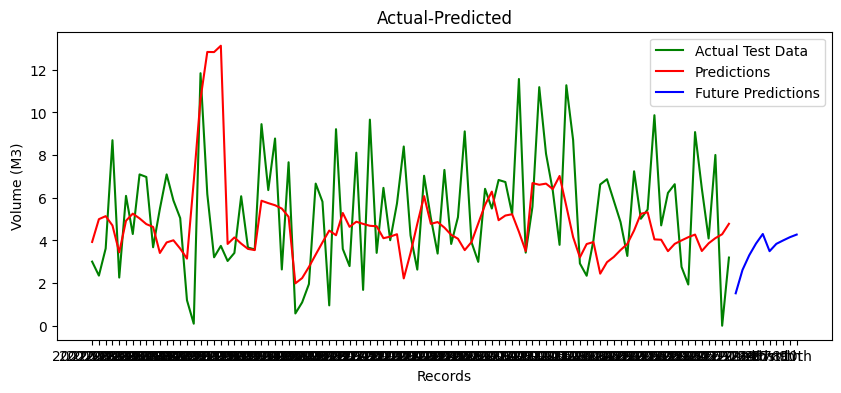

ConvLSTM: 3.055 RMSE (+/- 0.426) cfg_list [1, 5, 32, 100, 32, 10, 0.001, 100]


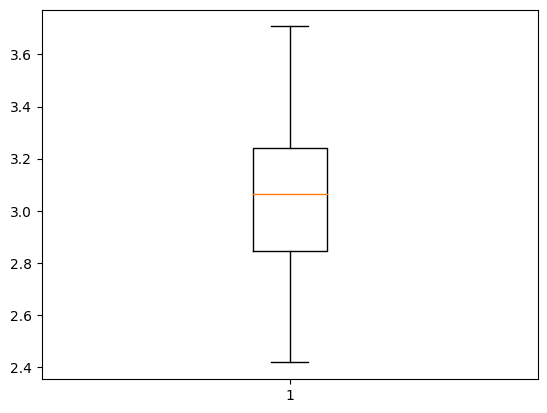

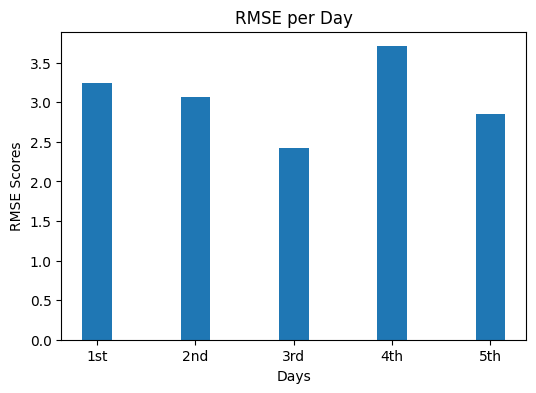

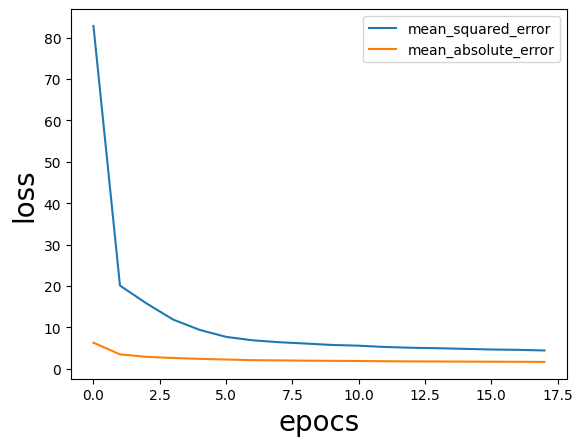

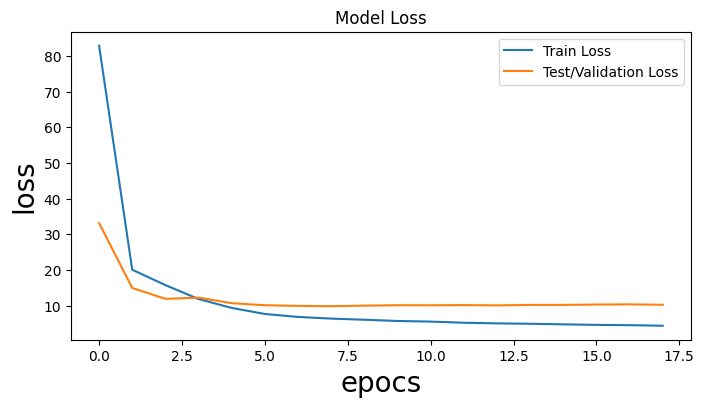

Model: "sequential_45"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_45 (ConvLSTM2D)  (None, 1, 3, 32)         15488     
                                                                 
 flatten_45 (Flatten)        (None, 96)                0         
                                                                 
 repeat_vector_45 (RepeatVec  (None, 5, 96)            0         
 tor)                                                            
                                                                 
 lstm_45 (LSTM)              (None, 5, 200)            237600    
                                                                 
 time_distributed_90 (TimeDi  (None, 5, 100)           20100     
 stributed)                                                      
                                                                 
 time_distributed_91 (TimeDi  (None, 5, 1)           

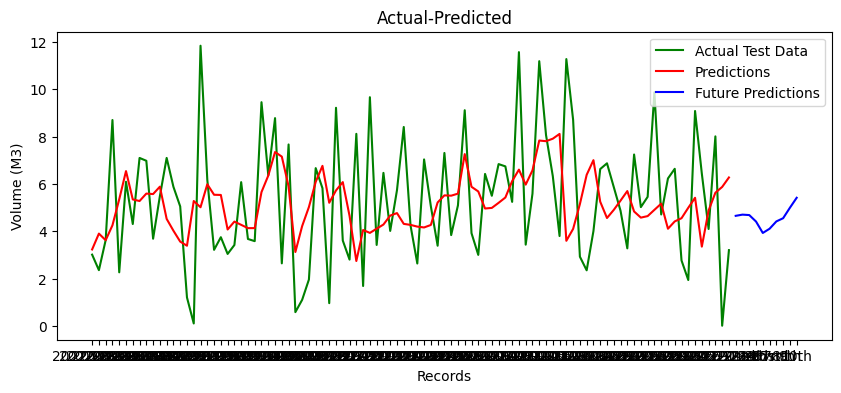

ConvLSTM: 2.669 RMSE (+/- 0.519) cfg_list [1, 5, 32, 100, 32, 10, 0.001, 200]


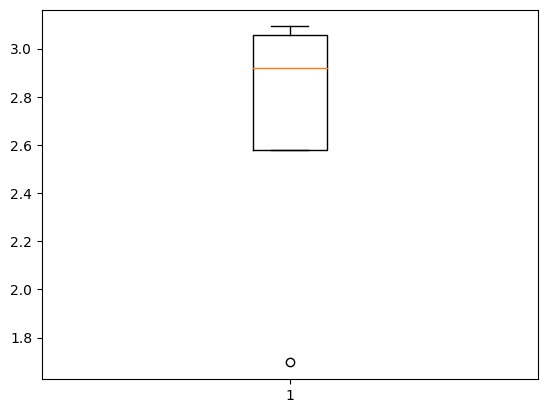

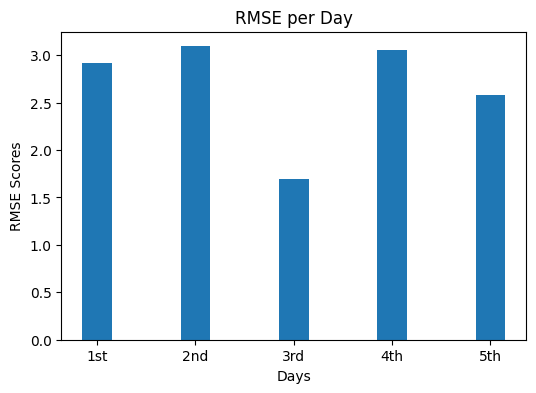

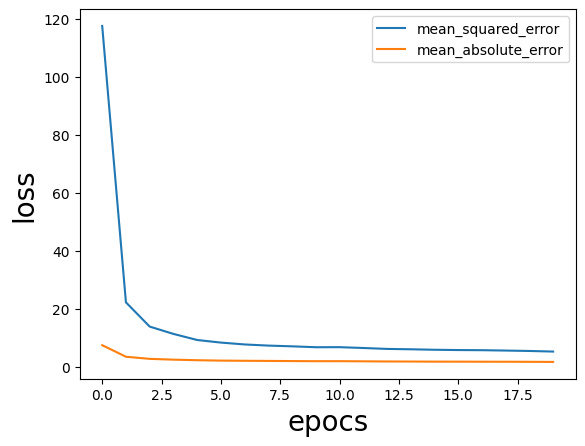

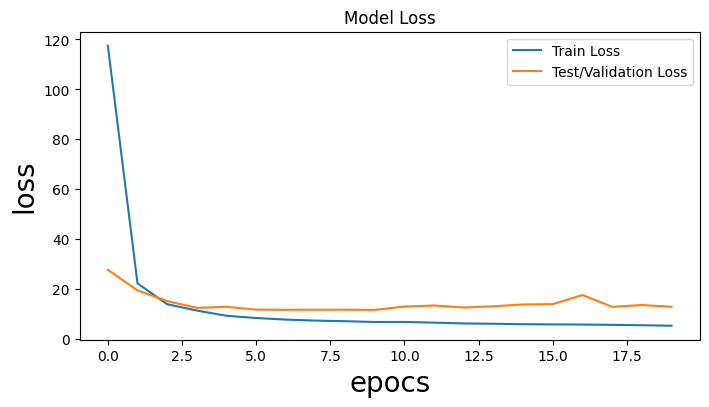

Model: "sequential_46"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_46 (ConvLSTM2D)  (None, 1, 3, 32)         15488     
                                                                 
 flatten_46 (Flatten)        (None, 96)                0         
                                                                 
 repeat_vector_46 (RepeatVec  (None, 5, 96)            0         
 tor)                                                            
                                                                 
 lstm_46 (LSTM)              (None, 5, 100)            78800     
                                                                 
 time_distributed_92 (TimeDi  (None, 5, 100)           10100     
 stributed)                                                      
                                                                 
 time_distributed_93 (TimeDi  (None, 5, 1)           

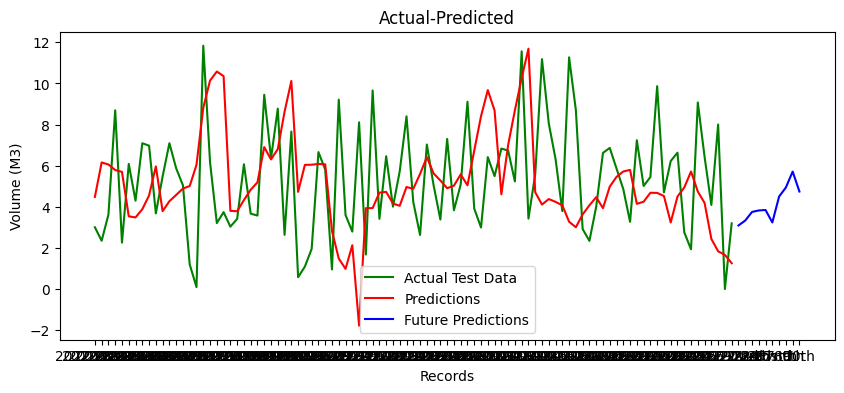

ConvLSTM: 3.401 RMSE (+/- 0.359) cfg_list [1, 5, 32, 100, 32, 10, 0.0001, 100]


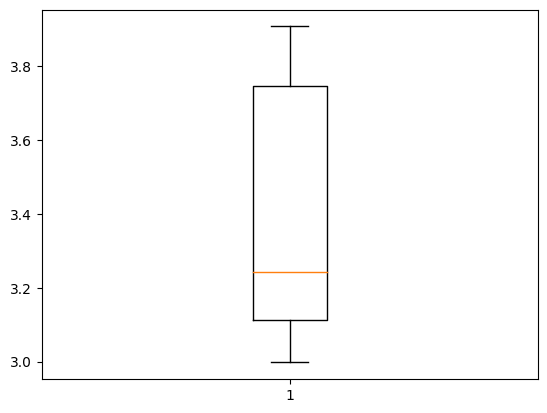

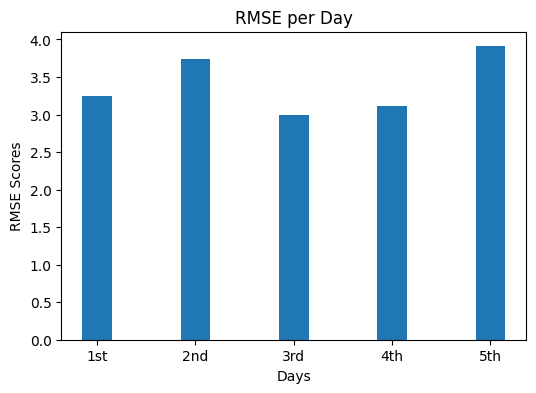

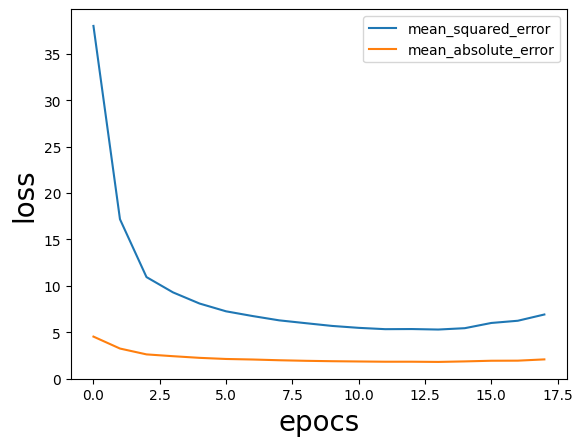

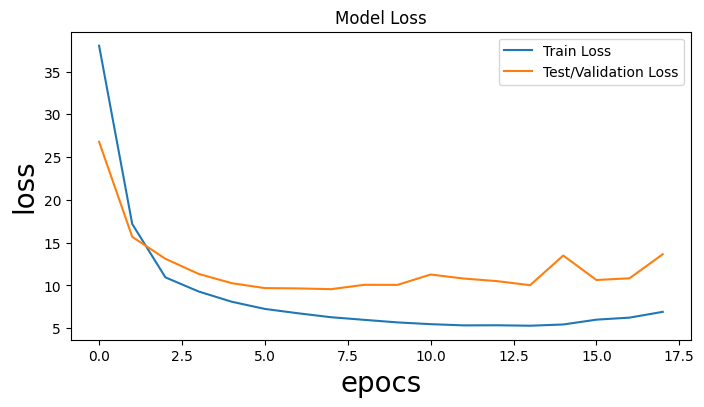

Model: "sequential_47"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_47 (ConvLSTM2D)  (None, 1, 3, 32)         15488     
                                                                 
 flatten_47 (Flatten)        (None, 96)                0         
                                                                 
 repeat_vector_47 (RepeatVec  (None, 5, 96)            0         
 tor)                                                            
                                                                 
 lstm_47 (LSTM)              (None, 5, 200)            237600    
                                                                 
 time_distributed_94 (TimeDi  (None, 5, 100)           20100     
 stributed)                                                      
                                                                 
 time_distributed_95 (TimeDi  (None, 5, 1)           

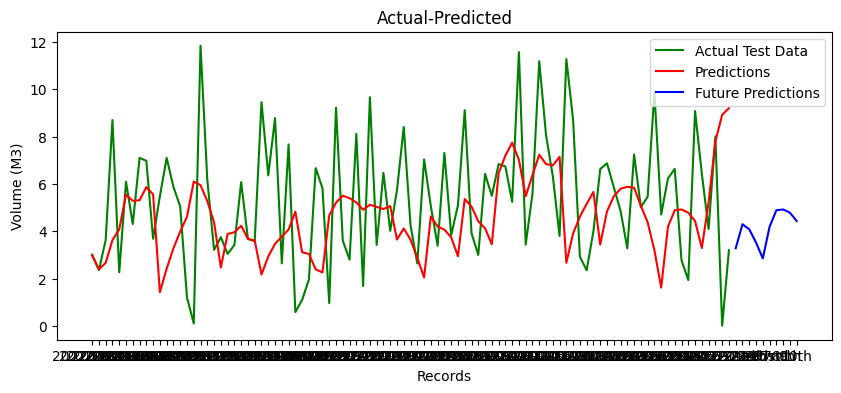

ConvLSTM: 3.080 RMSE (+/- 0.573) cfg_list [1, 5, 32, 100, 32, 10, 0.0001, 200]


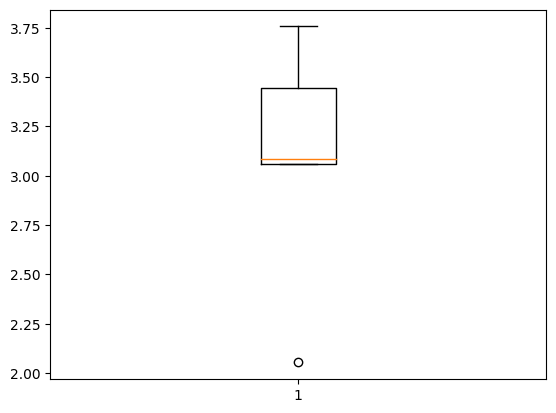

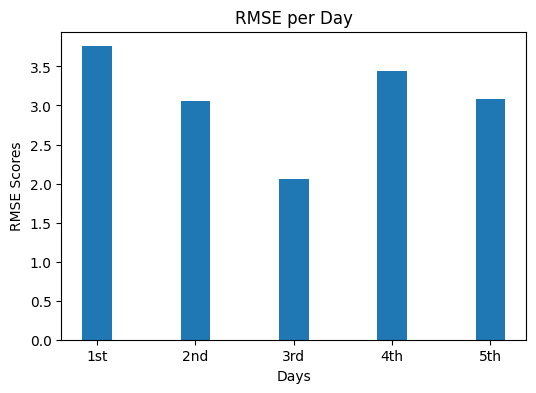

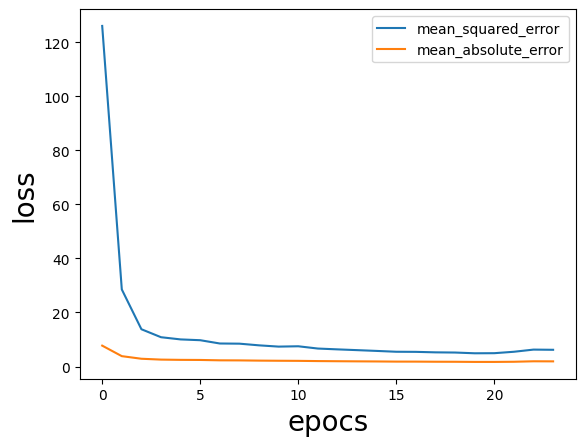

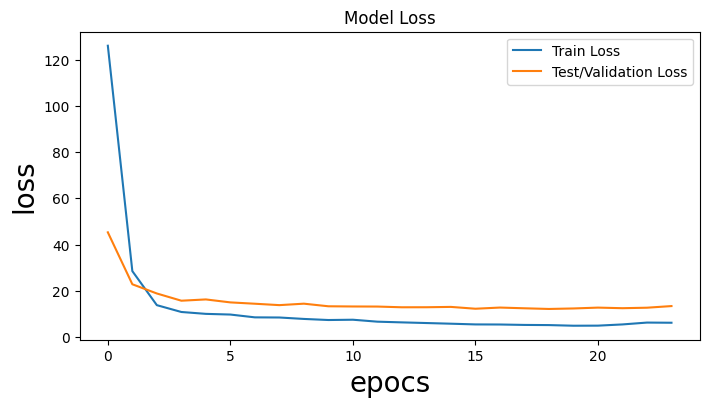

Model: "sequential_48"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_48 (ConvLSTM2D)  (None, 1, 3, 64)         55552     
                                                                 
 flatten_48 (Flatten)        (None, 192)               0         
                                                                 
 repeat_vector_48 (RepeatVec  (None, 5, 192)           0         
 tor)                                                            
                                                                 
 lstm_48 (LSTM)              (None, 5, 100)            117200    
                                                                 
 time_distributed_96 (TimeDi  (None, 5, 100)           10100     
 stributed)                                                      
                                                                 
 time_distributed_97 (TimeDi  (None, 5, 1)           

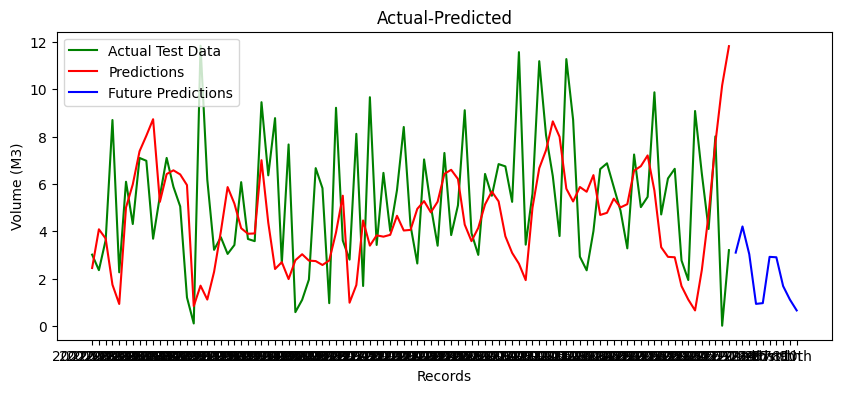

ConvLSTM: 3.332 RMSE (+/- 0.786) cfg_list [1, 5, 64, 100, 16, 5, 0.001, 100]


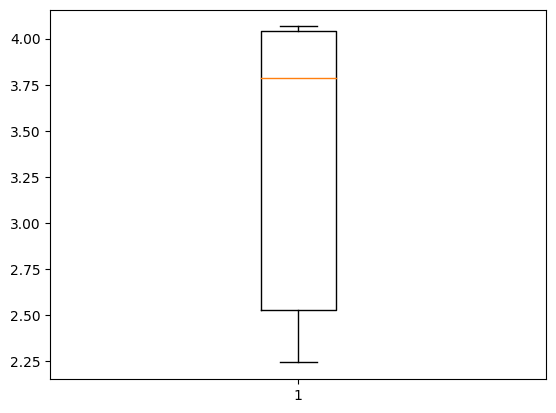

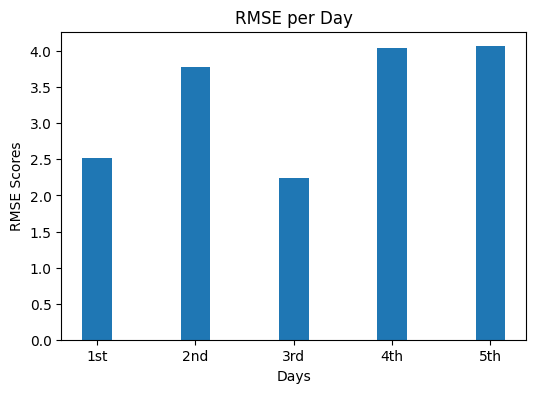

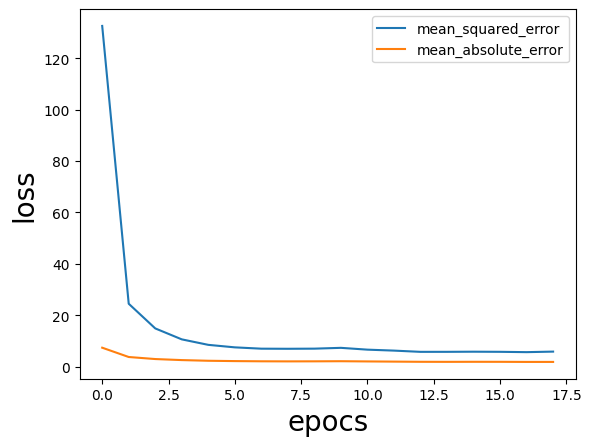

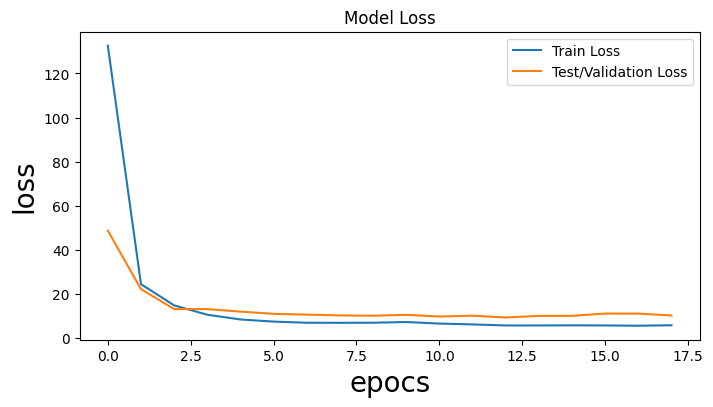

Model: "sequential_49"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_49 (ConvLSTM2D)  (None, 1, 3, 64)         55552     
                                                                 
 flatten_49 (Flatten)        (None, 192)               0         
                                                                 
 repeat_vector_49 (RepeatVec  (None, 5, 192)           0         
 tor)                                                            
                                                                 
 lstm_49 (LSTM)              (None, 5, 200)            314400    
                                                                 
 time_distributed_98 (TimeDi  (None, 5, 100)           20100     
 stributed)                                                      
                                                                 
 time_distributed_99 (TimeDi  (None, 5, 1)           

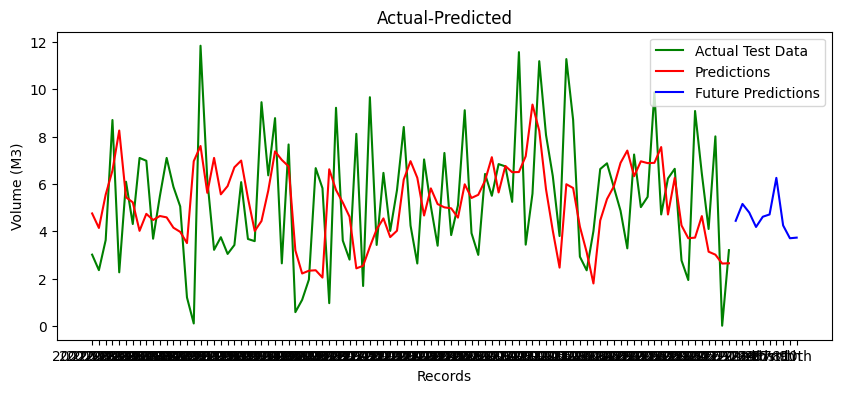

ConvLSTM: 2.718 RMSE (+/- 0.399) cfg_list [1, 5, 64, 100, 16, 5, 0.001, 200]


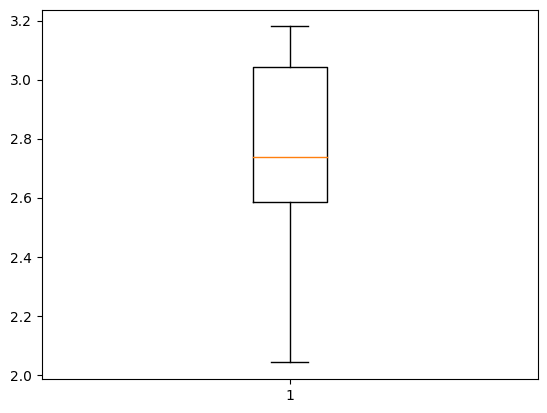

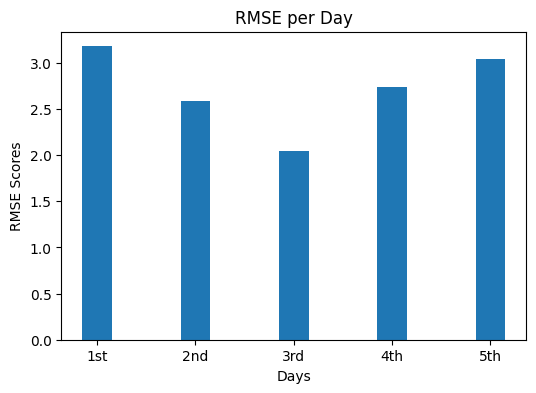

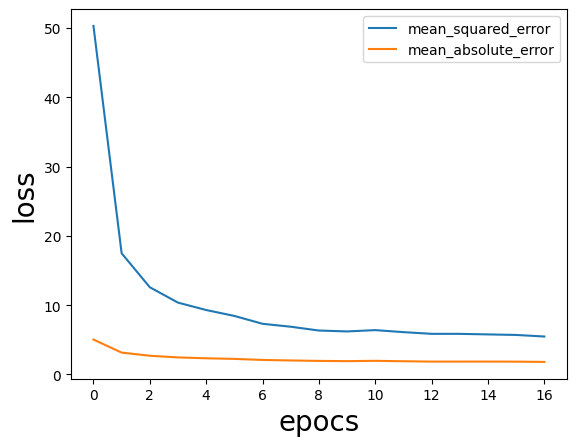

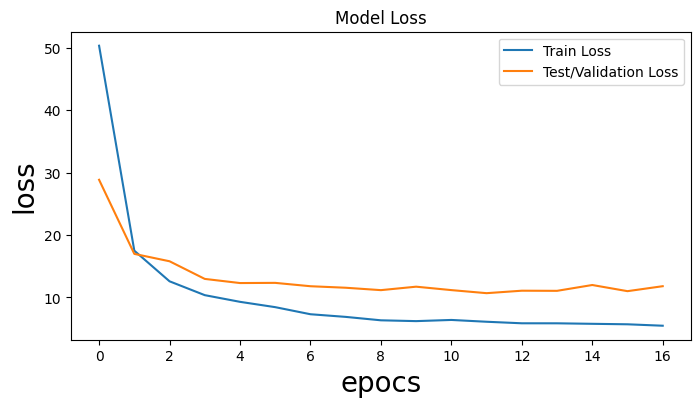

Model: "sequential_50"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_50 (ConvLSTM2D)  (None, 1, 3, 64)         55552     
                                                                 
 flatten_50 (Flatten)        (None, 192)               0         
                                                                 
 repeat_vector_50 (RepeatVec  (None, 5, 192)           0         
 tor)                                                            
                                                                 
 lstm_50 (LSTM)              (None, 5, 100)            117200    
                                                                 
 time_distributed_100 (TimeD  (None, 5, 100)           10100     
 istributed)                                                     
                                                                 
 time_distributed_101 (TimeD  (None, 5, 1)           

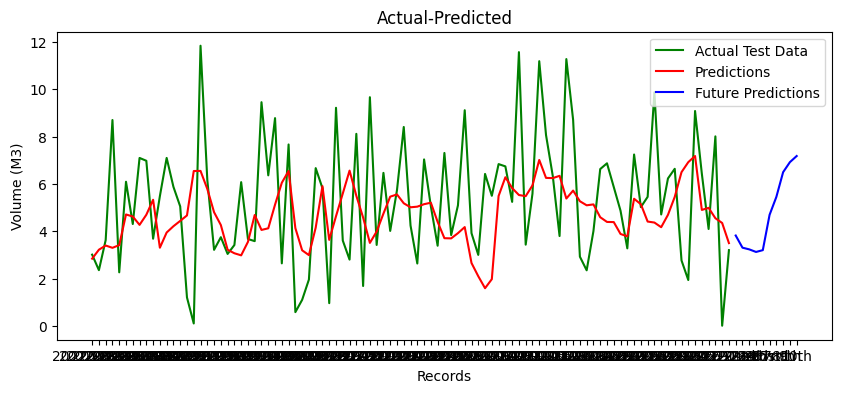

ConvLSTM: 2.665 RMSE (+/- 0.586) cfg_list [1, 5, 64, 100, 16, 5, 0.0001, 100]


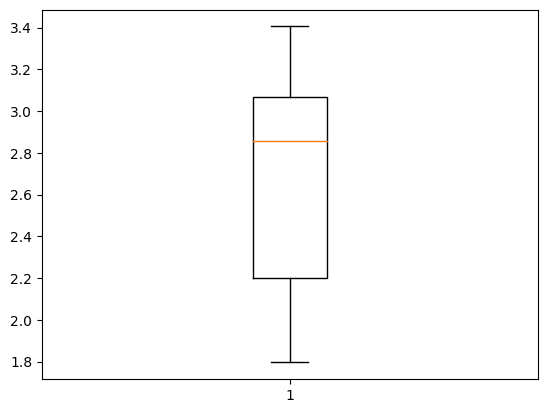

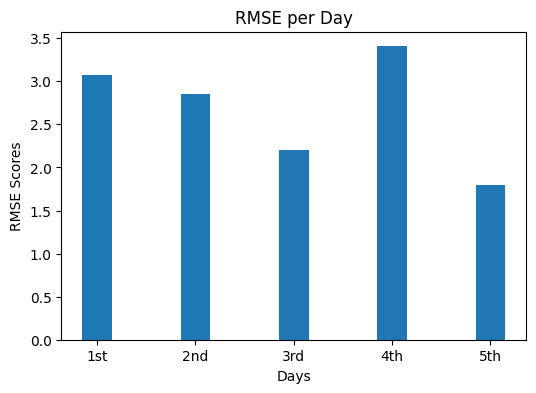

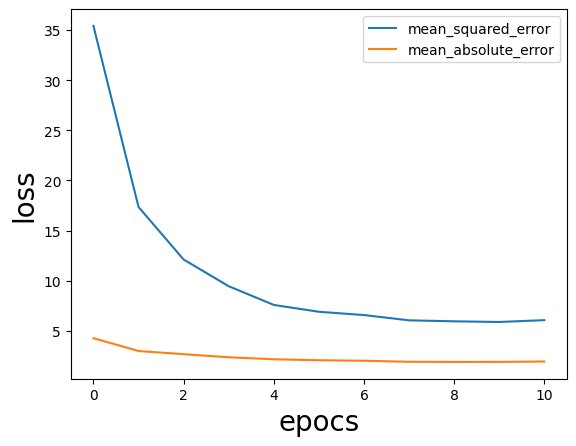

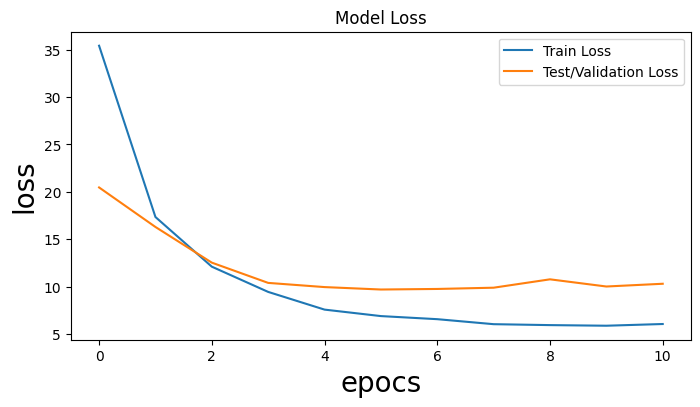

Model: "sequential_51"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_51 (ConvLSTM2D)  (None, 1, 3, 64)         55552     
                                                                 
 flatten_51 (Flatten)        (None, 192)               0         
                                                                 
 repeat_vector_51 (RepeatVec  (None, 5, 192)           0         
 tor)                                                            
                                                                 
 lstm_51 (LSTM)              (None, 5, 200)            314400    
                                                                 
 time_distributed_102 (TimeD  (None, 5, 100)           20100     
 istributed)                                                     
                                                                 
 time_distributed_103 (TimeD  (None, 5, 1)           

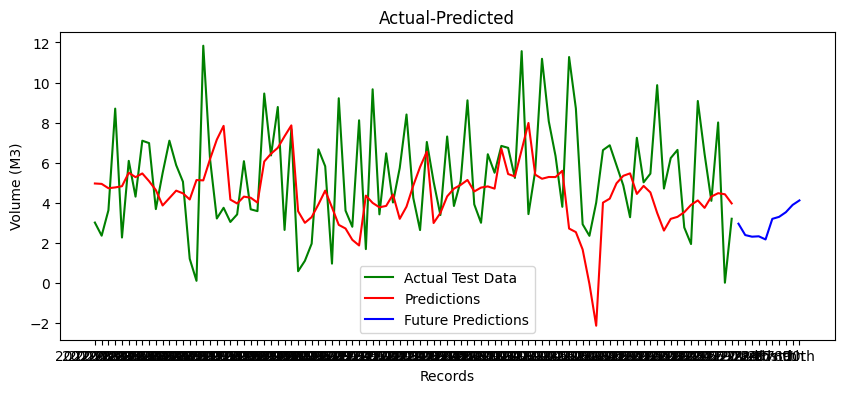

ConvLSTM: 2.925 RMSE (+/- 0.674) cfg_list [1, 5, 64, 100, 16, 5, 0.0001, 200]


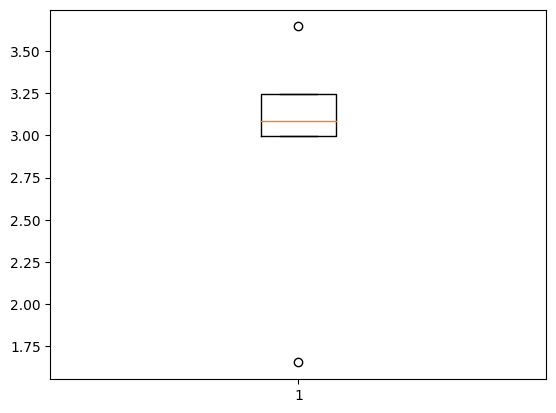

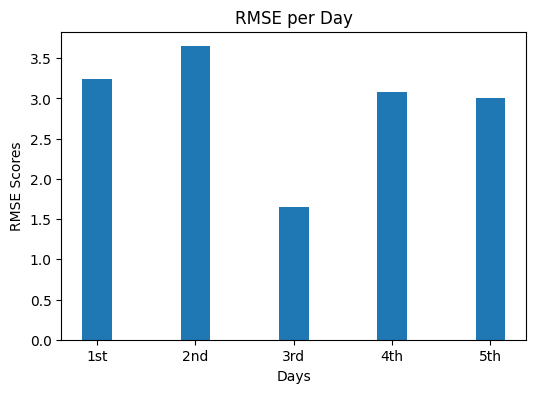

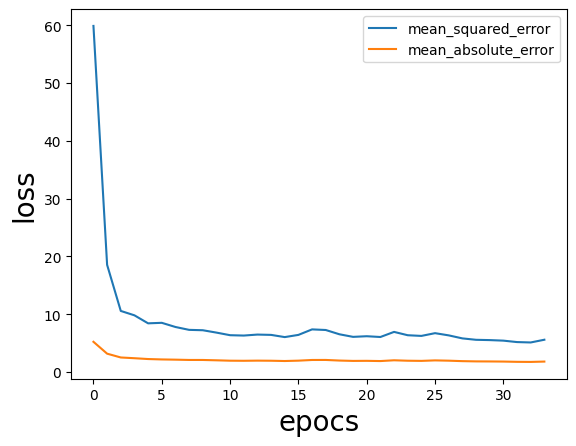

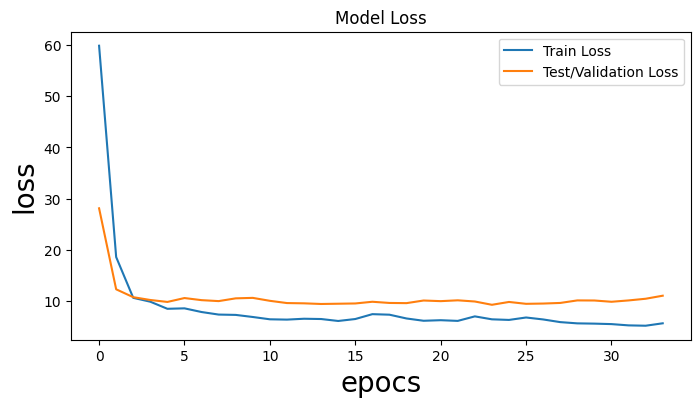

Model: "sequential_52"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_52 (ConvLSTM2D)  (None, 1, 3, 64)         55552     
                                                                 
 flatten_52 (Flatten)        (None, 192)               0         
                                                                 
 repeat_vector_52 (RepeatVec  (None, 5, 192)           0         
 tor)                                                            
                                                                 
 lstm_52 (LSTM)              (None, 5, 100)            117200    
                                                                 
 time_distributed_104 (TimeD  (None, 5, 100)           10100     
 istributed)                                                     
                                                                 
 time_distributed_105 (TimeD  (None, 5, 1)           

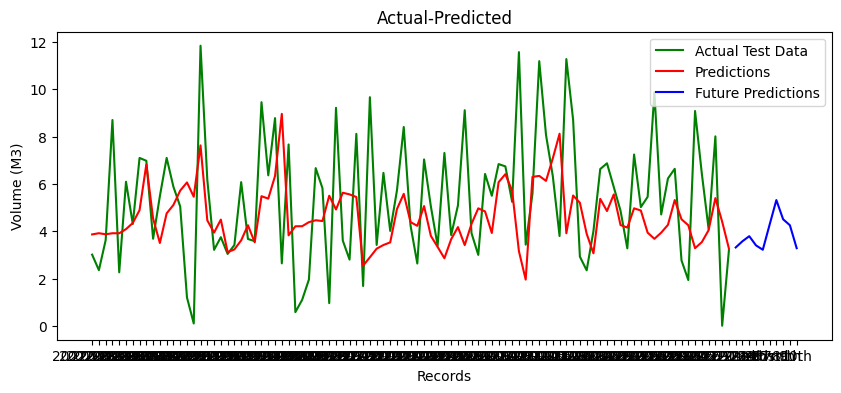

ConvLSTM: 2.787 RMSE (+/- 0.524) cfg_list [1, 5, 64, 100, 16, 10, 0.001, 100]


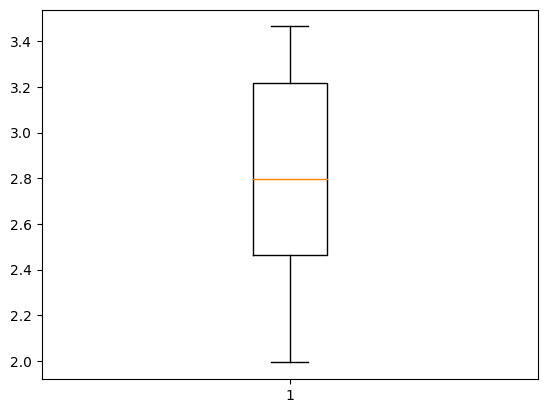

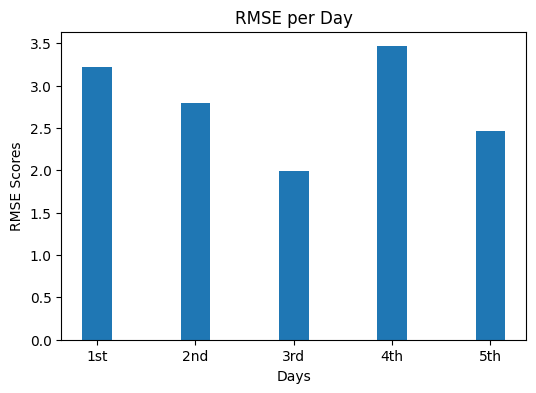

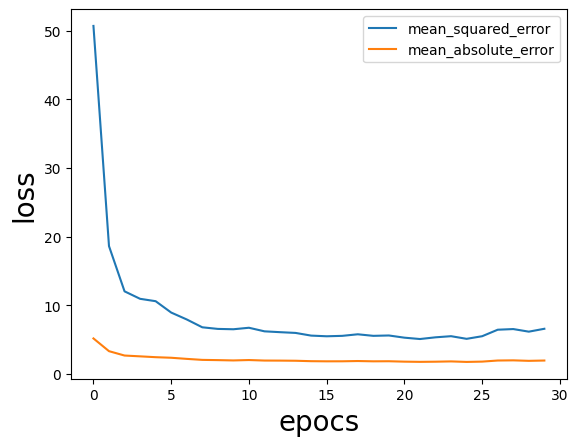

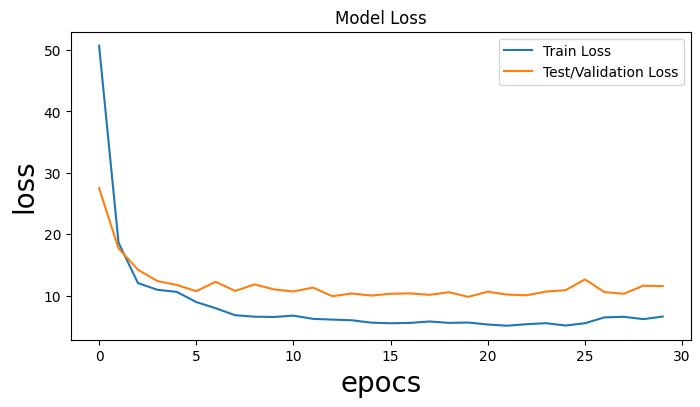

Model: "sequential_53"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_53 (ConvLSTM2D)  (None, 1, 3, 64)         55552     
                                                                 
 flatten_53 (Flatten)        (None, 192)               0         
                                                                 
 repeat_vector_53 (RepeatVec  (None, 5, 192)           0         
 tor)                                                            
                                                                 
 lstm_53 (LSTM)              (None, 5, 200)            314400    
                                                                 
 time_distributed_106 (TimeD  (None, 5, 100)           20100     
 istributed)                                                     
                                                                 
 time_distributed_107 (TimeD  (None, 5, 1)           

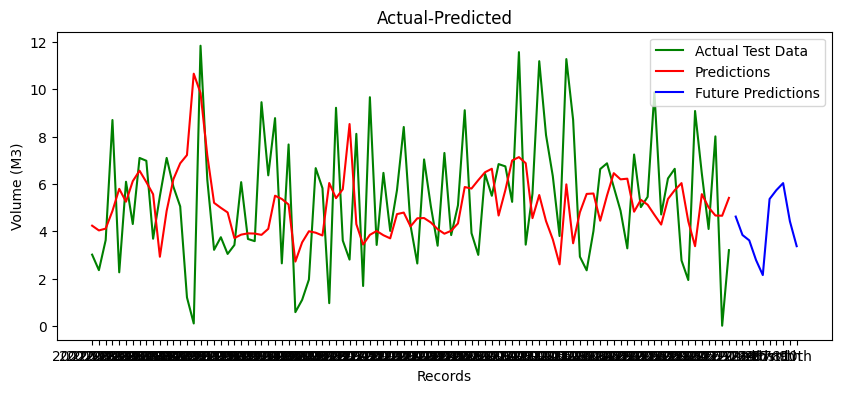

ConvLSTM: 2.894 RMSE (+/- 0.455) cfg_list [1, 5, 64, 100, 16, 10, 0.001, 200]


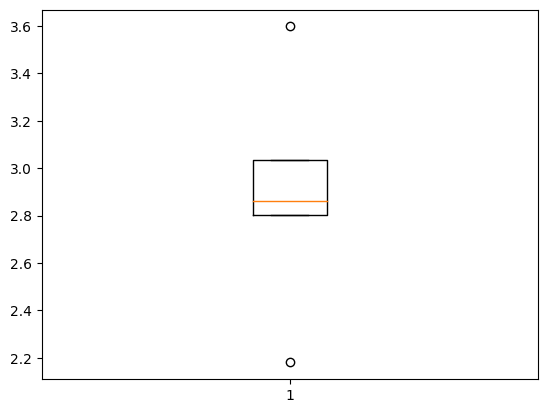

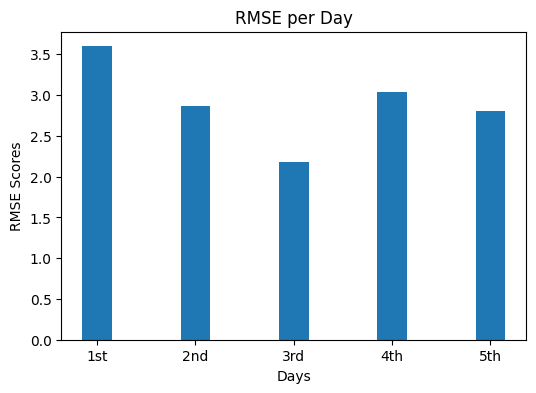

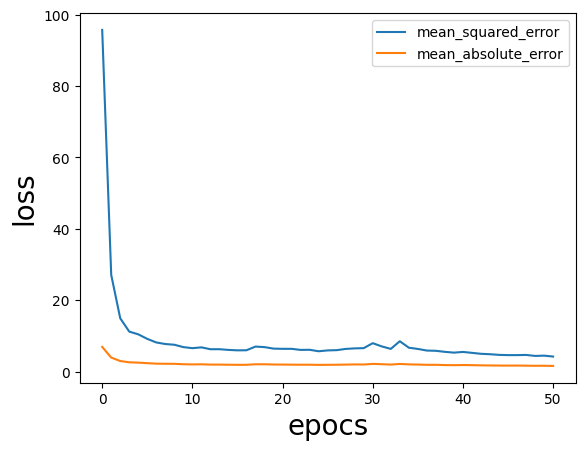

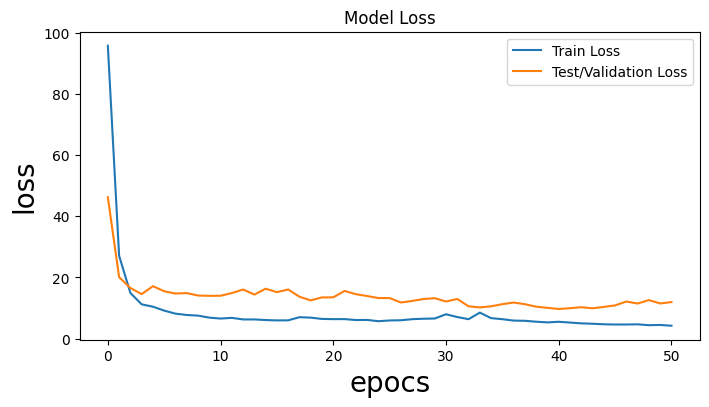

Model: "sequential_54"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_54 (ConvLSTM2D)  (None, 1, 3, 64)         55552     
                                                                 
 flatten_54 (Flatten)        (None, 192)               0         
                                                                 
 repeat_vector_54 (RepeatVec  (None, 5, 192)           0         
 tor)                                                            
                                                                 
 lstm_54 (LSTM)              (None, 5, 100)            117200    
                                                                 
 time_distributed_108 (TimeD  (None, 5, 100)           10100     
 istributed)                                                     
                                                                 
 time_distributed_109 (TimeD  (None, 5, 1)           

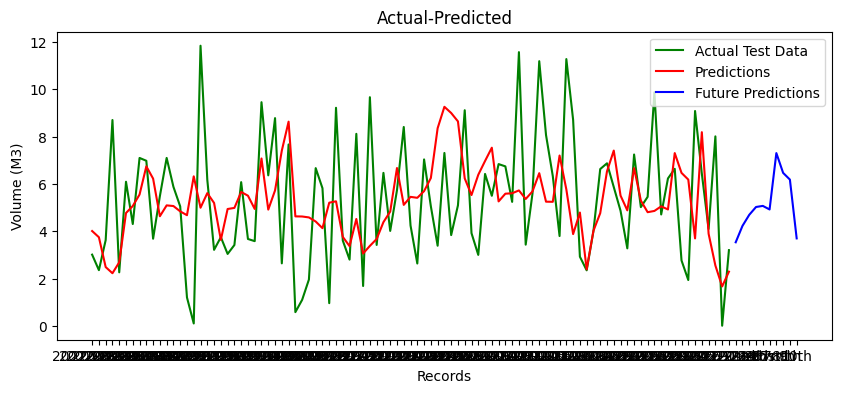

ConvLSTM: 2.772 RMSE (+/- 0.445) cfg_list [1, 5, 64, 100, 16, 10, 0.0001, 100]


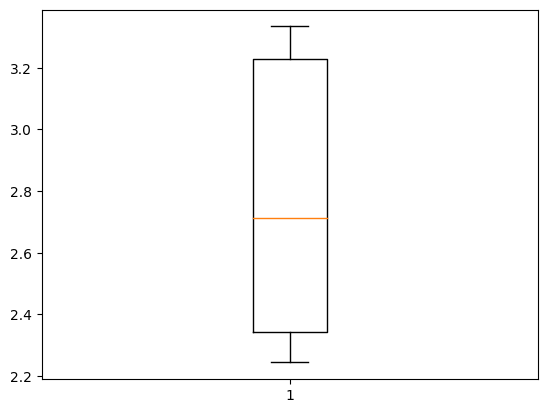

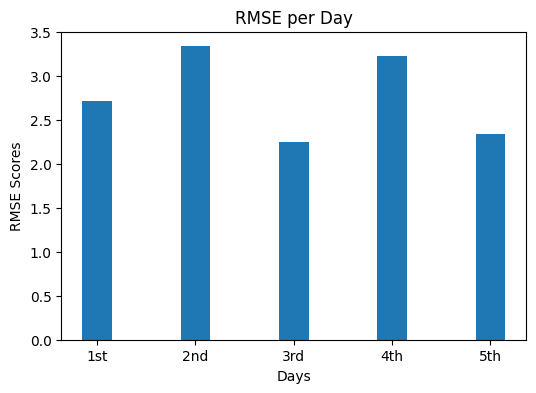

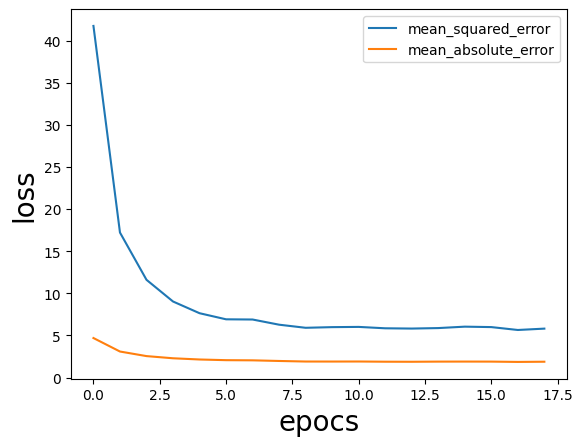

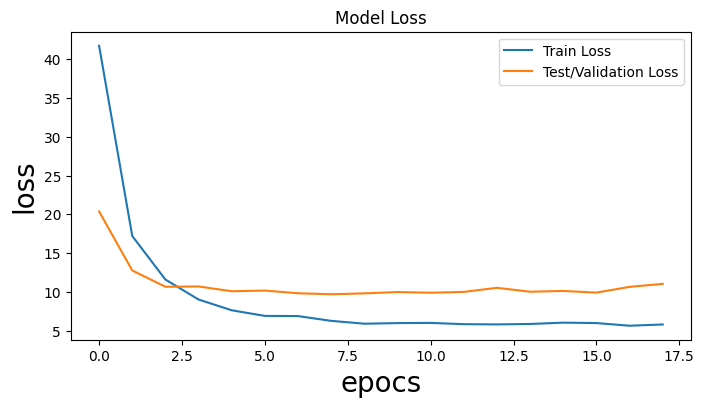

Model: "sequential_55"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_55 (ConvLSTM2D)  (None, 1, 3, 64)         55552     
                                                                 
 flatten_55 (Flatten)        (None, 192)               0         
                                                                 
 repeat_vector_55 (RepeatVec  (None, 5, 192)           0         
 tor)                                                            
                                                                 
 lstm_55 (LSTM)              (None, 5, 200)            314400    
                                                                 
 time_distributed_110 (TimeD  (None, 5, 100)           20100     
 istributed)                                                     
                                                                 
 time_distributed_111 (TimeD  (None, 5, 1)           

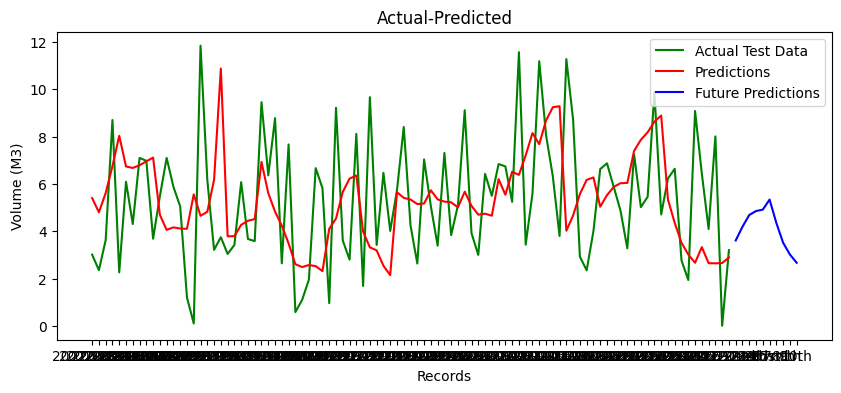

ConvLSTM: 2.901 RMSE (+/- 0.535) cfg_list [1, 5, 64, 100, 16, 10, 0.0001, 200]


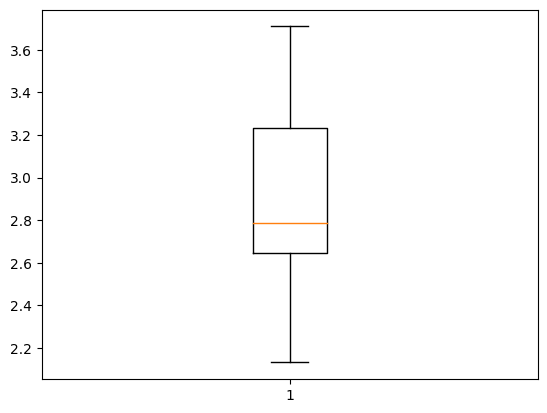

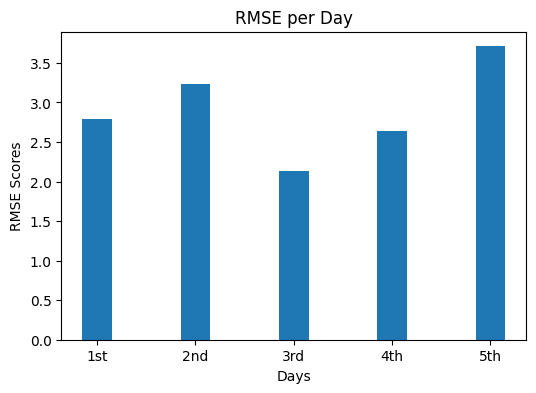

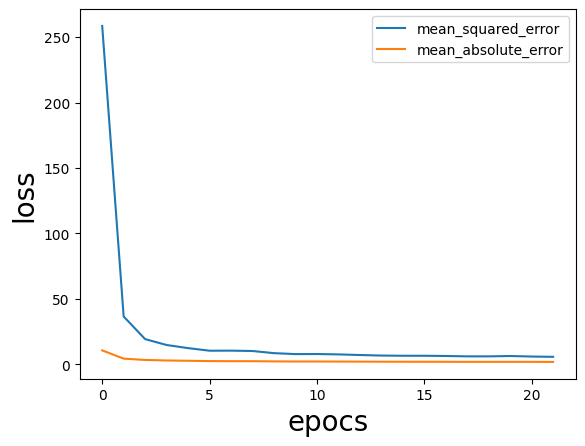

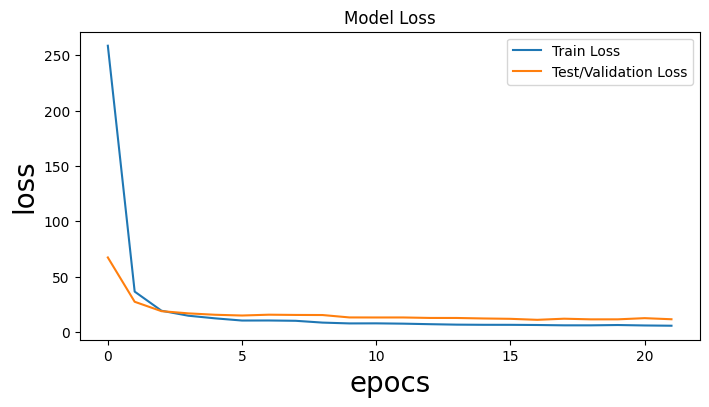

Model: "sequential_56"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_56 (ConvLSTM2D)  (None, 1, 3, 64)         55552     
                                                                 
 flatten_56 (Flatten)        (None, 192)               0         
                                                                 
 repeat_vector_56 (RepeatVec  (None, 5, 192)           0         
 tor)                                                            
                                                                 
 lstm_56 (LSTM)              (None, 5, 100)            117200    
                                                                 
 time_distributed_112 (TimeD  (None, 5, 100)           10100     
 istributed)                                                     
                                                                 
 time_distributed_113 (TimeD  (None, 5, 1)           

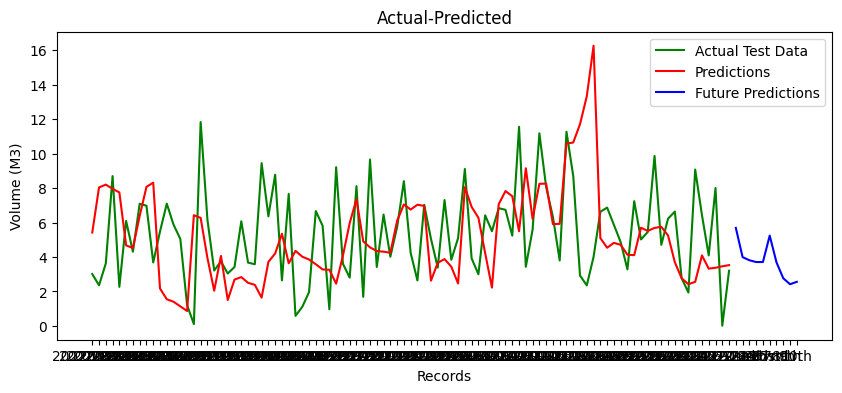

ConvLSTM: 3.545 RMSE (+/- 0.364) cfg_list [1, 5, 64, 100, 32, 5, 0.001, 100]


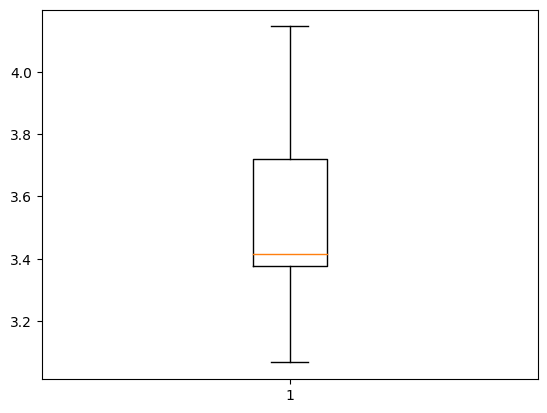

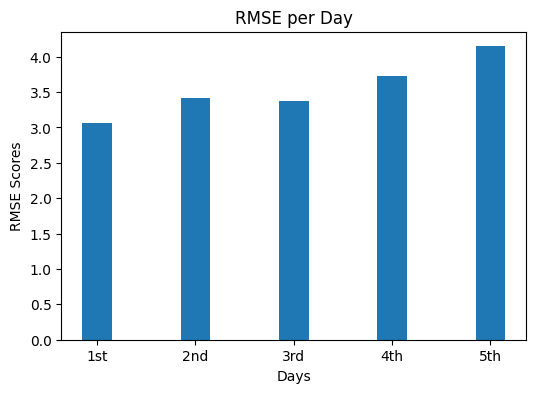

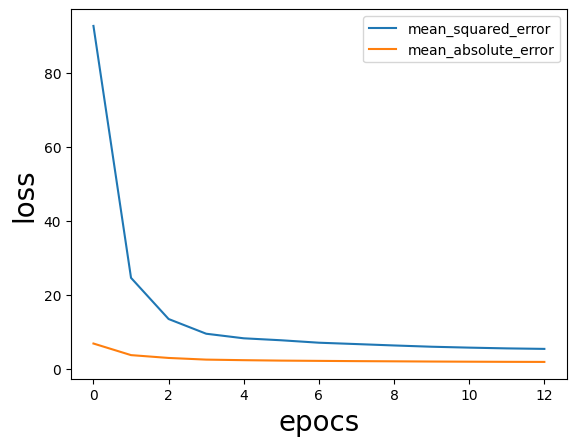

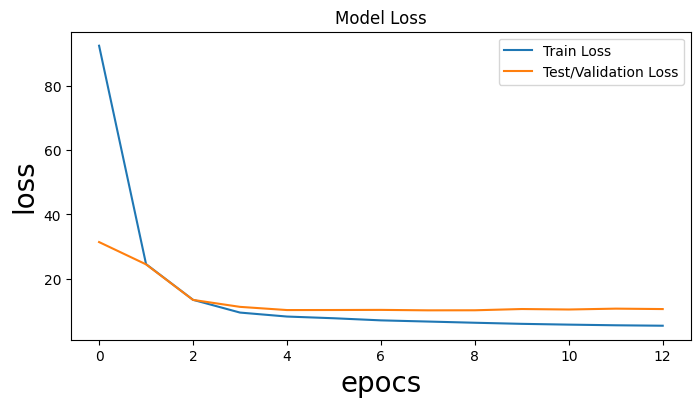

Model: "sequential_57"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_57 (ConvLSTM2D)  (None, 1, 3, 64)         55552     
                                                                 
 flatten_57 (Flatten)        (None, 192)               0         
                                                                 
 repeat_vector_57 (RepeatVec  (None, 5, 192)           0         
 tor)                                                            
                                                                 
 lstm_57 (LSTM)              (None, 5, 200)            314400    
                                                                 
 time_distributed_114 (TimeD  (None, 5, 100)           20100     
 istributed)                                                     
                                                                 
 time_distributed_115 (TimeD  (None, 5, 1)           

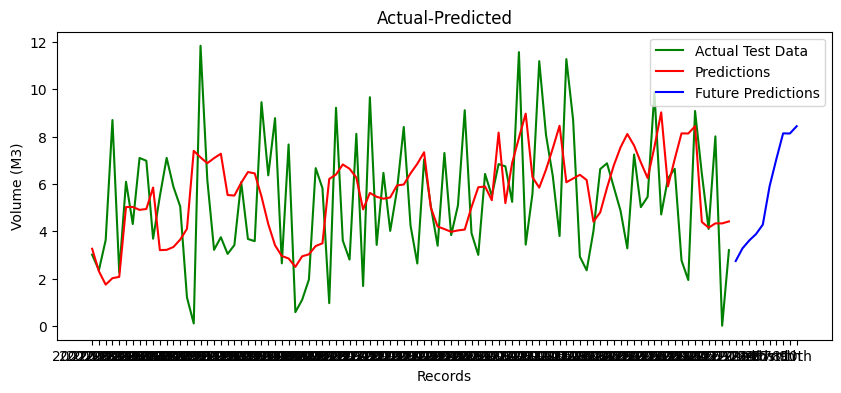

ConvLSTM: 2.953 RMSE (+/- 0.288) cfg_list [1, 5, 64, 100, 32, 5, 0.001, 200]


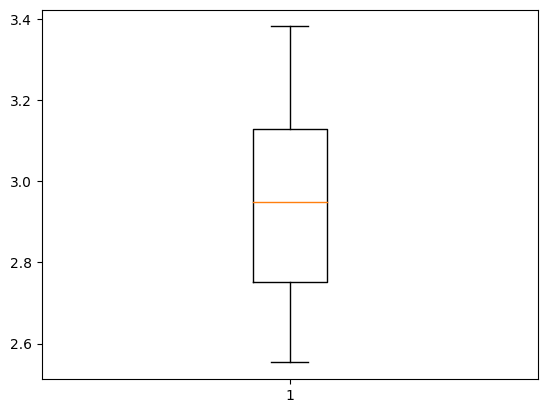

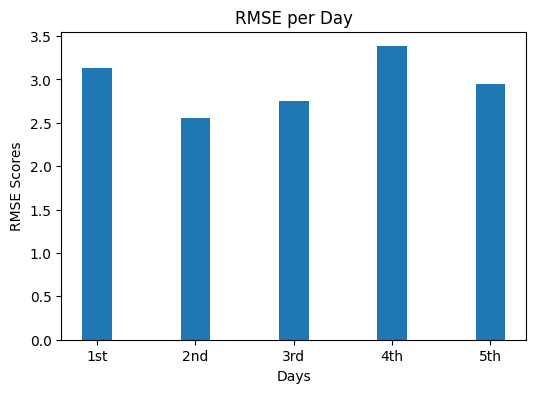

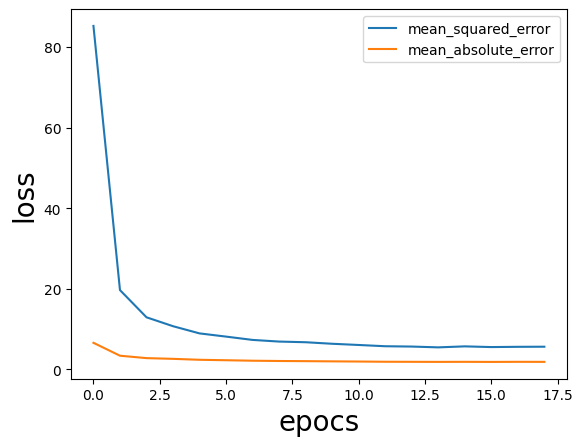

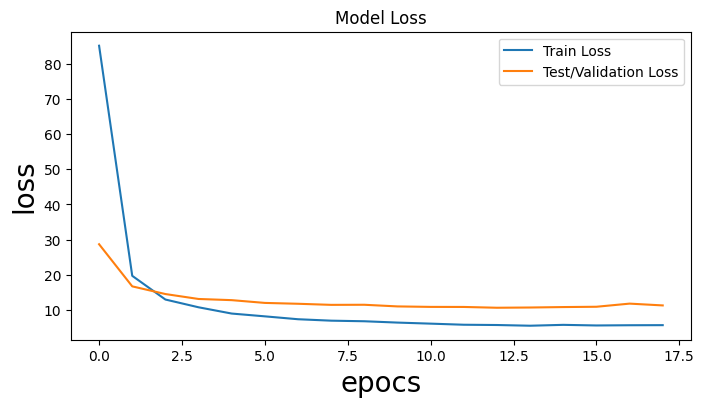

Model: "sequential_58"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_58 (ConvLSTM2D)  (None, 1, 3, 64)         55552     
                                                                 
 flatten_58 (Flatten)        (None, 192)               0         
                                                                 
 repeat_vector_58 (RepeatVec  (None, 5, 192)           0         
 tor)                                                            
                                                                 
 lstm_58 (LSTM)              (None, 5, 100)            117200    
                                                                 
 time_distributed_116 (TimeD  (None, 5, 100)           10100     
 istributed)                                                     
                                                                 
 time_distributed_117 (TimeD  (None, 5, 1)           

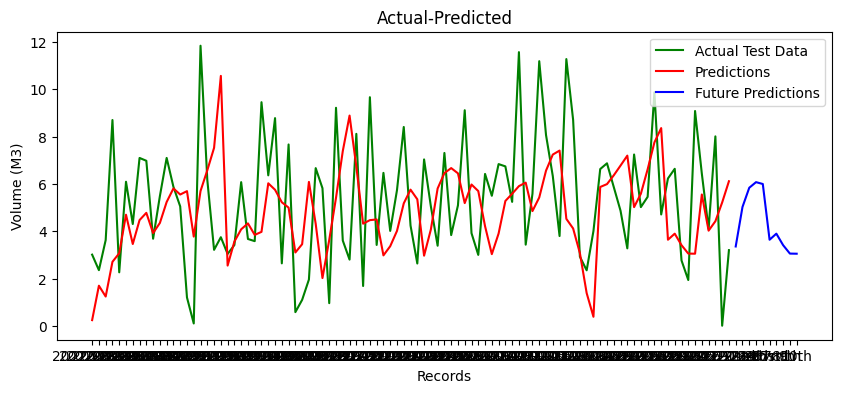

ConvLSTM: 2.968 RMSE (+/- 0.460) cfg_list [1, 5, 64, 100, 32, 5, 0.0001, 100]


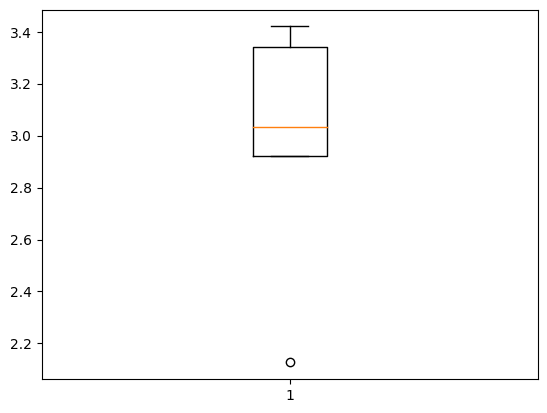

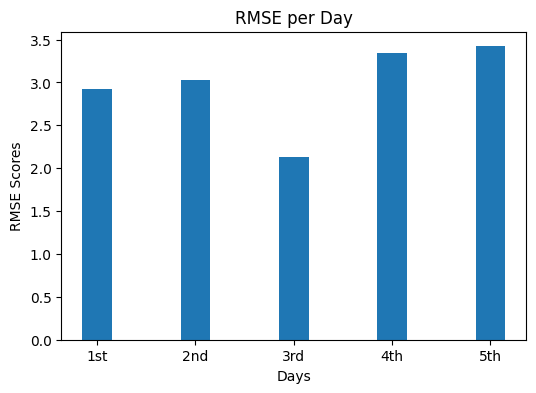

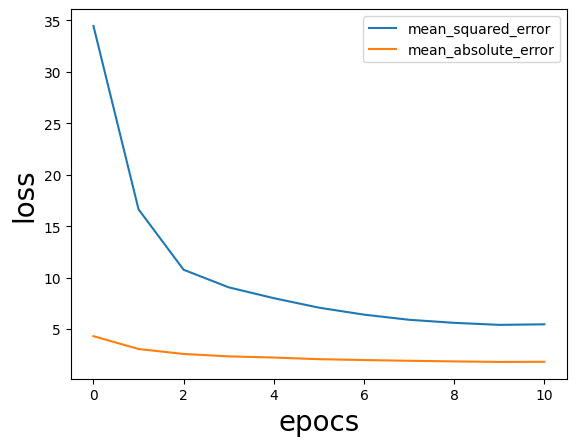

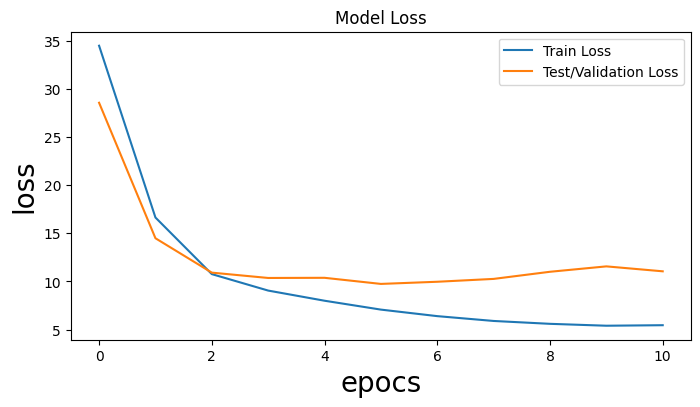

Model: "sequential_59"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_59 (ConvLSTM2D)  (None, 1, 3, 64)         55552     
                                                                 
 flatten_59 (Flatten)        (None, 192)               0         
                                                                 
 repeat_vector_59 (RepeatVec  (None, 5, 192)           0         
 tor)                                                            
                                                                 
 lstm_59 (LSTM)              (None, 5, 200)            314400    
                                                                 
 time_distributed_118 (TimeD  (None, 5, 100)           20100     
 istributed)                                                     
                                                                 
 time_distributed_119 (TimeD  (None, 5, 1)           

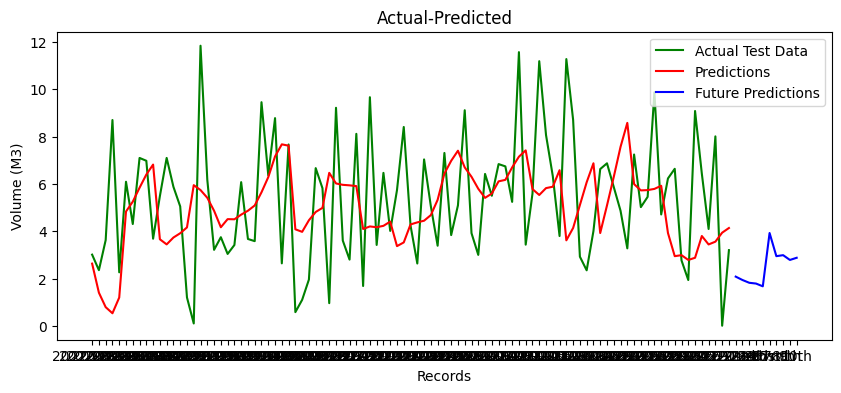

ConvLSTM: 2.890 RMSE (+/- 0.515) cfg_list [1, 5, 64, 100, 32, 5, 0.0001, 200]


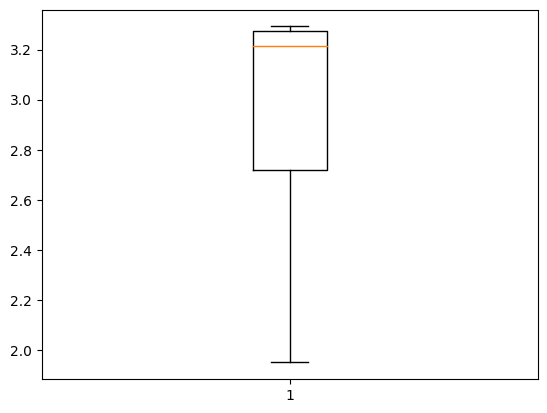

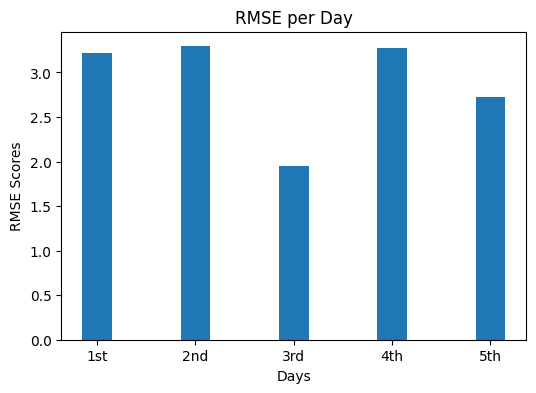

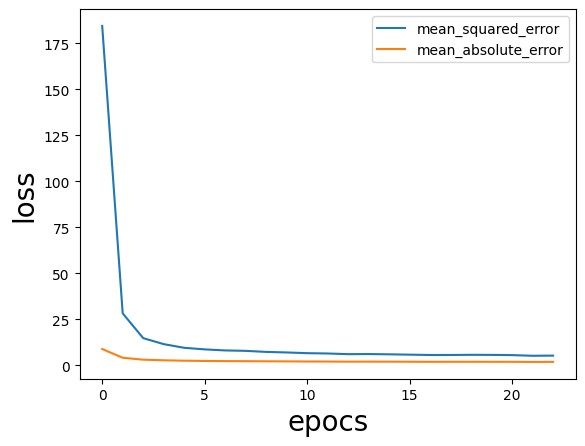

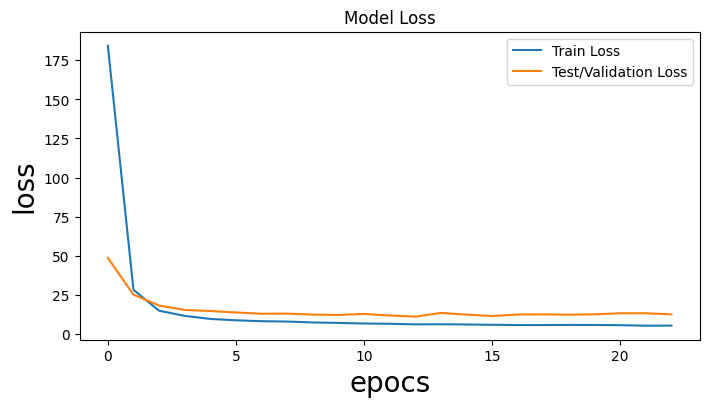

Model: "sequential_60"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_60 (ConvLSTM2D)  (None, 1, 3, 64)         55552     
                                                                 
 flatten_60 (Flatten)        (None, 192)               0         
                                                                 
 repeat_vector_60 (RepeatVec  (None, 5, 192)           0         
 tor)                                                            
                                                                 
 lstm_60 (LSTM)              (None, 5, 100)            117200    
                                                                 
 time_distributed_120 (TimeD  (None, 5, 100)           10100     
 istributed)                                                     
                                                                 
 time_distributed_121 (TimeD  (None, 5, 1)           

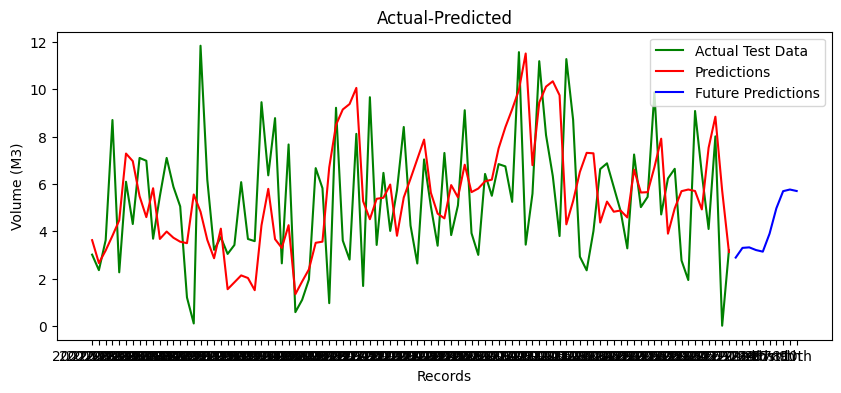

ConvLSTM: 3.027 RMSE (+/- 0.211) cfg_list [1, 5, 64, 100, 32, 10, 0.001, 100]


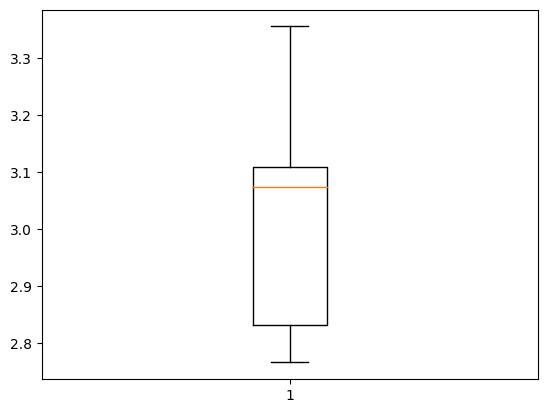

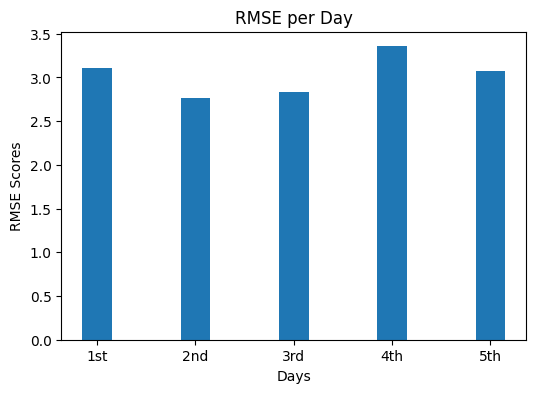

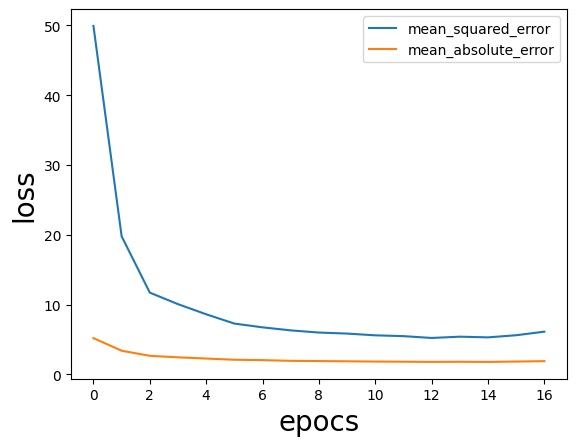

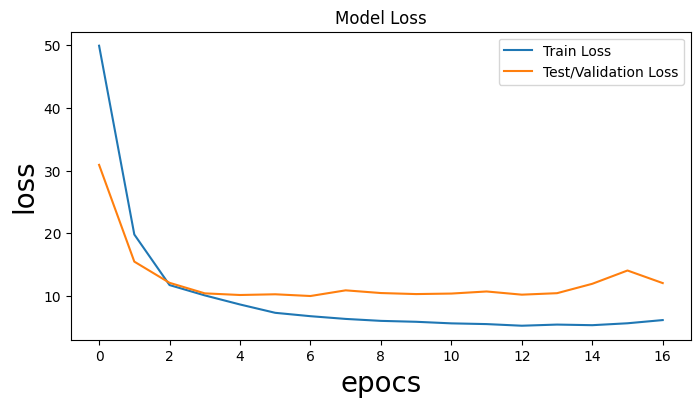

Model: "sequential_61"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_61 (ConvLSTM2D)  (None, 1, 3, 64)         55552     
                                                                 
 flatten_61 (Flatten)        (None, 192)               0         
                                                                 
 repeat_vector_61 (RepeatVec  (None, 5, 192)           0         
 tor)                                                            
                                                                 
 lstm_61 (LSTM)              (None, 5, 200)            314400    
                                                                 
 time_distributed_122 (TimeD  (None, 5, 100)           20100     
 istributed)                                                     
                                                                 
 time_distributed_123 (TimeD  (None, 5, 1)           

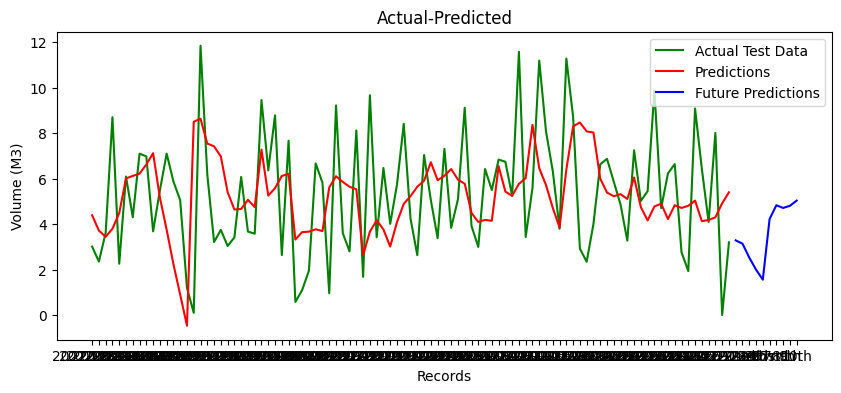

ConvLSTM: 2.745 RMSE (+/- 0.507) cfg_list [1, 5, 64, 100, 32, 10, 0.001, 200]


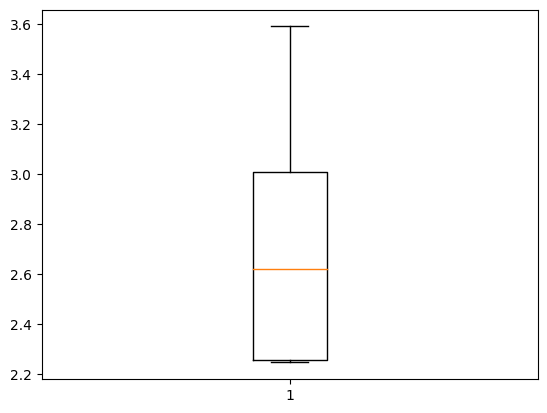

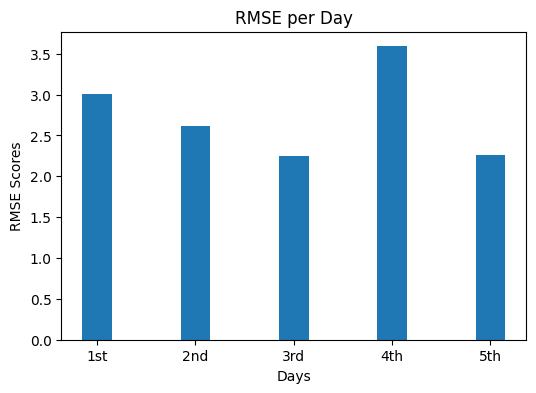

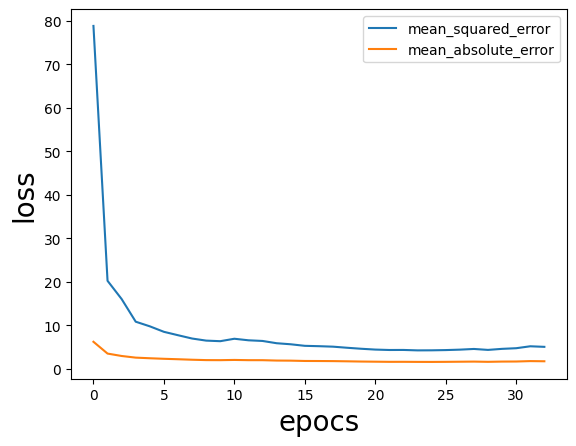

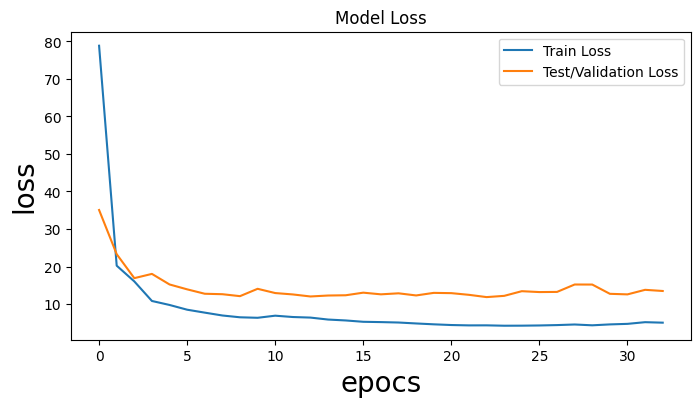

Model: "sequential_62"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_62 (ConvLSTM2D)  (None, 1, 3, 64)         55552     
                                                                 
 flatten_62 (Flatten)        (None, 192)               0         
                                                                 
 repeat_vector_62 (RepeatVec  (None, 5, 192)           0         
 tor)                                                            
                                                                 
 lstm_62 (LSTM)              (None, 5, 100)            117200    
                                                                 
 time_distributed_124 (TimeD  (None, 5, 100)           10100     
 istributed)                                                     
                                                                 
 time_distributed_125 (TimeD  (None, 5, 1)           

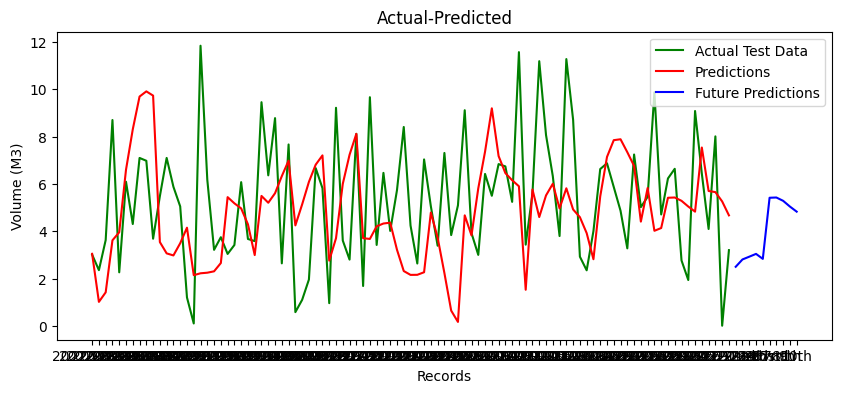

ConvLSTM: 3.051 RMSE (+/- 0.577) cfg_list [1, 5, 64, 100, 32, 10, 0.0001, 100]


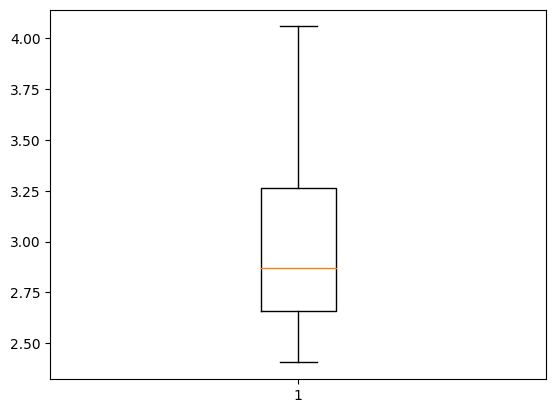

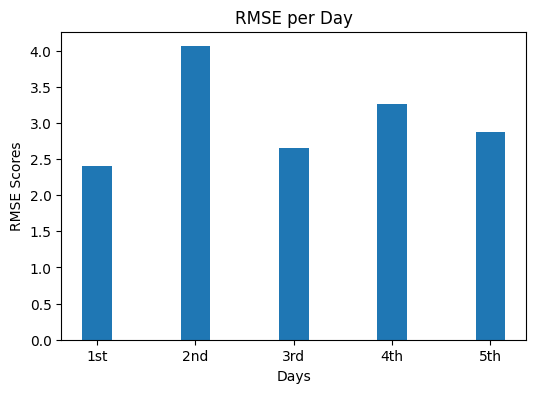

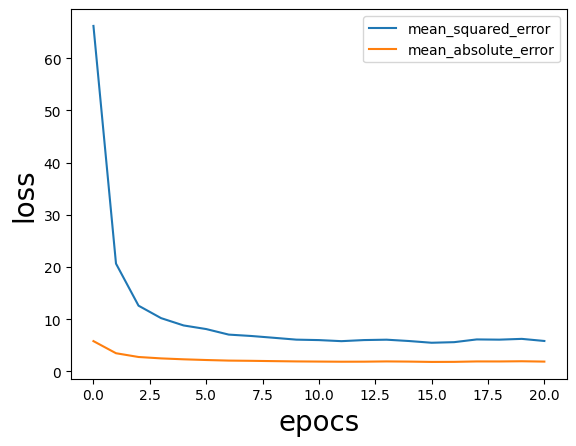

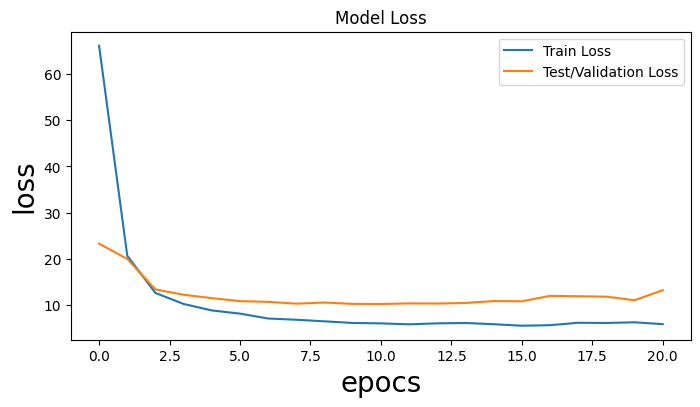

Model: "sequential_63"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_63 (ConvLSTM2D)  (None, 1, 3, 64)         55552     
                                                                 
 flatten_63 (Flatten)        (None, 192)               0         
                                                                 
 repeat_vector_63 (RepeatVec  (None, 5, 192)           0         
 tor)                                                            
                                                                 
 lstm_63 (LSTM)              (None, 5, 200)            314400    
                                                                 
 time_distributed_126 (TimeD  (None, 5, 100)           20100     
 istributed)                                                     
                                                                 
 time_distributed_127 (TimeD  (None, 5, 1)           

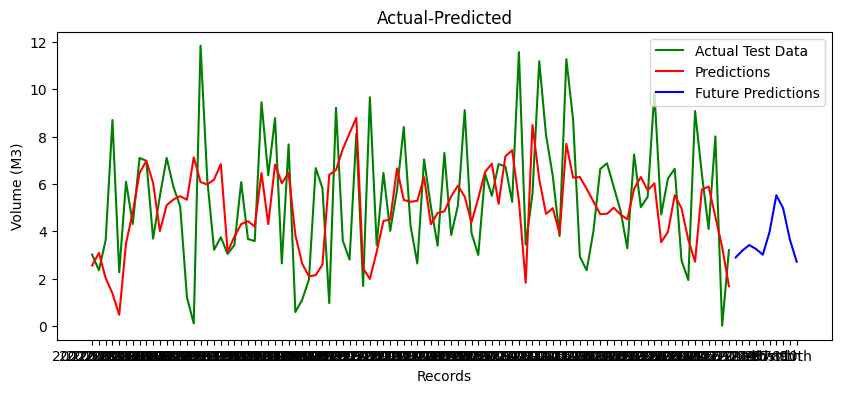

ConvLSTM: 2.723 RMSE (+/- 0.471) cfg_list [1, 5, 64, 100, 32, 10, 0.0001, 200]


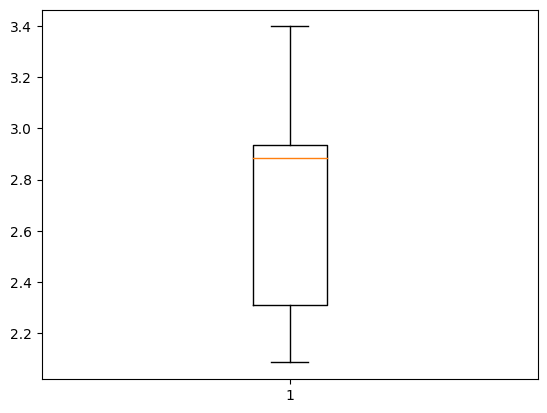

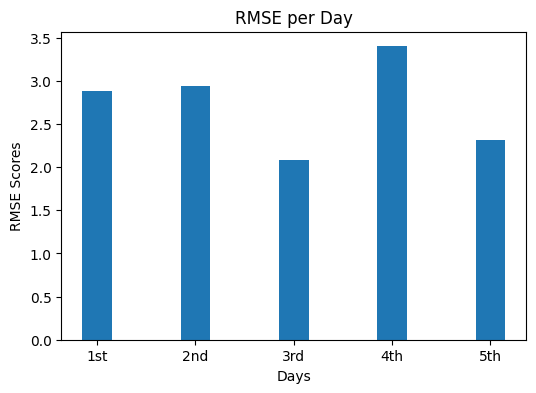

{'name': 'ConvLSTM', 'score_mean': 2.54401541836038, 'cfg_list': [1, 3, 32, 100, 16, 10, 0.001, 100]}
{'name': 'ConvLSTM', 'score_mean': 2.5948276995282074, 'cfg_list': [1, 3, 64, 100, 16, 5, 0.001, 200]}
{'name': 'ConvLSTM', 'score_mean': 2.662395075418824, 'cfg_list': [1, 3, 64, 100, 16, 10, 0.0001, 200]}
{'name': 'ConvLSTM', 'score_mean': 2.665089303815386, 'cfg_list': [1, 5, 64, 100, 16, 5, 0.0001, 100]}
{'name': 'ConvLSTM', 'score_mean': 2.6689201647207397, 'cfg_list': [1, 3, 64, 100, 16, 10, 0.001, 100]}
{'name': 'ConvLSTM', 'score_mean': 2.6691368567725267, 'cfg_list': [1, 5, 32, 100, 32, 10, 0.001, 200]}
{'name': 'ConvLSTM', 'score_mean': 2.6873956115472026, 'cfg_list': [1, 3, 64, 100, 32, 10, 0.001, 200]}
{'name': 'ConvLSTM', 'score_mean': 2.6931652997971915, 'cfg_list': [1, 3, 64, 100, 32, 5, 0.0001, 200]}
{'name': 'ConvLSTM', 'score_mean': 2.6966299581444035, 'cfg_list': [1, 3, 64, 100, 16, 5, 0.0001, 100]}
{'name': 'ConvLSTM', 'score_mean': 2.697260923063383, 'cfg_list': [1

In [ ]:
# split dataset into standard bulks
# 0.20-testing dataset, 0.80-training dataset
p=0.20
bulks=5  #in every bulk 5 sample will be stored
n=int(len(df_input)-len(df_input)*p)
k=int(n%bulks)      #remaining
t=n-k       #training dataset reach until this place
s=int(len(df_input)-t)%bulks        #last remanining

# take 'Date' column
train, test = df_input[0:t], df_input[t:-s]
test_date=test['Date']
#print("test_date",test_date)

# eliminate the 'Date' column
df_input=df_input[['Volume', 'Gross_Weight', 'Day_dif', 'Week_Number', 'Months', 'Year_encoded', 'Season_encoded', 'Day_encoded']]

# split into train and test
train, test = split_dataset(df_input,t)

# model configs
cfg_lists = model_configs()

#idetify one empty tuple
results=()
# evaluate model and get scores
for cfg_list in cfg_lists:
  score, scores, predicted_1d, model, cfg_list= evaluate_model(train, test, cfg_list, test_date)
  #score, scores, predicted_1d, model, cfg_list= evaluate_model(train, test, n_steps, n_length, n_input,test_date)

  # summarize scores
  summary=summarize_scores('ConvLSTM', score, scores, cfg_list)

  # add summary variable values to the tuple
  results += (summary,)

  # plot scores
  days = ['1st', '2nd', '3rd', '4th', '5th']   #the size of the bulks which we mentioned while spliting the dataset at the begining and the the day numbers should be equal
  fig = pyplot.figure(figsize=(6, 4))
  pyplot.bar(days, scores, width=0.3, label='ConvLSTM')
  # Add labels and title
  plt.xlabel('Days')
  plt.ylabel('RMSE Scores')
  plt.title('RMSE per Day')
  pyplot.show()

sorted_summaries=sorted(results, key=lambda x: x["score_mean"])
for i, summary in enumerate(sorted_summaries):
  print(summary)